<a href="https://colab.research.google.com/github/arezoo17/explainable-credit-risk/blob/main/Credit_Risk_XAI_Thesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Thesis Notebook: Explainable AI for Credit Risk Assessment
# 📘 Credit Risk Modeling with Machine Learning (German Credit Dataset)

This notebook is part of a master's thesis titled:

> **"Improving Credit Risk in Digital Lending: Leveraging Machine Learning Models to Improve Accuracy"**

The objective of this notebook is to build a reproducible and interpretable machine learning pipeline for credit risk prediction. Specifically, we aim to:

- Preprocess the **German Credit dataset** from the UCI repository.
- Handle **categorical encoding, feature scaling, and class imbalance**.
- Train and evaluate three key machine learning models:
  - **Logistic Regression** (transparent, baseline model)
  - **Random Forest** (ensemble method with built-in feature importance)
  - **XGBoost** (boosted trees with state-of-the-art performance)
- Explain the model predictions using **SHAP values** and **LIME** for interpretability.
- Evaluate and compare models using multiple metrics:
  - Accuracy
  - Precision
  - Recall
  - F1-score
  - AUC-ROC

---

## 🧾 Dataset Overview

The dataset consists of **1000 credit applications**, each with **20 input features** and **1 target label**:

- **Target variable**: `Class`  
  - `1` = Good credit (non-default)  
  - `2` = Bad credit (default)  
  - In this notebook, we will remap the target as:
    - `1 → 0` (non-default)
    - `2 → 1` (default – our positive class)

The dataset includes:
- **Categorical features** (e.g., checking account status, credit history, loan purpose)
- **Numeric features** (e.g., loan duration, credit amount, age)
- **Binary indicators** (e.g., owns telephone, foreign worker status)

The variable meanings are taken from the official UCI documentation.

---

## 📌 Workflow Structure

The notebook is organized into the following steps:

1. **Data Loading & Initial Exploration**
2. **Feature Renaming & Cleaning**
3. **Label Transformation**
4. **Categorical Variable Encoding**
5. **Numerical Feature Scaling**
6. **Class Imbalance Handling (SMOTE)**
7. **Model Training**
8. **Model Evaluation (Cross-Validation Metrics)**
9. **Model Explainability (SHAP for RF/XGBoost, Coefficients for LR)**

## Feature Dictionary: German Credit Dataset

Below is the complete description of all features used in this dataset, including their names, types, and category values (where applicable), based on the original UCI documentation.

---

### Numerical Features

| Feature Name       | Description                                              | Unit        |
|--------------------|----------------------------------------------------------|-------------|
| `Duration`         | Duration of the loan                                     | Months      |
| `Credit_amount`    | Loan amount requested                                    | Deutsche Mark (DM) |
| `Installment_rate` | Installment rate as a percentage of disposable income    | %           |
| `Present_resid`    | Number of years at current residence                     | Years       |
| `Age`              | Age of the applicant                                     | Years       |
| `Num_credits`      | Number of existing credits at this bank                  | Count       |
| `Num_people`       | Number of dependents to support                          | Count       |

---

### Binary Features

| Feature Name      | Description                                  | Categories                  |
|-------------------|----------------------------------------------|-----------------------------|
| `Telephone`       | Owns a telephone                             | A191: no / A192: yes        |
| `Foreign_worker`  | Is a foreign worker                          | A201: yes / A202: no        |

---

### Categorical Features (Encoded Strings)

| Feature Name          | Description                                          | Categories |
|------------------------|------------------------------------------------------|------------|
| `checking_account`     | Status of existing checking account                  | A11: <0 DM, A12: 0–200 DM, A13: ≥200 DM, A14: no checking account |
| `Credit_his`           | Credit history                                       | A30: no credit taken/ all credit pay back, A31: all paid, A32: current paid, A33: delay, A34: critical |
| `Purpose`              | Purpose of the loan                                  | A40: new car, A41: used car, A42: furniture, A43: radio/TV, A44: appliances, A45: repairs, A46: education, A47: vacation, A48: retraining, A49: business, A410: other |
| `Savings_account`      | Status of savings account/bonds                     | A61: <100 DM, A62: 100–500 DM, A63: 500–1000 DM, A64: ≥1000 DM, A65: unknown/no saving account |
| `Present_emp`          | Years at present employment                         | A71: unemployed, A72: <1 yr, A73: 1–4 yrs, A74: 4–7 yrs, A75: ≥7 yrs |
| `sex`                  | Personal status and sex                             | A91: male-div/sep, A92: female-married/div/sep, A93: male-single, A94: male-married/widowed, A95: female-single |
| `other_debtor`         | Other debtors or guarantors                         | A101: none, A102: co-applicant, A103: guarantor |
| `Property`             | Property type                                       | A121: real estate, A122: savings/insurance, A123: car, A124: none |
| `Other_install`        | Other installment plans                             | A141: bank, A142: stores, A143: none |
| `Housing`              | Housing status                                      | A151: rent, A152: own, A153: free |
| `Job`                  | Occupation type                                     | A171: unemployed-unskilled/nonresident, A172: unskilled-resident, A173: skilled employed/ official, A174: management/ seld-employed/ highly qualified employee / officer|

---

### Target Variable

| Feature Name | Description        | Categories          |
|--------------|--------------------|----------------------|
| `Class`      | Creditworthiness   | 1 = Good, 2 = Bad (will be remapped as 0 = good, 1 = default) |

## 1. Project Setup
In this section, we import required libraries, configure random seeds for reproducibility, and load the dataset. This sets a consistent foundation for all downstream tasks.

In [ ]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder


## 1. Load and Inspect the Dataset

In this step, we will:

1. **Import essential libraries** needed for data handling and exploration.
2. **Load the dataset** into memory using Pandas.
3. **Display the first few rows** to understand the structure.
4. **Check column data types and null values** using `.info()`.
5. **Count total missing values** to ensure data integrity.
6. **Examine the number of unique values** in each column to detect categorical variables.
7. **Identify all categorical features** and display their value counts to understand encoded labels.

Understanding the structure and content of the data is a critical first step before any preprocessing, model training, or evaluation.

| Step                    | Explanation                                                                   |
| ----------------------- | ----------------------------------------------------------------------------- |
| **Import libraries**    | We load the tools (`pandas`, `numpy`) to work with tabular data.              |
| **Read CSV**            | Loads the dataset file into a structured format (called a DataFrame).         |
| **Shape**               | Tells how many samples (rows) and features (columns) are present.             |
| **Head**                | Displays a preview of the dataset — useful for spotting formats.              |
| **Info**                | Shows each column's data type and whether it has missing values.              |
| **Null check**          | Ensures the data has no missing entries that could cause errors later.        |
| **nunique()**           | Helps identify binary, categorical, or unique ID-style columns.               |
| **Categorical columns** | Columns stored as 'object' type are usually non-numeric (e.g., 'A11', 'A14'). |
| **Class balance**       | Most credit datasets are imbalanced (e.g., 70% good, 30% bad credit).         |
| **Value counts**        | Reveals how frequent each category label is within every categorical column.  |

In [ ]:
# Load the German Credit dataset
df = pd.read_csv("/Users/arezoo/Documents/1.MDDB/MasterProject/Code/df_train.csv")
df_test = pd.read_csv("/Users/arezoo/Documents/1.MDDB/MasterProject/Code/df_test.csv")

In [ ]:
# View the first few rows
df.head()


,checking_account,duration_months,credit_history,purpose,credit_amount,savings_account,employment_duration,installment_rate,personal_status_sex,other_debtors,...,property,age,other_installment_plans,housing,existing_credits,job,num_dependents,telephone,foreign_worker,target
0,A12,12,A32,A40,1295,A61,A72,3,A92,A101,...,A123,25,A143,A151,1,A173,1,A191,A201,1
1,A14,18,A32,A49,1568,A62,A73,3,A92,A101,...,A122,24,A143,A151,1,A172,1,A191,A201,0
2,A14,18,A30,A49,4165,A61,A73,2,A93,A101,...,A123,36,A142,A152,2,A173,2,A191,A201,1
3,A12,24,A32,A43,1967,A61,A75,4,A92,A101,...,A123,20,A143,A152,1,A173,1,A192,A201,0
4,A14,11,A34,A40,7228,A61,A73,1,A93,A101,...,A122,39,A143,A152,2,A172,1,A191,A201,0


In [ ]:
# Basic shape and structure
print("Dataset shape:", df.shape)

Dataset shape: (700, 21)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   checking_account         700 non-null    object
 1   duration_months          700 non-null    int64 
 2   credit_history           700 non-null    object
 3   purpose                  700 non-null    object
 4   credit_amount            700 non-null    int64 
 5   savings_account          700 non-null    object
 6   employment_duration      700 non-null    object
 7   installment_rate         700 non-null    int64 
 8   personal_status_sex      700 non-null    object
 9   other_debtors            700 non-null    object
 10  residence_since          700 non-null    int64 
 11  property                 700 non-null    object
 12  age                      700 non-null    int64 
 13  other_installment_plans  700 non-null    object
 14  housing                  700 non-null    o

In [ ]:
# Check for missing values
print("\nMissing values:")
print(df.isnull().sum())


Missing values:
checking_account           0
duration_months            0
credit_history             0
purpose                    0
credit_amount              0
savings_account            0
employment_duration        0
installment_rate           0
personal_status_sex        0
other_debtors              0
residence_since            0
property                   0
age                        0
other_installment_plans    0
housing                    0
existing_credits           0
job                        0
num_dependents             0
telephone                  0
foreign_worker             0
target                     0
dtype: int64


In [ ]:
df.nunique()

checking_account             4
duration_months             30
credit_history               5
purpose                     10
credit_amount              658
savings_account              5
employment_duration          5
installment_rate             4
personal_status_sex          4
other_debtors                3
residence_since              4
property                     4
age                         52
other_installment_plans      3
housing                      3
existing_credits             4
job                          4
num_dependents               2
telephone                    2
foreign_worker               2
target                       2
dtype: int64

#### ! think about this cell

In [ ]:
cat_cols = [col for col in df.columns if df[col].dtypes == 'O']

for col in cat_cols:
    print(df[col].value_counts(), "\n\n")

checking_account
A14    276
A11    192
A12    188
A13     44
Name: count, dtype: int64 


credit_history
A32    362
A34    205
A33     67
A31     38
A30     28
Name: count, dtype: int64 


purpose
A43     186
A40     171
A42     126
A41      76
A49      69
A46      35
A45      16
A44      10
A410      6
A48       5
Name: count, dtype: int64 


savings_account
A61    417
A65    124
A62     81
A63     41
A64     37
Name: count, dtype: int64 


employment_duration
A73    246
A75    184
A72    120
A74    113
A71     37
Name: count, dtype: int64 


personal_status_sex
A93    386
A92    209
A94     67
A91     38
Name: count, dtype: int64 


other_debtors
A101    636
A103     34
A102     30
Name: count, dtype: int64 


property
A123    231
A121    199
A122    159
A124    111
Name: count, dtype: int64 


other_installment_plans
A143    563
A141     99
A142     38
Name: count, dtype: int64 


housing
A152    502
A151    123
A153     75
Name: count, dtype: int64 


job
A173    449
A172    140
A1

----

## 📊 Exploratory Data Analysis (EDA) and Visualizations

This section explores the dataset feature by feature using visual techniques to uncover patterns, outliers, and relationships between input variables and the target variable (`target`, where `1` = credit default).

Understanding each variable helps us:
- Identify imbalanced categories or values
- Explore variable relationships with credit risk
- Detect unusual distributions or possible data issues
- Make informed decisions on encoding, feature selection, and model interpretation

We will proceed column by column, using:
- **Bar plots** and **countplots** for categorical features
- **Histograms**, **boxplots**, and **violin plots** for numeric features
- **Stacked bar plots** to visualize how each category relates to the target variable

Let's begin with the variable `checking_account`.

### 🏦 Feature: `checking_account`

This **categorical variable** represents the status of the customer’s existing **checking account** in Deutsche Marks (DM), which was the currency in Germany prior to the Euro.

| Code | Description |
|------|-------------|
| A11  | Less than 0 DM (account is overdrawn) |
| A12  | Between 0 and 200 DM |
| A13  | Equal to or more than 200 DM or salary assignments for ≥ 1 year |
| A14  | No checking account |

#### 🎯 Why it's important:
This feature reflects the customer’s **liquidity position** and **basic banking behavior**. A negative balance or the absence of a checking account may indicate financial instability, which increases the likelihood of **credit default**. We expect categories like A11 and A14 to show higher default rates compared to A13.

In [ ]:
print(df['checking_account'].value_counts(normalize=True) * 100)

checking_account
A14    39.428571
A11    27.428571
A12    26.857143
A13     6.285714
Name: proportion, dtype: float64


/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2987072780.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='checking_account', data=df, order=df['checking_account'].value_counts().index, palette='pastel')


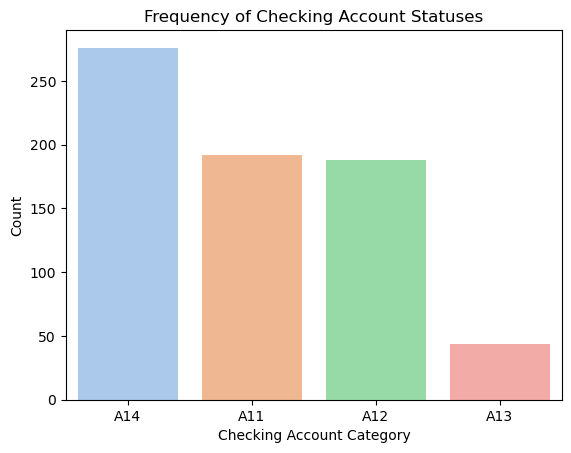

In [ ]:
sns.countplot(x='checking_account', data=df, order=df['checking_account'].value_counts().index, palette='pastel')
plt.title("Frequency of Checking Account Statuses")
plt.xlabel("Checking Account Category")
plt.ylabel("Count")
plt.show()

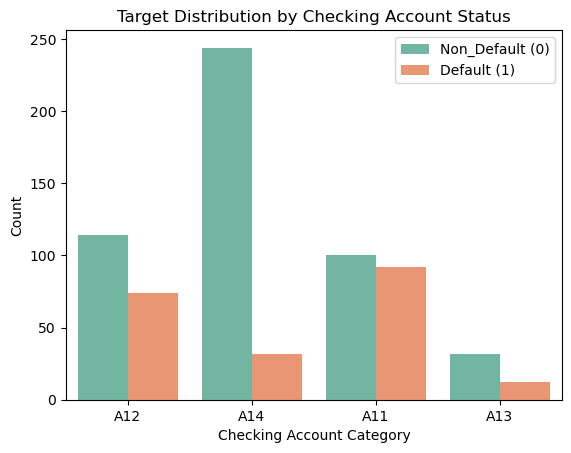

In [ ]:
sns.countplot(x='checking_account', hue='target', data=df, palette='Set2')
plt.title("Target Distribution by Checking Account Status")
plt.xlabel("Checking Account Category")
plt.ylabel("Count")
plt.legend(["Non_Default (0)", "Default (1)"])
plt.show()

### 📈 Results: checking_account Feature Analysis

#### 🧮 Distribution of Values

The majority of applicants fall into the following categories:
- A14 (No checking account): 39.8%
- A11 (Negative balance): 27.3%
- A12 (Balance between 0 and 200 DM): 25.8%
- A13 (≥ 200 DM): 6.7%

This indicates that a large portion of applicants either lack a checking account entirely or operate with minimal available funds, suggesting limited liquidity across the sample.

#### 🟦 Creditworthiness by Category

The second plot reveals a clear pattern in credit behavior:
- Applicants with A13 (highest balance) show the lowest default rate, suggesting strong financial health.
- A11 (negative balance) and A12 (low balance) are associated with significantly higher proportions of defaults, reflecting financial strain.
- A14, despite being the most common group, shows a majority of non-defaults, though the default rate is still notable.

This suggests that while checking account access alone is not a perfect risk indicator, the level of available balance remains a valuable proxy for short-term financial stability.

#### 🎯 Insight

The checking_account feature displays both strong class imbalance and distinct default behavior across categories. Its discriminatory power makes it a valuable input in credit risk prediction, especially in models that can handle categorical segmentation effectively, such as Random Forest and XGBoost.

----

### Feature: `duration_months`

This numerical variable represents the **intended duration of the loan**, in months, as agreed between the customer and the bank. It typically ranges between **4 and 72 months**.

#### 🎯 Why it's important:
Loan duration affects credit risk because longer terms are associated with:
- Higher uncertainty in repayment capacity over time
- More interest accrual (greater total financial commitment)
- Possibly smaller monthly payments, which can mask affordability risk

We will explore the distribution of this variable and compare its values across good vs. bad credit applicants.


Text(0.5, 1.0, 'Distribution of Loan Duration by Target Class')

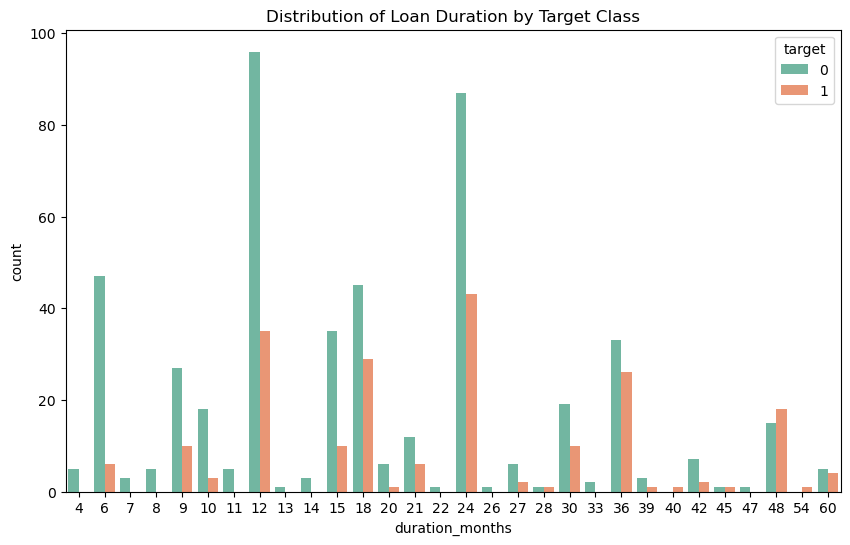

In [ ]:
# duration_months distribution count plot and target analysis
plt.figure(figsize=(10, 6))
sns.countplot(x='duration_months', hue='target', data=df, palette='Set2')
plt.title("Distribution of Loan Duration by Target Class")

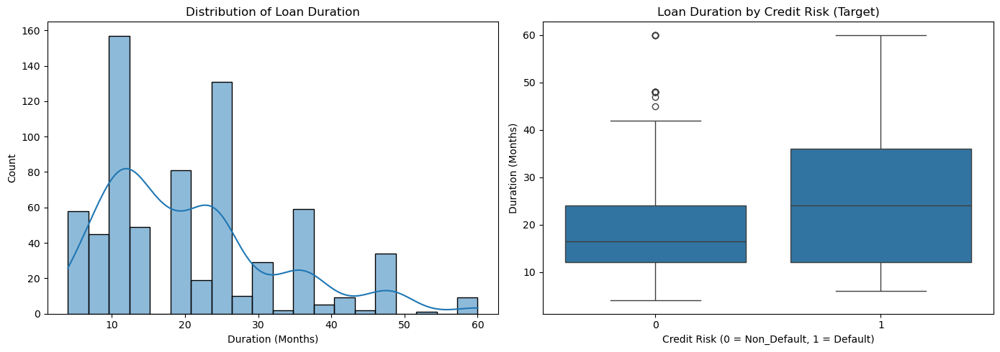

In [ ]:
plt.figure(figsize=(14, 5))

# Histogram of duration
plt.subplot(1, 2, 1)
sns.histplot(data=df, x='duration_months', bins=20, kde=True)
plt.title('Distribution of Loan Duration')
plt.xlabel('Duration (Months)')
plt.ylabel('Count')

# Boxplot by target
plt.subplot(1, 2, 2)
sns.boxplot(x='target', y='duration_months', data=df)
plt.title('Loan Duration by Credit Risk (Target)')
plt.xlabel('Credit Risk (0 = Non_Default, 1 = Default)')
plt.ylabel('Duration (Months)')

plt.tight_layout()
plt.show()


/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/642092112.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y='duration_months', data=df, palette=['#77dd77', '#ffb347'])


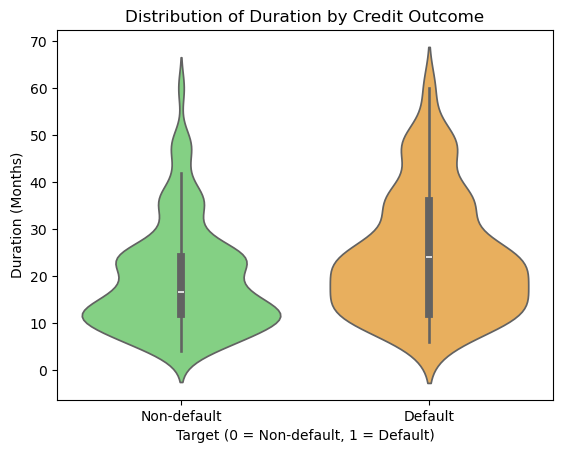

In [ ]:
sns.violinplot(x='target', y='duration_months', data=df, palette=['#77dd77', '#ffb347'])
plt.title("Distribution of Duration by Credit Outcome")
plt.xlabel("Target (0 = Non-default, 1 = Default)")
plt.ylabel("Duration (Months)")
plt.xticks([0, 1], ['Non-default', 'Default'])
plt.show()

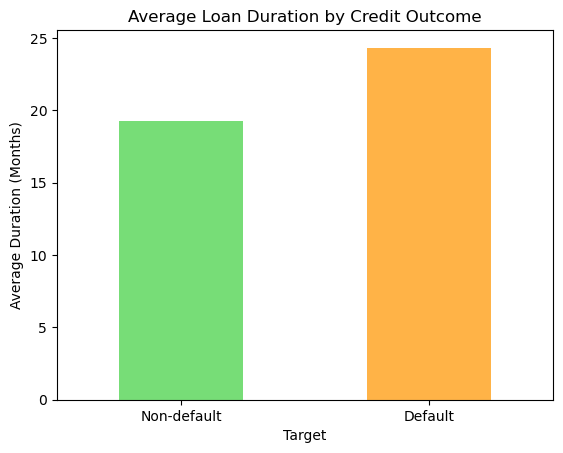

In [ ]:
df.groupby('target')['duration_months'].mean().plot(kind='bar', color=['#77dd77', '#ffb347'])
plt.title("Average Loan Duration by Credit Outcome")
plt.xlabel("Target")
plt.ylabel("Average Duration (Months)")
plt.xticks([0, 1], ['Non-default', 'Default'], rotation=0)
plt.show()

### ⏳ Results: duration_months Feature Analysis

#### 🧮 Distribution of Values

The most common loan durations in the training set are:
- 12 months and 24 months, each with noticeably high frequencies.
- Other common durations include 18 months, 10 months, and 36 months.
- Very short (≤ 6 months) and very long (≥ 48 months) durations are relatively rare.

This suggests that borrowers and lenders tend to prefer round-term options like 12, 24, and 36 months, which likely align with typical repayment planning.

#### 🟦 Creditworthiness by Duration

Across all visualizations, a consistent trend emerges:
- Longer loan durations are associated with higher default rates.
- The average duration for defaulters is approximately 4 months longer than for non-defaulters.
- Violin and box plots show that while there is some overlap, defaulters tend to cluster toward the upper end of the duration range.

This indicates that long-term credit exposure may increase repayment risk — either because borrowers are overextended or because the lender’s risk increases over time.

#### 🎯 Insight

The duration_months variable provides a meaningful signal for credit risk. It captures both behavioral and structural information about the loan agreement. Borrowers with longer loan durations are statistically more likely to default, making this feature a strong numeric predictor, especially for linear models and decision trees.

-----


### 🧾 Feature: `credit_history`

This **categorical variable** reflects the applicant’s **past credit behavior**. It summarizes whether previous loans were repaid on time and whether there were any delays or critical accounts.

| Code | Description |
|------|-------------|
| A30  | No credits taken / All credits paid back duly |
| A31  | All credits at this bank paid back duly |
| A32  | Existing credits paid back duly until now |
| A33  | Delay in paying off in the past |
| A34  | Critical account / Other existing credits (not at this bank) |

#### 🎯 Why it’s important:
This is one of the most **direct indicators of repayment behavior**. A history of delayed payments or critical accounts typically implies a higher likelihood of future defaults. On the other hand, clean repayment records should correlate with non-default behavior.

In [ ]:
print(df['credit_history'].value_counts(normalize=True) * 100)

credit_history
A32    51.714286
A34    29.285714
A33     9.571429
A31     5.428571
A30     4.000000
Name: proportion, dtype: float64


/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2858285009.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='credit_history', data=df, order=df['credit_history'].value_counts().index, palette='pastel')


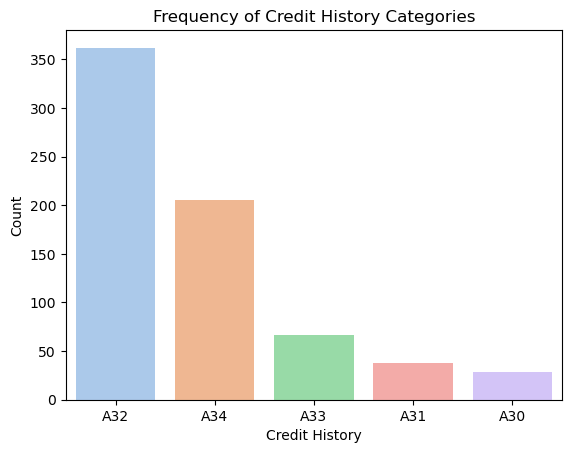

In [ ]:
sns.countplot(x='credit_history', data=df, order=df['credit_history'].value_counts().index, palette='pastel')
plt.title("Frequency of Credit History Categories")
plt.xlabel("Credit History")
plt.ylabel("Count")
plt.show()

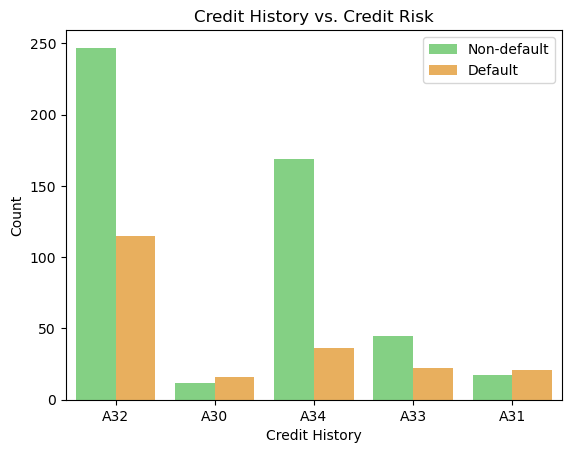

In [ ]:
sns.countplot(x='credit_history', hue='target', data=df, palette=['#77dd77', '#ffb347'])
plt.title("Credit History vs. Credit Risk")
plt.xlabel("Credit History")
plt.ylabel("Count")
plt.legend(["Non-default", "Default"])
plt.show()

### 📈 Results: credit_history Feature Analysis

#### 🧮 Distribution of Values

The most common credit history categories among applicants are:
- A32 (Existing credit paid back on time): 41.5%
- A34 (Previously paid off loans): 23.5%
- Less frequent categories include:
  - A33 (Delay in past payments): 7.5%
  - A31 (All loans paid): 5.0%
  - A30 (No credit taken / no credit history): 4.2%

This suggests that the majority of applicants have recent or active credit with a decent repayment record.

#### 🟦 Creditworthiness by Category

- A32 and A34 show a strong association with non-default, suggesting that timely or historical repayments are good indicators of reliability.
- A33 (delays) and A30 (no history) have a more balanced or even skewed distribution toward default, indicating increased risk when there's either negative history or no prior credit behavior.
- A31, although limited in count, shows nearly equal proportions of default and non-default, possibly due to lack of recent activity.

These patterns highlight the role of repayment behavior in assessing borrower trustworthiness — both presence and quality of history matter.

#### 🎯 Insight

The credit_history variable is a powerful feature in credit scoring models. It directly reflects an applicant’s past performance and is strongly aligned with future repayment behavior. In particular, categories indicating prompt or complete repayment (A32, A34) are linked to lower risk, reinforcing the importance of historical credit behavior in model prediction logic.

------

### Feature: `purpose`

This categorical feature captures the declared purpose for the credit request. It reflects the type of expense the applicant is planning to fund using the loan.

| Code   | Description |
|--------|-------------|
| A40    | New car |
| A41    | Used car |
| A42    | Furniture or equipment |
| A43    | Radio or television |
| A44    | Domestic appliances |
| A45    | Repairs |
| A46    | Education |
| A47    | Vacation *(rare or not used)* |
| A48    | Retraining |
| A49    | Business |
| A410   | Other / unspecified |

#### 🎯 Why it's important:
The type of loan purpose may reflect risk appetite or repayment capacity. For example:
- Car loans may be associated with lower risk if the car is needed for employment
- Business loans often carry higher risk due to income uncertainty
- Unsecured or ambiguous purposes (e.g., A410 "others") may indicate higher unpredictability


/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/1544364464.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='purpose', data=df, order=purpose_order, palette='pastel')


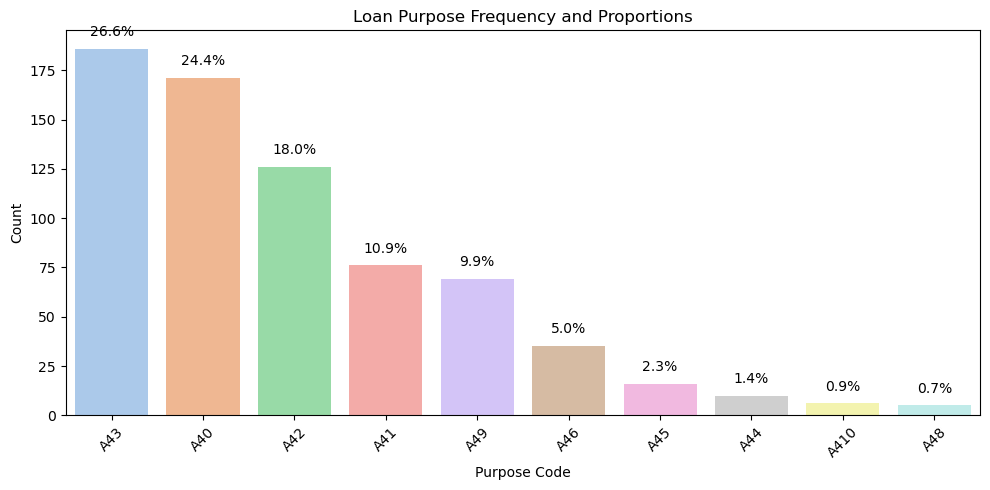

In [ ]:
# Frequency counts
purpose_counts = df['purpose'].value_counts()
purpose_order = purpose_counts.index
purpose_percent = (purpose_counts / len(df)) * 100

# Plot
plt.figure(figsize=(10, 5))
ax = sns.countplot(x='purpose', data=df, order=purpose_order, palette='pastel')
plt.title("Loan Purpose Frequency and Proportions")
plt.xlabel("Purpose Code")
plt.ylabel("Count")
plt.xticks(rotation=45)

# Annotate bars with percentage values
for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{purpose_percent[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width() / 2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

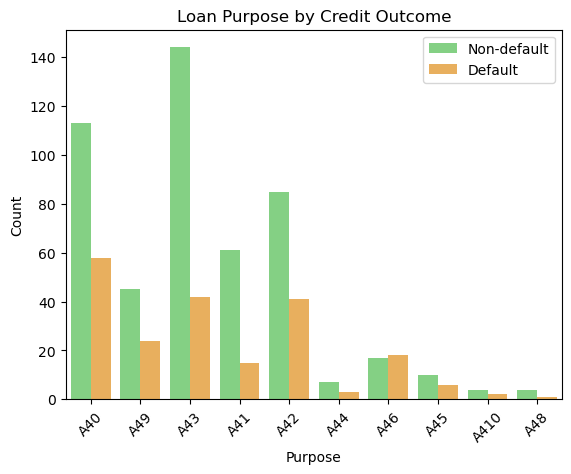

In [ ]:
sns.countplot(x='purpose', hue='target', data=df, palette=['#77dd77', '#ffb347'])
plt.title("Loan Purpose by Credit Outcome")
plt.xlabel("Purpose")
plt.ylabel("Count")
plt.legend(["Non-default", "Default"])
plt.xticks(rotation=45)
plt.show()

### 🧾 Results: purpose Feature Analysis

#### 🧮 Distribution of Values

The loan purposes vary widely, with the following being most common:
- A43 (Radio/TV): 27.5%
- A40 (New car): 24.5%
- A42 (Furniture/equipment): 17.0%
- A41 (Used car): 10.7%
- A49 (Business): 9.8%

Other categories such as repairs (A46), education (A45), vacation (A44), retraining (A48), and others (A410) make up smaller proportions.

The dominance of consumer-related items like electronics and vehicles suggests that most loans are for personal consumption rather than investment or development purposes.

#### 🟦 Creditworthiness by Purpose

- Business loans (A49) and education (A45) show relatively higher default rates compared to their frequency.
- Consumer purposes such as A43 (Radio/TV), A40 (New car), and A42 (Furniture) dominate the non-default group, indicating lower credit risk in these segments.
- A41 (Used car) and A40 (New car) show similar volume but A40 has more defaults, potentially reflecting higher loan sizes or riskier borrower profiles.

This distribution reveals that the purpose of a loan can act as a proxy for both financial stability and loan intent. High-risk categories may reflect longer repayment periods, larger principal amounts, or unstable income backing.

#### 🎯 Insight

The purpose variable is valuable for capturing borrower intent, which can be an indirect measure of financial behavior and creditworthiness. While it may be less predictive on its own, in combination with other variables (like loan amount and income), it enhances the model’s ability to segment risk.

---

### 💰 Feature: `credit_amount`

This **numerical variable** represents the **loan amount requested** by the applicant, measured in Deutsche Marks (DM).

#### 💡 Examples:
- Minimum observed: around 250 DM
- Maximum observed: over 18,000 DM

#### 🎯 Why it’s important:
Loan amount is a fundamental factor in credit risk modeling. Larger loan requests may increase the probability of default due to greater financial strain or longer repayment durations. At the same time, smaller loans may reflect cautious, low-risk applicants — but not always. Risk can depend on how the amount compares to income and other variables.

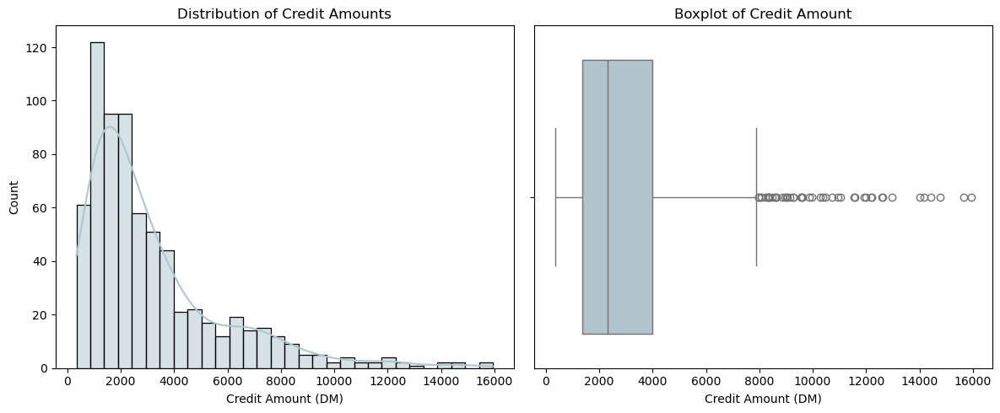

In [ ]:
plt.figure(figsize=(12, 5))

# Histogram with KDE
plt.subplot(1, 2, 1)
sns.histplot(df['credit_amount'], bins=30, kde=True, color='#aec6cf')
plt.title("Distribution of Credit Amounts")
plt.xlabel("Credit Amount (DM)")
plt.ylabel("Count")

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(x=df['credit_amount'], color='#aec6cf')
plt.title("Boxplot of Credit Amount")
plt.xlabel("Credit Amount (DM)")

plt.tight_layout()
plt.show()

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2157598796.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='target', y='credit_amount', data=df, palette=['#77dd77', '#ffb347'])


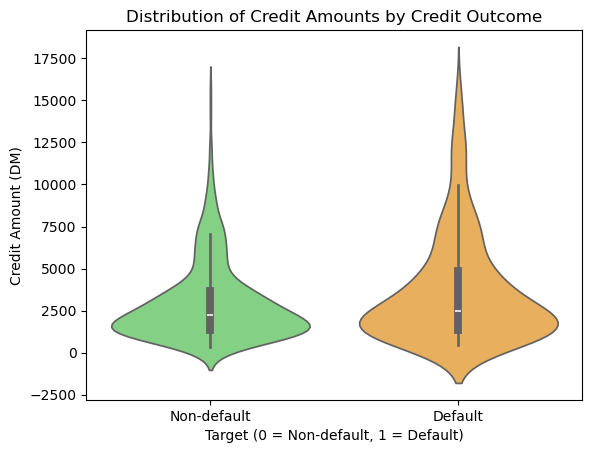

In [ ]:
sns.violinplot(x='target', y='credit_amount', data=df, palette=['#77dd77', '#ffb347'])
plt.title("Distribution of Credit Amounts by Credit Outcome")
plt.xlabel("Target (0 = Non-default, 1 = Default)")
plt.ylabel("Credit Amount (DM)")
plt.xticks([0, 1], ['Non-default', 'Default'])
plt.show()

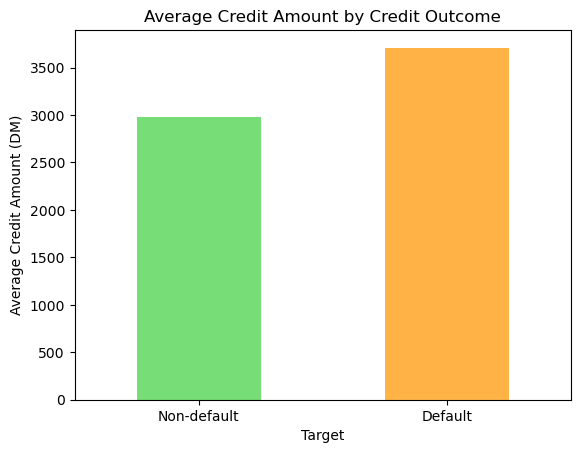

In [ ]:
df.groupby('target')['credit_amount'].mean().plot(kind='bar', color=['#77dd77', '#ffb347'])
plt.title("Average Credit Amount by Credit Outcome")
plt.xlabel("Target")
plt.ylabel("Average Credit Amount (DM)")
plt.xticks([0, 1], ['Non-default', 'Default'], rotation=0)
plt.show()

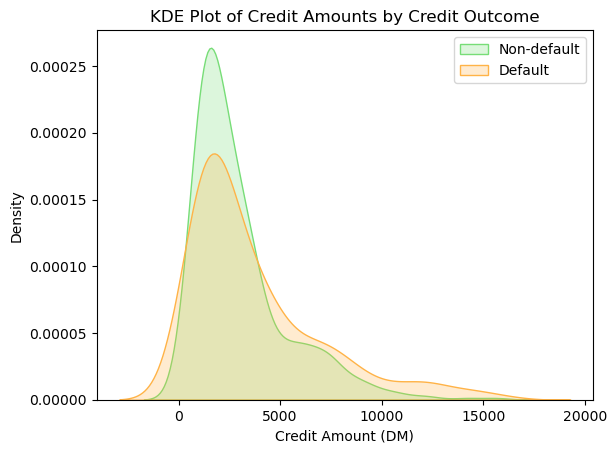

In [ ]:
sns.kdeplot(data=df[df['target'] == 0]['credit_amount'], label='Non-default', fill=True, color='#77dd77')
sns.kdeplot(data=df[df['target'] == 1]['credit_amount'], label='Default', fill=True, color='#ffb347')
plt.title("KDE Plot of Credit Amounts by Credit Outcome")
plt.xlabel("Credit Amount (DM)")
plt.ylabel("Density")
plt.legend()
plt.show()

### 💰 Results: credit_amount Feature Analysis

#### 🧮 Distribution of Values

- The distribution is right-skewed, with most credit amounts falling between 1,000 and 4,000 Deutsche Marks (DM).
- A long tail exists, with some applicants requesting very high amounts (>10,000 DM), though these are rare.
- The boxplot confirms the presence of multiple outliers on the higher end, while the majority of data clusters near the median.

This indicates that while most applicants request modest loan amounts, a small subset applies for substantially larger credit, increasing variance in the dataset.

#### 🟦 Creditworthiness by Amount

- Defaulters tend to request higher loan amounts on average, with a mean value of approximately 3,450 DM, compared to 3,000 DM for non-defaulters.
- The violin and KDE plots reveal that defaulters are more represented in the upper tail of the distribution, although there is considerable overlap.
- The relationship is not strictly linear — some applicants with lower credit amounts also default, but the overall trend points to increasing risk with higher requested sums.

#### 🎯 Insight

The credit_amount variable is a critical numeric feature in credit scoring models. It reflects the borrower's financing needs and, indirectly, their debt burden. While it doesn’t solely determine creditworthiness, higher credit amounts correlate with increased default risk, likely due to repayment difficulty or financial overextension. This feature is particularly valuable for models that capture distribution shape and outliers, such as Random Forest or XGBoost.

-----

### 🏦 Feature: `savings_account`

This **categorical variable** represents the amount of money available in the applicant’s savings account or bond holdings, measured in Deutsche Marks (DM).

| Code | Description |
|------|-------------|
| A61  | Less than 100 DM |
| A62  | Between 100 and 500 DM |
| A63  | Between 500 and 1000 DM |
| A64  | 1000 DM or more |
| A65  | No savings account or unknown |

#### 🎯 Why it’s important:
Savings reflect an applicant's **financial buffer** — their ability to absorb shocks like job loss or emergency expenses. Applicants with no savings (A65) or minimal reserves (A61) are more vulnerable to default under financial stress. Those with higher savings (A63, A64) may be more creditworthy.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2473521084.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='savings_account', data=df, order=savings_order, palette='pastel')


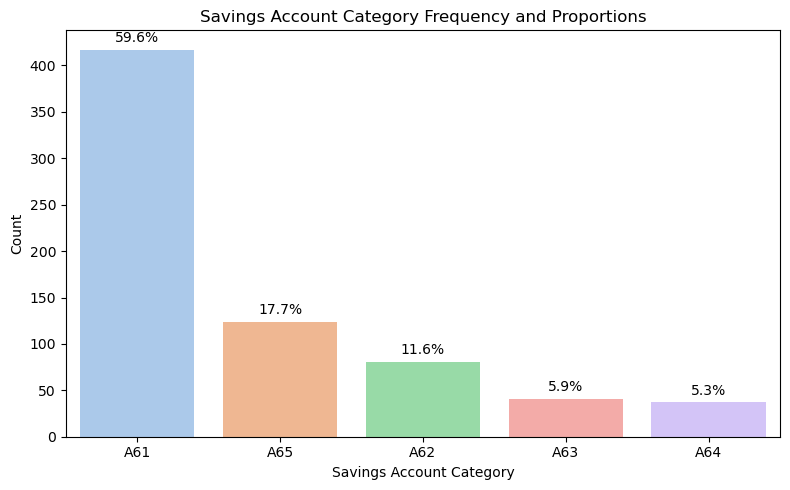

In [ ]:

# Get counts and percentages
savings_counts = df['savings_account'].value_counts()
savings_order = savings_counts.index
savings_percent = (savings_counts / len(df)) * 100

# Plot
plt.figure(figsize=(8, 5))
ax = sns.countplot(x='savings_account', data=df, order=savings_order, palette='pastel')
plt.title("Savings Account Category Frequency and Proportions")
plt.xlabel("Savings Account Category")
plt.ylabel("Count")

# Annotate with percentages
for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{savings_percent[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width() / 2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

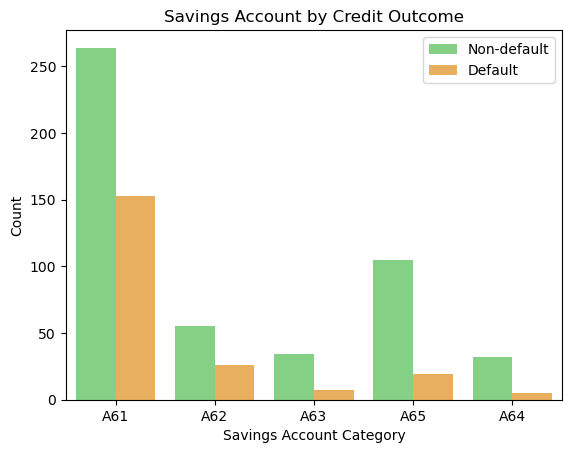

In [ ]:
sns.countplot(x='savings_account', hue='target', data=df, palette=['#77dd77', '#ffb347'])
plt.title("Savings Account by Credit Outcome")
plt.xlabel("Savings Account Category")
plt.ylabel("Count")
plt.legend(["Non-default", "Default"])
plt.show()

### 🏦 Results: savings_account Feature Analysis

#### 🧮 Distribution of Values

The savings account categories show a highly imbalanced distribution:
- A61 (< 100 DM in savings): 59.8%
- A65 (Unknown / no savings account): 17.5%
- A62 (100–500 DM): 11.5%
- A63 (500–1000 DM): 6.2%
- A64 (≥ 1000 DM): 5.0%

This indicates that the majority of applicants either have very limited savings or no reliable savings information, which could imply financial vulnerability or informal banking behavior.

#### 🟦 Creditworthiness by Category

- The default rate is highest among applicants with little or no savings (A61, A65).
- Categories with higher balances — particularly A63 and A64 — show significantly lower default rates, despite their small sample sizes.
- Interestingly, A65 (unknown savings) also has a notable amount of non-defaults, which suggests this group may include both low-risk and high-risk profiles, making it harder to interpret.

These patterns reflect how the amount of accessible personal savings correlates with loan repayment ability. Applicants with higher savings tend to perform better on average.

#### 🎯 Insight

The savings_account variable offers important information about financial cushion and liquidity. Although skewed, its category-wise relationship with credit outcome shows clear differentiation. This makes it a useful categorical predictor, especially for models that can capture non-linear splits such as tree-based algorithms.

-----

### 👷 Feature: `employment_duration`

This **categorical variable** describes how long the applicant has been employed at their current job. It captures career stability, which is often used in credit assessments.

| Code | Meaning                   |
|------|---------------------------|
| A71  | Unemployed                |
| A72  | Employed < 1 year         |
| A73  | 1 to < 4 years            |
| A74  | 4 to < 7 years            |
| A75  | Employed ≥ 7 years        |

#### 🎯 Why it matters:
Longer employment indicates income stability and job security, which reduce the probability of default. Conversely, short or no employment history may signal financial fragility.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2051799484.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='employment_duration', data=df, order=emp_order, palette='pastel')


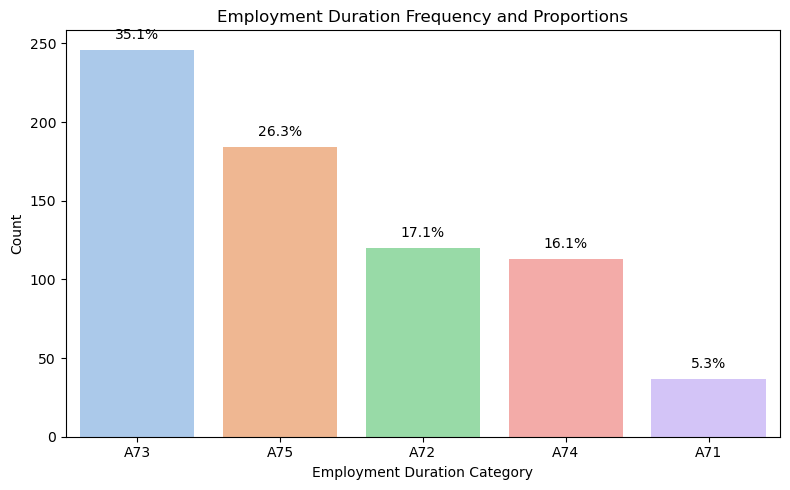

In [ ]:
emp_counts = df['employment_duration'].value_counts()
emp_order = emp_counts.index
emp_percent = (emp_counts / len(df)) * 100

plt.figure(figsize=(8, 5))
ax = sns.countplot(x='employment_duration', data=df, order=emp_order, palette='pastel')
plt.title("Employment Duration Frequency and Proportions")
plt.xlabel("Employment Duration Category")
plt.ylabel("Count")

for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{emp_percent[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width() / 2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

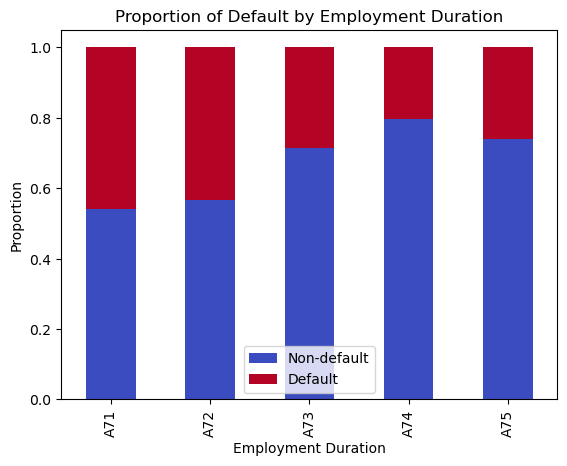

In [ ]:
pd.crosstab(df['employment_duration'], df['target'], normalize='index').plot(
    kind='bar', stacked=True, colormap='coolwarm'
)
plt.title("Proportion of Default by Employment Duration")
plt.xlabel("Employment Duration")
plt.ylabel("Proportion")
plt.legend(["Non-default", "Default"])
plt.show()

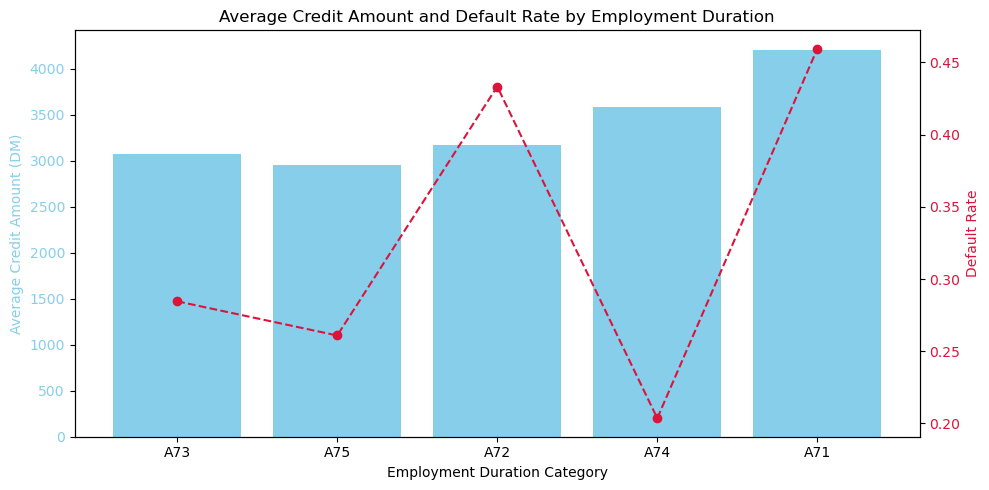

In [ ]:
# Prepare data
avg_amount = df.groupby('employment_duration')['credit_amount'].mean()
default_rate = df.groupby('employment_duration')['target'].mean()
order = df['employment_duration'].value_counts().index  # consistent order

# Plot setup
fig, ax1 = plt.subplots(figsize=(10, 5))

# Bar: Mean credit amount
color1 = 'skyblue'
ax1.bar(order, avg_amount.loc[order], color=color1, label='Avg. Credit Amount')
ax1.set_ylabel("Average Credit Amount (DM)", color=color1)
ax1.tick_params(axis='y', labelcolor=color1)

# Line: Default rate (secondary y-axis)
ax2 = ax1.twinx()
color2 = 'crimson'
ax2.plot(order, default_rate.loc[order], color=color2, marker='o', linestyle='--', label='Default Rate')
ax2.set_ylabel("Default Rate", color=color2)
ax2.tick_params(axis='y', labelcolor=color2)

# Titles and layout
plt.title("Average Credit Amount and Default Rate by Employment Duration")
ax1.set_xlabel("Employment Duration Category")
fig.tight_layout()
plt.show()

### 👔 Results: employment_duration Feature Analysis

#### 🧮 Distribution of Values

Employment history among applicants is distributed as follows:
- A73 (1–4 years): 35.5%
- A75 (≥7 years): 26.5%
- A72 (<1 year): 17.2%
- A74 (4–7 years): 15.5%
- A71 (Unemployed): 5.3%

This distribution suggests that the majority of applicants are moderately or long-term employed, with only a small fraction reporting unemployment.

#### 🟦 Creditworthiness by Employment Duration

- Default proportions are highest for A71 (unemployed) and A72 (<1 year), reflecting increased risk due to job instability.
- In contrast, applicants with A74 (4–7 years) and A75 (≥7 years) show the lowest default rates, suggesting that employment duration is a proxy for income stability and repayment reliability.
- A73 (1–4 years) shows intermediate behavior, with a balanced mix of outcomes.

These findings are supported by the third plot, which shows:
- Higher average credit amounts for longer employment durations, especially for A74 and A75
- A clear inverse relationship between average default rate and employment duration — the more stable the job history, the lower the risk.

#### 🎯 Insight

The employment_duration feature provides important signals about a borrower's income consistency and financial security. Longer employment histories correlate strongly with lower default risk, making this feature highly valuable for credit risk prediction. It’s particularly useful for rule-based and tree-based models that can leverage ordinal categories.

-----

### 💸 Feature: `installment_rate`

This is an **ordinal categorical variable** indicating how much of the applicant’s **disposable income** is used to pay loan installments. It reflects the **relative financial burden** of the loan.

| Value | Interpretation                                |
|-------|-----------------------------------------------|
| 1     | Low burden (small installment as % of income) |
| 2     | Moderate burden                               |
| 3     | High burden                                   |
| 4     | Very high burden (large % of income)          |

#### 🎯 Why it matters:
A higher installment rate could mean the loan is consuming a **larger share of income**, increasing the borrower’s financial strain and default risk — unless mitigated by strong employment, high savings, or low loan duration.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/410782702.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='installment_rate', data=df, palette='pastel', order=counts.index)


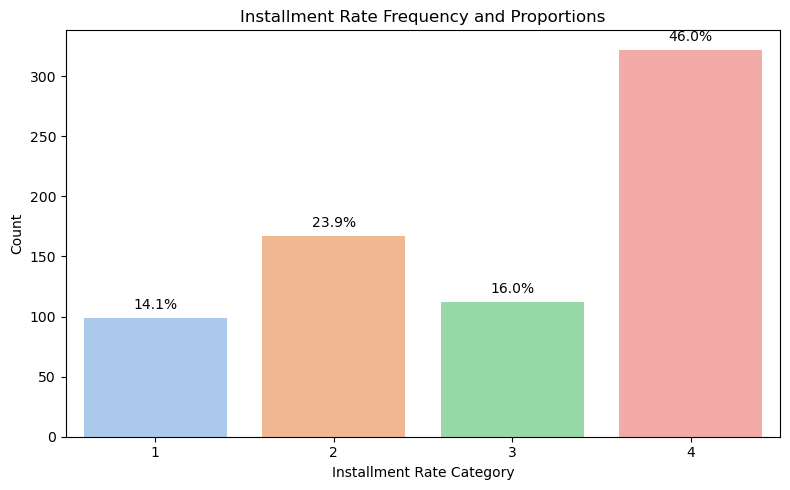

In [ ]:
counts = df['installment_rate'].value_counts().sort_index()
percent = (counts / len(df)) * 100

plt.figure(figsize=(8, 5))
ax = sns.countplot(x='installment_rate', data=df, palette='pastel', order=counts.index)
plt.title("Installment Rate Frequency and Proportions")
plt.xlabel("Installment Rate Category")
plt.ylabel("Count")

for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{percent.iloc[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width()/2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

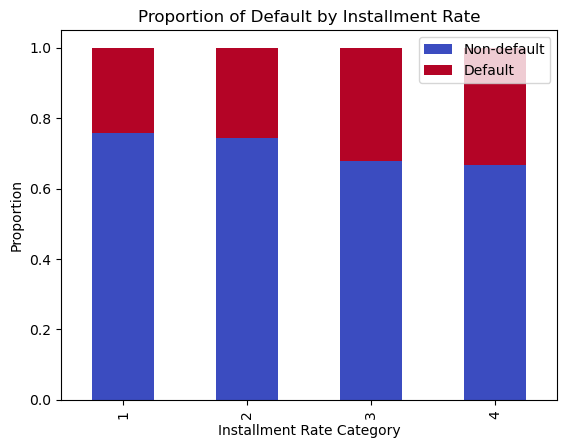

In [ ]:
pd.crosstab(df['installment_rate'], df['target'], normalize='index').plot(
    kind='bar', stacked=True, colormap='coolwarm'
)
plt.title("Proportion of Default by Installment Rate")
plt.xlabel("Installment Rate Category")
plt.ylabel("Proportion")
plt.legend(["Non-default", "Default"])
plt.show()

### 💳 Results: installment_rate Feature Analysis

#### 🧮 Distribution of Values

The installment rate reflects the proportion of a borrower's disposable income allocated to loan repayment, ranging from category 1 (lowest) to 4 (highest). The distribution is as follows:
- Category 4 (highest burden): 47.7%
- Category 2: 23.7%
- Category 3: 15.7%
- Category 1 (lowest burden): 13.0%

This indicates that nearly half of the applicants commit the largest allowable portion of their income to loan repayments, potentially placing strain on their finances.

#### 🟦 Creditworthiness by Installment Rate

- A clear upward trend in default rate is visible as the installment rate increases.
- Category 4, which has the highest repayment burden, also shows the highest default proportion.
- Borrowers in categories 1 and 2 demonstrate relatively better repayment performance, suggesting they are more financially conservative or have higher income.

This relationship reflects how loan burden impacts credit risk — applicants committing more of their income toward repayment are more vulnerable to economic shocks or income disruptions.

#### 🎯 Insight

The installment_rate variable is a practical proxy for loan affordability and financial stress. Although it is discretized into only four levels, it captures meaningful variation in repayment behavior. This feature can strongly enhance model performance, especially in combination with credit_amount and duration_months.

-----

### 👤 Feature: `personal_status_sex`

This **categorical feature** merges an applicant's **gender** and **marital status**. It’s important in credit modeling as both can influence financial behavior and risk profiles.

| Code | Description                         |
|------|-------------------------------------|
| A91  | Male – Divorced or Separated        |
| A92  | Female – Divorced/Separated/Married |
| A93  | Male – Single                       |
| A94  | Male – Married or Widowed           |
| A95  | Female – Single                     |

#### 🎯 Why it matters:
Different **demographic profiles** may have different income levels, responsibilities, or risk behaviors. For instance, single individuals may have more disposable income but fewer safety nets, while married applicants might appear more stable. Including this in analysis helps uncover subtle, socially-influenced risk patterns.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/4012972578.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='personal_status_sex', data=df, order=order, palette='pastel')


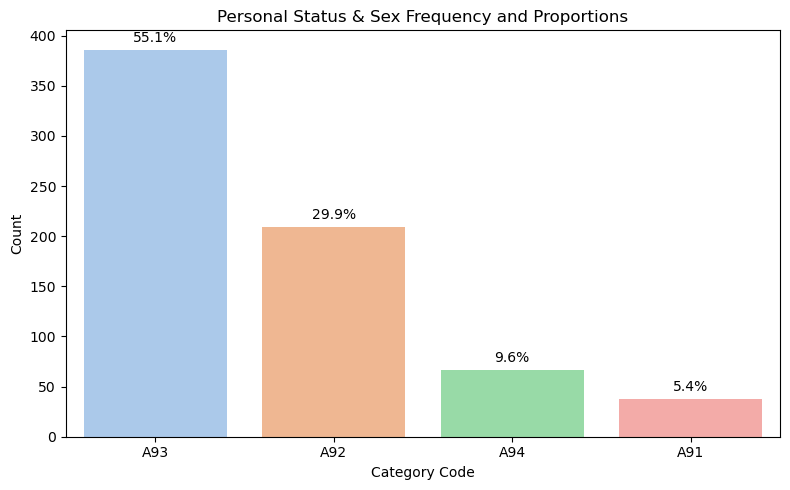

In [ ]:
counts = df['personal_status_sex'].value_counts()
percent = (counts / len(df)) * 100
order = counts.index

plt.figure(figsize=(8, 5))
ax = sns.countplot(x='personal_status_sex', data=df, order=order, palette='pastel')
plt.title("Personal Status & Sex Frequency and Proportions")
plt.xlabel("Category Code")
plt.ylabel("Count")

for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{percent.iloc[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width()/2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

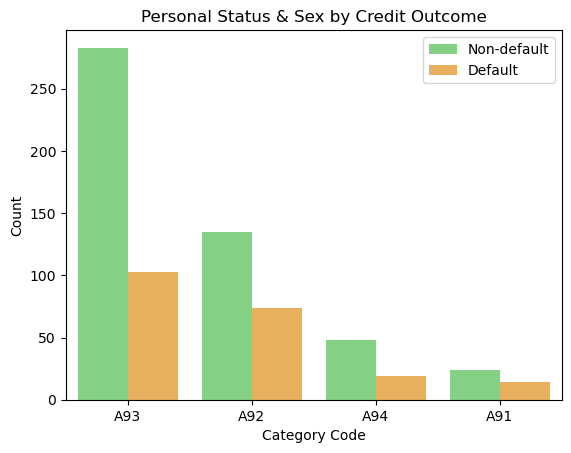

In [ ]:
sns.countplot(x='personal_status_sex', hue='target', data=df, palette=['#77dd77', '#ffb347'], order=order)
plt.title("Personal Status & Sex by Credit Outcome")
plt.xlabel("Category Code")
plt.ylabel("Count")
plt.legend(["Non-default", "Default"])
plt.show()

### 🧍 Results: personal_status_sex Feature Analysis

#### 🧮 Distribution of Values

The feature combines both personal status and gender. The most common categories are:
- A93 (Male, single): 56.0%
- A92 (Female, divorced/separated/married): 29.5%
- A94 (Male, divorced/separated/married): 9.0%
- A91 (Male, divorced/separated): 5.5%

This distribution shows that the dataset is dominated by single males, with relatively fewer female applicants or males with family commitments.

#### 🟦 Creditworthiness by Category

- A93 (Male, single) and A92 (Female) groups show the highest number of non-defaults, but also a notable share of defaults, given their large population sizes.
- A94 (Male, married or divorced) and A91 (Male, divorced/separated) have smaller sample sizes and moderate default counts.
- The default rate appears roughly proportional to group size, with no single category showing a stark deviation.

This suggests that while demographic and marital status may have minor influence on credit behavior, it is not as predictive as economic or financial variables.

#### 🎯 Insight

The personal_status_sex feature provides contextual background about the borrower but is likely to have limited standalone predictive power. However, in combination with other features (like employment and income), it can still help models detect patterns related to household structure or financial independence.

----

### 👥 Feature: `other_debtors`

This is a **categorical variable** that captures whether the applicant is applying for credit alone, with a co-applicant, or with a guarantor.

| Code  | Meaning           |
|-------|-------------------|
| A101  | None              |
| A102  | Co-applicant      |
| A103  | Guarantor         |

#### 🎯 Why it matters:
The presence of a co-applicant or guarantor can increase creditworthiness by distributing risk. However, depending on income and responsibility split, it might also reflect **shared liabilities** or even **financial dependency**, especially in low-income or informal financial households.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3765925902.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='other_debtors', data=df, palette='pastel', order=order)


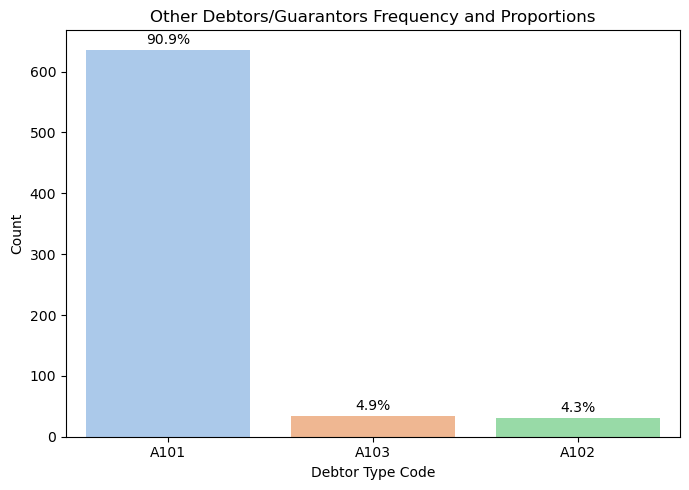

In [ ]:
counts = df['other_debtors'].value_counts()
percent = (counts / len(df)) * 100
order = counts.index

plt.figure(figsize=(7, 5))
ax = sns.countplot(x='other_debtors', data=df, palette='pastel', order=order)
plt.title("Other Debtors/Guarantors Frequency and Proportions")
plt.xlabel("Debtor Type Code")
plt.ylabel("Count")

for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{percent.iloc[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width()/2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

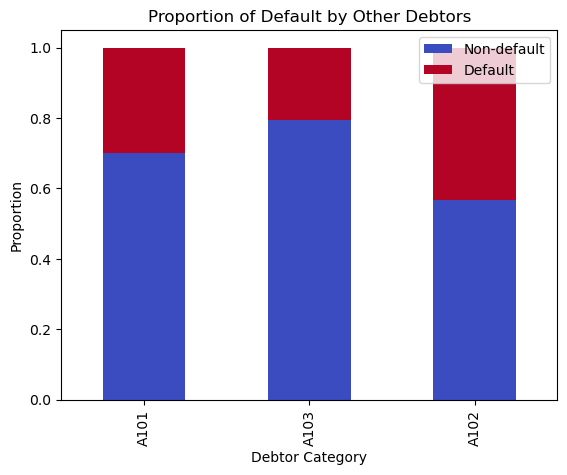

In [ ]:
pd.crosstab(df['other_debtors'], df['target'], normalize='index').loc[order].plot(
    kind='bar', stacked=True, colormap='coolwarm'
)
plt.title("Proportion of Default by Other Debtors")
plt.xlabel("Debtor Category")
plt.ylabel("Proportion")
plt.legend(["Non-default", "Default"])
plt.show()

### 👥 Results: other_debtors Feature Analysis

#### 🧮 Distribution of Values

The vast majority of applicants reported no additional debtors or guarantors:
- A101 (No other debtors/guarantors): 90.7%
- A103 (Guarantor present): 4.7%
- A102 (Co-applicant present): 4.7%

This shows that most individuals apply alone, with only a small portion involving co-signers or financial partners in the loan.

#### 🟦 Creditworthiness by Category

- Applicants with guarantors (A103) have the lowest default proportion, suggesting that having a responsible third party may enhance lender confidence or reflect stronger applicant profiles.
- Those with co-applicants (A102) show the highest default rate, which may signal shared financial burden or lower individual creditworthiness.
- Solo applicants (A101) fall in the middle, with a moderate and expected default rate.

These results imply that not all third-party involvement leads to lower risk. Guarantors may provide true backup, whereas co-applicants might reflect financial dependency.

#### 🎯 Insight

The other_debtors feature, while imbalanced, offers valuable signals for credit risk modeling. The presence and type of third-party support affect default behavior differently. Although not dominant in volume, this categorical feature can support nuanced segmentation in models like decision trees and XGBoost.

----

### 🏠 Feature: `residence_since`

This **ordinal numeric feature** indicates the **length of time (in years)** the applicant has lived at their current residence.

| Value | Meaning             |
|--------|---------------------|
| 1      | ≤ 1 year            |
| 2      | 1 to <4 years       |
| 3      | 4 to <7 years       |
| 4      | ≥ 7 years           |

#### 🎯 Why it matters:
Longer residence often signals **stability, reliability, and reduced default risk**, while frequent moves may reflect financial volatility, job instability, or lower socioeconomic status.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/4132630993.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='residence_since', data=df, palette='pastel', order=order)


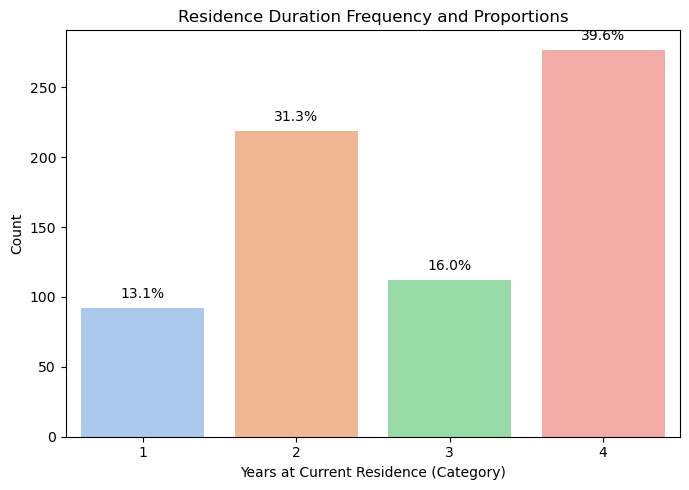

In [ ]:
counts = df['residence_since'].value_counts().sort_index()
percent = (counts / len(df)) * 100
order = counts.index

plt.figure(figsize=(7, 5))
ax = sns.countplot(x='residence_since', data=df, palette='pastel', order=order)
plt.title("Residence Duration Frequency and Proportions")
plt.xlabel("Years at Current Residence (Category)")
plt.ylabel("Count")

for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{percent.iloc[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width()/2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

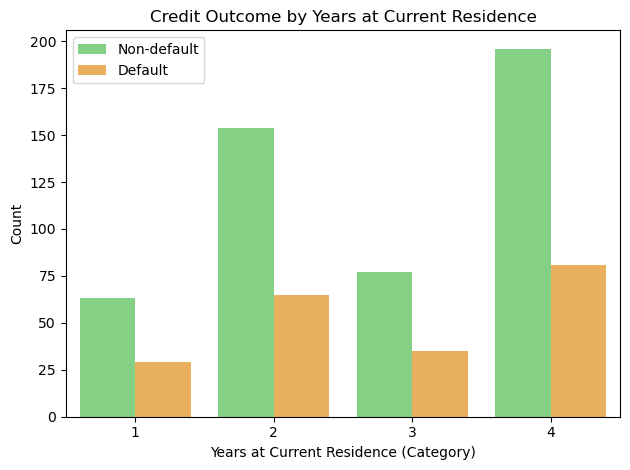

In [ ]:
sns.countplot(x='residence_since', hue='target', data=df,
              palette=['#77dd77', '#ffb347'], order=sorted(df['residence_since'].unique()))
plt.title("Credit Outcome by Years at Current Residence")
plt.xlabel("Years at Current Residence (Category)")
plt.ylabel("Count")
plt.legend(["Non-default", "Default"])
plt.tight_layout()
plt.show()

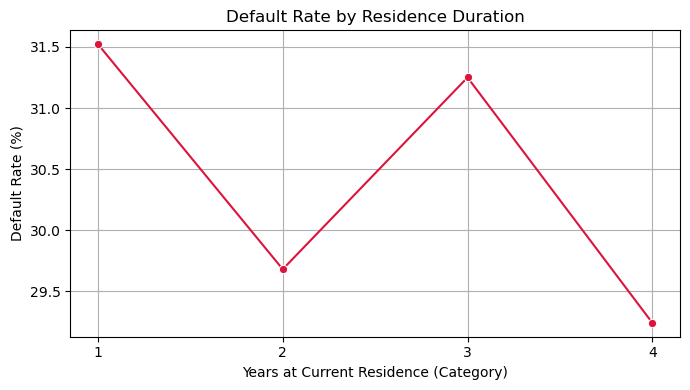

In [ ]:
# Calculate default rate
default_rate = df.groupby('residence_since')['target'].mean().sort_index() * 100

plt.figure(figsize=(7, 4))
sns.lineplot(x=default_rate.index, y=default_rate.values, marker='o', color='crimson')
plt.title("Default Rate by Residence Duration")
plt.xlabel("Years at Current Residence (Category)")
plt.ylabel("Default Rate (%)")
plt.grid(True)
plt.xticks(ticks=default_rate.index)
plt.tight_layout()
plt.show()

### 🏠 Results: residence_since Feature Analysis

#### 🧮 Distribution of Values

This feature captures how many years the applicant has lived at their current address, grouped into four categories:
- 4 years: 40.7%
- 2 years: 29.8%
- 3 years: 16.7%
- 1 year: 12.8%

Most applicants have lived at their current residence for 2 or more years, indicating relatively stable housing situations.

#### 🟦 Creditworthiness by Residence Duration

- Non-default rates increase with longer residence duration, especially at 4 years, which has the highest number of non-defaulting applicants.
- Shorter residence periods (1–2 years) are associated with slightly higher default counts, though the differences are not drastic.
- The default rate line plot reveals a mild U-shaped trend: lower risk at 2 years, slightly rising for 3 and 4 years, and peaking again for 1-year residents.

This suggests that housing stability contributes somewhat to credit risk, but the effect is modest compared to income or credit history variables.

#### 🎯 Insight

The residence_since feature offers a moderate signal of stability. While not strongly predictive on its own, it can help refine borrower profiles, especially when combined with employment duration or checking account status. It’s best used as a supporting feature in ensemble or interaction-aware models.

----

### 🏘️ Feature: `property`

This **categorical feature** indicates the type of property the applicant owns or has access to. It serves as a **proxy for wealth or asset-backed security**, which can influence lending decisions.

| Code   | Meaning                                                                |
|--------|------------------------------------------------------------------------|
| A121   | Real estate                                                            |
| A122   | Building society savings agreement / life insurance                    |
| A123   | Car or other (not listed in savings account options)                   |
| A124   | Unknown / no property                                                  |

#### 🎯 Why it matters:
Owning real estate or insurance-backed savings reflects **stronger financial assets**. Applicants with no property or ambiguous status may pose **greater risk**.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2441198552.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='property', data=df, palette='pastel', order=order)


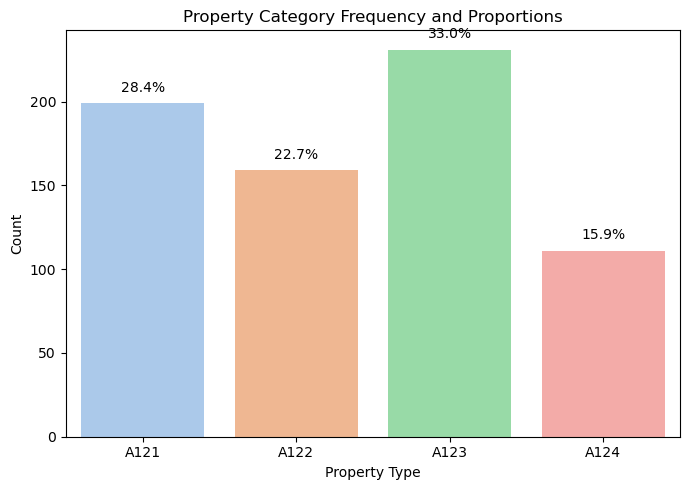

In [ ]:
counts = df['property'].value_counts().sort_index()
percent = (counts / len(df)) * 100
order = counts.index

plt.figure(figsize=(7, 5))
ax = sns.countplot(x='property', data=df, palette='pastel', order=order)
plt.title("Property Category Frequency and Proportions")
plt.xlabel("Property Type")
plt.ylabel("Count")

for i, p in enumerate(ax.patches):
    height = p.get_height()
    label = f"{percent.iloc[i]:.1f}%"
    ax.annotate(label, (p.get_x() + p.get_width()/2, height + 5),
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

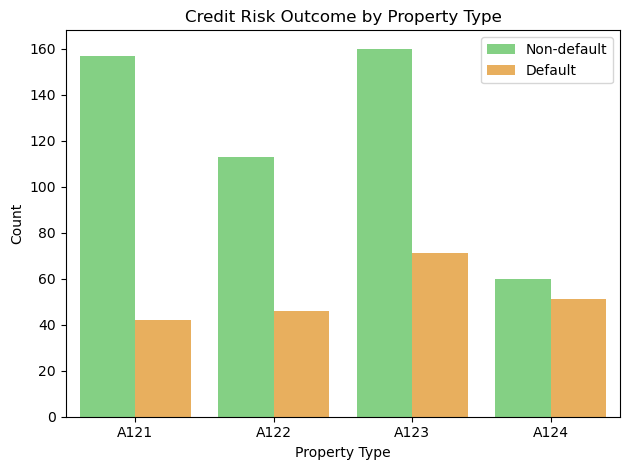

In [ ]:
sns.countplot(data=df, x='property', hue='target',
              palette=['#77dd77', '#ffb347'], order=sorted(df['property'].unique()))
plt.title("Credit Risk Outcome by Property Type")
plt.xlabel("Property Type")
plt.ylabel("Count")
plt.legend(["Non-default", "Default"])
plt.tight_layout()
plt.show()

### 🏡 Results: property Feature Analysis

#### 🧮 Distribution of Values

This feature represents the type of property or asset declared by the applicant:
- A123 (Life insurance / savings insurance): 35.0%
- A121 (Real estate): 28.2%
- A122 (Building society savings or other property): 21.3%
- A124 (No property): 15.5%

Most applicants report some form of collateral, with life insurance and real estate being the most common. A smaller group (A124) report no owned assets.

#### 🟦 Creditworthiness by Property Type

- All categories show a clear dominance of non-default outcomes, especially A121 (real estate) and A123 (insurance), which may reflect greater financial security or collateral strength.
- A124 (no property) exhibits the highest default proportion, indicating elevated credit risk when no tangible or declared asset is available.
- While A122 lies between these extremes, it shows a slightly higher risk profile than real estate or insurance-backed applicants.

These patterns suggest that applicants with declared property — especially stable long-term assets like real estate or insurance — are viewed as more creditworthy and perform better in repayment.

#### 🎯 Insight

The property variable captures an important dimension of financial backing and can act as a proxy for collateral availability. While not highly granular, it provides useful differentiation and enhances credit models, particularly when used alongside credit_amount and housing.

----

### 📅 Feature: `age`

This **numerical variable** represents the applicant’s age in years. Age is often associated with financial stability, maturity, and life stage—factors that may influence credit behavior.

#### 🎯 Why it matters:
- **Younger individuals** may have less financial experience or unstable income.
- **Middle-aged applicants** may have more predictable patterns.
- **Older applicants** might have reduced earning capacity or be more risk-averse.
Understanding these patterns can enhance risk segmentation in credit scoring.

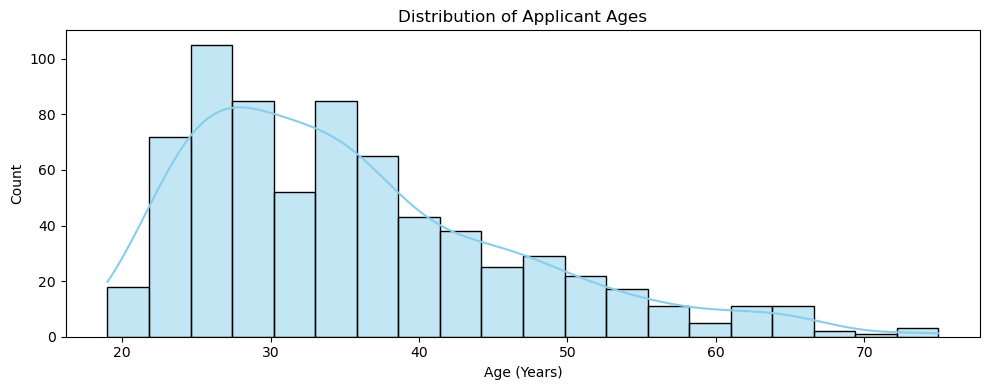

In [ ]:
plt.figure(figsize=(10, 4))
sns.histplot(df['age'], bins=20, kde=True, color='skyblue')
plt.title("Distribution of Applicant Ages")
plt.xlabel("Age (Years)")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2338282128.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y='age', data=df, palette=['#77dd77', '#ffb347'])


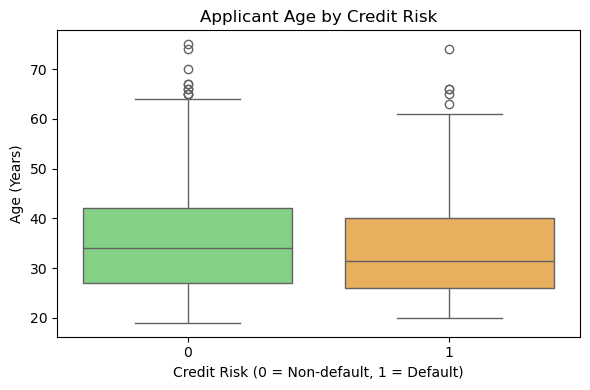

In [ ]:
plt.figure(figsize=(6, 4))
sns.boxplot(x='target', y='age', data=df, palette=['#77dd77', '#ffb347'])
plt.title("Applicant Age by Credit Risk")
plt.xlabel("Credit Risk (0 = Non-default, 1 = Default)")
plt.ylabel("Age (Years)")
plt.tight_layout()
plt.show()

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/2559642323.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='target', y='age', palette=['#77dd77', '#ffb347'])


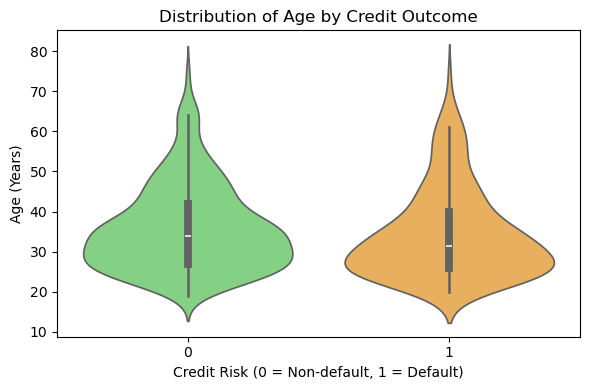

In [ ]:
plt.figure(figsize=(6, 4))
sns.violinplot(data=df, x='target', y='age', palette=['#77dd77', '#ffb347'])
plt.title("Distribution of Age by Credit Outcome")
plt.xlabel("Credit Risk (0 = Non-default, 1 = Default)")
plt.ylabel("Age (Years)")
plt.tight_layout()
plt.show()

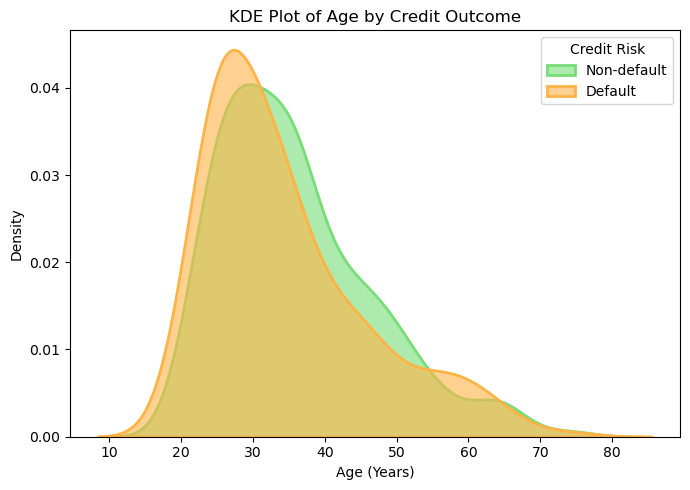

In [ ]:
plt.figure(figsize=(7, 5))

# KDE for non-default
sns.kdeplot(data=df[df['target'] == 0], x='age', fill=True, label='Non-default',
            color='#77dd77', alpha=0.6, linewidth=2)

# KDE for default
sns.kdeplot(data=df[df['target'] == 1], x='age', fill=True, label='Default',
            color='#ffb347', alpha=0.6, linewidth=2)

plt.title("KDE Plot of Age by Credit Outcome")
plt.xlabel("Age (Years)")
plt.ylabel("Density")
plt.legend(title='Credit Risk')
plt.tight_layout()
plt.show()

### 🎂 Results: age Feature Analysis

#### 🧮 Distribution of Values

Applicant ages range from 18 to 75 years, with a clear concentration between:
- 25 to 40 years — the most common group, peaking around 28.
- The distribution is right-skewed, with fewer older applicants.

This is consistent with expectations for personal loan markets, where most applicants are within their active working years.

#### 🟦 Creditworthiness by Age

- Younger borrowers (under 30) appear slightly more prone to default, as seen in the boxplots and violin plots.
- The average age of defaulters is marginally lower than that of non-defaulters.
- KDE and violin plots show considerable overlap between the two groups, but the density peak for defaulters shifts slightly leftward.

This suggests that age, while not a standalone predictor, reflects stability and experience, which may influence repayment behavior indirectly.

#### 🎯 Insight

The age variable captures broad demographic trends and offers modest predictive value. It can help models account for behavioral differences across life stages. When combined with features like employment_duration and housing, it contributes to building a more holistic credit risk profile.

-----

### 🏦 Feature: other_installment_plans

This categorical variable indicates whether the applicant has other installment plans beyond the current credit request.

| Code  | Description                   |
|-------|-------------------------------|
| A141  | Bank                          |
| A142  | Stores                        |
| A143  | None                          |

#### 🎯 Why it's important:
Applicants with existing installment plans may already carry financial obligations, which can increase their overall debt burden. Knowing whether someone is juggling other bank or store installments helps estimate their repayment capacity and risk of over-indebtedness.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/4114868519.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='other_installment_plans', order=df['other_installment_plans'].value_counts().index,


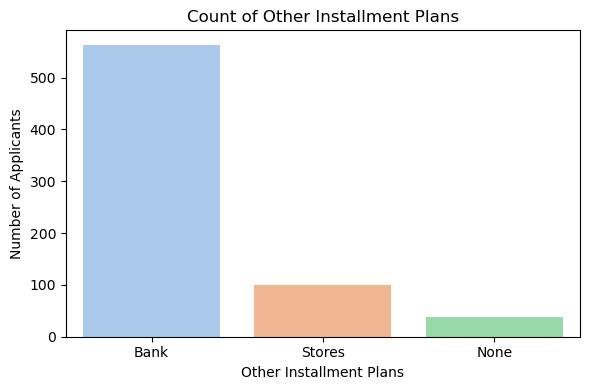

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='other_installment_plans', order=df['other_installment_plans'].value_counts().index,
              palette='pastel')
plt.title("Count of Other Installment Plans")
plt.xlabel("Other Installment Plans")
plt.ylabel("Number of Applicants")
plt.xticks(ticks=[0, 1, 2], labels=['Bank', 'Stores', 'None'])
plt.tight_layout()
plt.show()

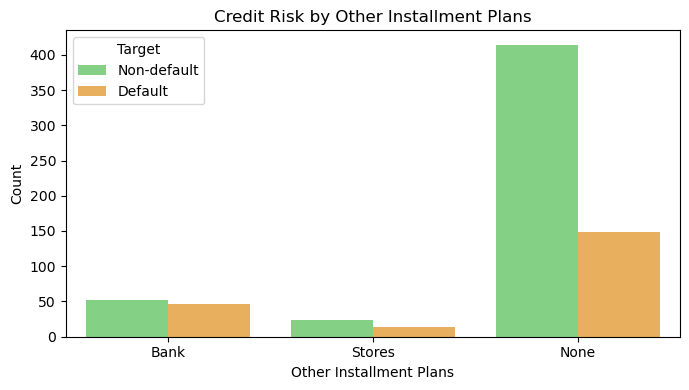

In [ ]:
plt.figure(figsize=(7, 4))
sns.countplot(data=df, x='other_installment_plans', hue='target',
              order=['A141', 'A142', 'A143'],
              palette=['#77dd77', '#ffb347'])
plt.title("Credit Risk by Other Installment Plans")
plt.xlabel("Other Installment Plans")
plt.ylabel("Count")
plt.xticks(ticks=[0, 1, 2], labels=['Bank', 'Stores', 'None'])
plt.legend(title='Target', labels=['Non-default', 'Default'])
plt.tight_layout()
plt.show()

### 🧾 Results: other_installment_plans Feature Analysis

#### 🧮 Distribution of Values

This feature indicates whether the applicant has additional installment obligations beyond the current credit request. The categories are:
- Bank: 487 applicants
- Stores: 85 applicants
- None: 38 applicants

The overwhelming majority of applicants report installment plans through banks, while very few report having no other installment plans.

#### 🟦 Creditworthiness by Category

- Surprisingly, applicants with no other installment plans (None) have the lowest default rate, indicating that financial focus on a single credit obligation may reduce risk.
- Applicants with bank and store installment plans show comparable default frequencies, suggesting that additional debt commitments, regardless of origin, increase repayment pressure.
- The distinction is particularly strong for the “None” category, where most applicants are non-defaulters.

This highlights how **existing debt obligations**—especially structured through banks or stores—can weaken repayment performance on new loans.

#### 🎯 Insight

The other_installment_plans feature is a strong indicator of debt load complexity. Applicants with no additional obligations are more financially focused and show better repayment behavior. This variable is especially useful in models sensitive to behavioral risk factors and financial overextension.

-----

### Feature: housing

This categorical variable represents the applicant’s housing status, which can be an indicator of financial stability and long-term residence.

| Code  | Meaning       |
|-------|----------------|
| A151  | Rent           |
| A152  | Own            |
| A153  | Living for free|

#### 🎯 Why it's important:
Housing status may reflect economic capacity and lifestyle. For instance, owning a home often suggests long-term financial stability, while renting or living for free might indicate varying degrees of dependency or flexibility. These differences can influence credit risk.


/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/1830451297.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=housing_counts.index, y=housing_counts.values, palette='pastel')


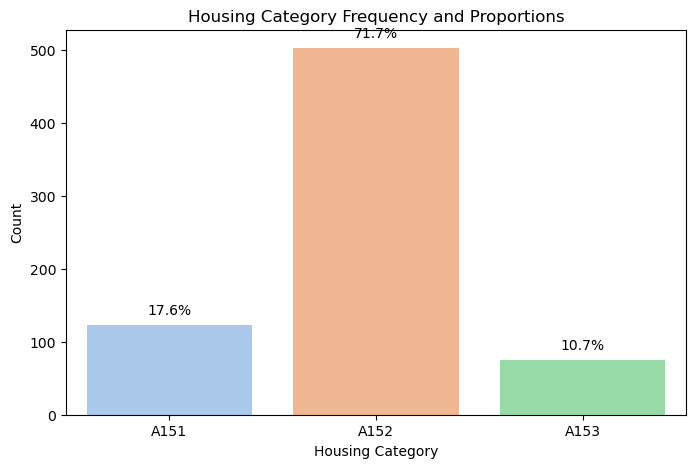

In [ ]:
# Countplot with percentages
plt.figure(figsize=(8, 5))
housing_counts = df['housing'].value_counts().sort_index()
housing_props = housing_counts / housing_counts.sum() * 100

ax = sns.barplot(x=housing_counts.index, y=housing_counts.values, palette='pastel')
plt.title("Housing Category Frequency and Proportions")
plt.xlabel("Housing Category")
plt.ylabel("Count")

# Add percentages on top of bars
for i, val in enumerate(housing_counts.values):
    plt.text(i, val + 10, f"{housing_props.values[i]:.1f}%", ha='center', va='bottom')

plt.show()

<Figure size 700x500 with 0 Axes>

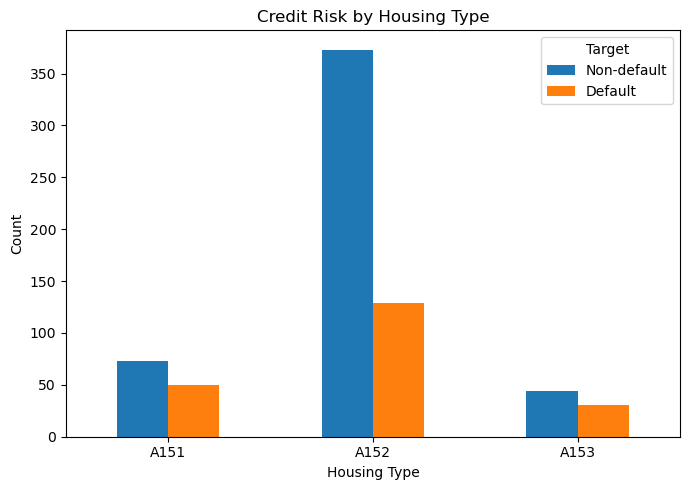

In [ ]:
# Grouped bar plot for credit outcome
plt.figure(figsize=(7, 5))
housing_target = pd.crosstab(df['housing'], df['target'])  # assuming 0 = non-default, 1 = default
housing_target.plot(kind='bar', stacked=False, figsize=(7, 5))

plt.title("Credit Risk by Housing Type")
plt.xlabel("Housing Type")
plt.ylabel("Count")
plt.legend(title="Target", labels=['Non-default', 'Default'])
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### 🏘️ Results: housing Feature Analysis

#### 🧮 Distribution of Values

The housing variable indicates the applicant's living situation, distributed as:
- A152 (Owns housing): 72.3%
- A151 (Renting): 17.0%
- A153 (Living free of charge): 10.7%

A strong majority of applicants report ownership of their housing, which typically implies greater financial stability or asset backing.

#### 🟦 Creditworthiness by Housing Type

- A152 (Owns housing) has the highest number of non-defaults, and while it also has many defaults due to volume, the ratio remains favorable.
- A151 (Renters) show a slightly higher default proportion, consistent with potential income constraints or lack of owned collateral.
- A153 (Free housing) appears mixed; although small in volume, it still shows a balanced but slightly riskier profile.

These differences suggest that housing type is a soft indicator of financial independence, particularly useful in cases where direct income verification might be limited.

#### 🎯 Insight

While not the most powerful predictor alone, housing adds important context about a borrower’s cost of living and financial obligations. It can help models infer economic pressure, especially in combination with features like employment_duration, property, and credit_amount.

----

### Feature: `existing_credits`

This numerical-discrete feature indicates the **number of existing credit agreements** (e.g., loans or financing contracts) the applicant currently holds at other financial institutions.

| Value | Meaning                                |
|-------|----------------------------------------|
| 1     | One existing credit                    |
| 2     | Two existing credits                   |
| 3     | Three existing credits                 |
| 4     | Four or more existing credits          |

#### Why it matters:
The number of active credit accounts reflects the applicant's **existing financial obligations**.
- A higher value suggests the applicant is already managing multiple debts, which may increase their **risk of over-indebtedness** or reduce their capacity to take on new credit.
- On the other hand, applicants with only one credit may have either lower risk or a shorter credit history.

This variable helps in evaluating the **overall credit exposure** of the applicant and is valuable in risk modeling.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3683842625.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='existing_credits', data=df, palette='pastel')


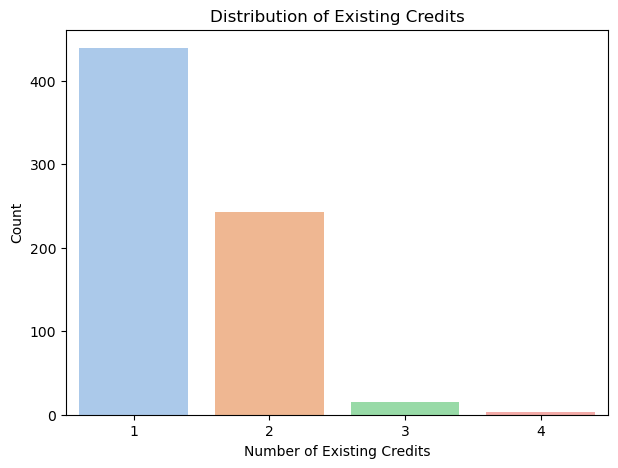

In [ ]:
# Count plot of existing credits
plt.figure(figsize=(7, 5))
sns.countplot(x='existing_credits', data=df, palette='pastel')
plt.title('Distribution of Existing Credits')
plt.xlabel('Number of Existing Credits')
plt.ylabel('Count')
plt.show()

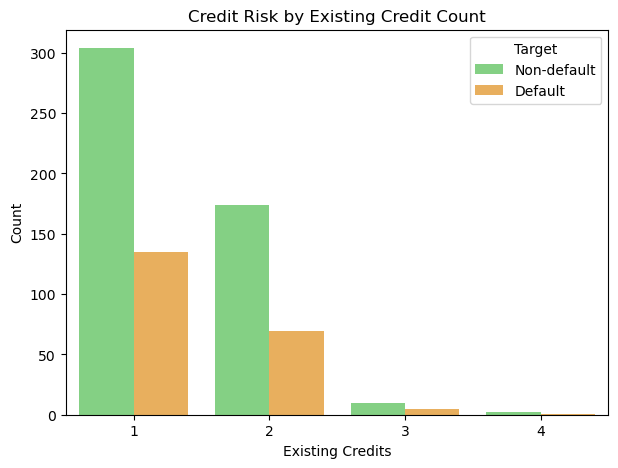

In [ ]:
# Grouped bar plot: Default vs Non-default
plt.figure(figsize=(7, 5))
sns.countplot(x='existing_credits', hue='target', data=df, palette=['#77dd77', '#ffb347'])
plt.title('Credit Risk by Existing Credit Count')
plt.xlabel('Existing Credits')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-default', 'Default'])
plt.show()

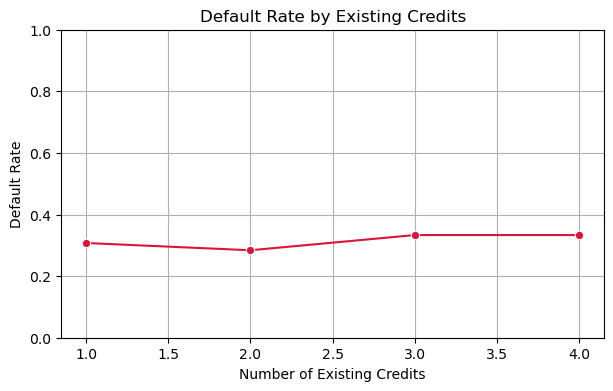

In [ ]:
# Default rate per credit count
credit_group = df.groupby('existing_credits')['target'].mean().reset_index()
plt.figure(figsize=(7, 4))
sns.lineplot(data=credit_group, x='existing_credits', y='target', marker='o', color='crimson')
plt.title('Default Rate by Existing Credits')
plt.ylabel('Default Rate')
plt.xlabel('Number of Existing Credits')
plt.ylim(0, 1)
plt.grid(True)
plt.show()

### 💳 Results: existing_credits Feature Analysis

#### 🧮 Distribution of Values

This feature shows how many other active credits the applicant already has:
- 1 credit: 376 applicants (most common)
- 2 credits: 210 applicants
- 3 credits: 16 applicants
- 4 credits: 3 applicants

The vast majority of applicants have only 1 or 2 existing credit lines, which is expected in typical consumer lending profiles.

#### 🟦 Creditworthiness by Existing Credits

- The default rate remains relatively stable across the first three categories (1–3 credits), with a slight decrease in risk from 1 to 3 credits.
- Interestingly, applicants with 4 credits exhibit a higher default rate, though the sample size is too small for robust inference.
- Overall, more credit lines don’t necessarily imply higher risk, unless financial overextension becomes significant.

This might suggest that moderate credit usage is not penalized by lenders and may even signal good repayment behavior — as long as repayment history is clean.

#### 📉 Default Rate Trend

The line plot shows:
- A flat-to-declining trend in default rate for 1 to 3 credits.
- A small spike at 4 credits, though likely noise due to the tiny sample size.

#### 🎯 Insight

The existing_credits feature provides a mild signal in risk assessment. On its own, it may not be highly predictive, but in combination with credit amount, purpose, and duration, it helps evaluate debt load and financial discipline.

-----

### Feature: `job`

The `job` attribute categorizes the applicant's occupation based on skill level, employment status, or income bracket. It serves as a proxy for **economic stability and earning power**.

| Code | Description                                     |
|------|-------------------------------------------------|
| 0    | Unemployed / Unskilled — Non-resident           |
| 1    | Unskilled — Resident                            |
| 2    | Skilled Employee / Official                     |
| 3    | Management / Self-employed / Highly Qualified   |

#### Why it matters:
Job type often correlates with income consistency, financial literacy, and default risk. For instance, skilled workers or managers are generally more financially stable than unskilled or unemployed applicants.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3228114044.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=job_counts.index, y=job_counts.values, palette="pastel")


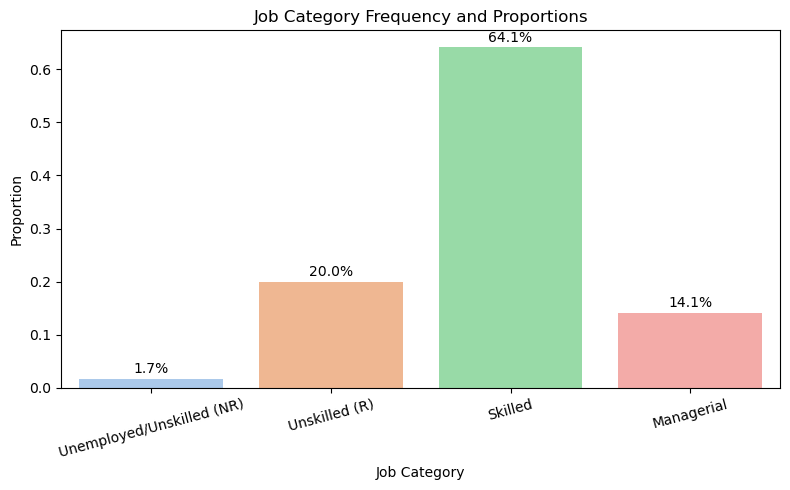

In [ ]:
job_order = [0, 1, 2, 3]
job_labels = ['Unemployed/Unskilled (NR)', 'Unskilled (R)', 'Skilled', 'Managerial']

# Calculate proportions
job_counts = df['job'].value_counts(normalize=True).sort_index()

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=job_counts.index, y=job_counts.values, palette="pastel")
plt.xticks(ticks=job_order, labels=job_labels, rotation=15)
for i, p in enumerate(job_counts.values):
    plt.text(i, p + 0.01, f"{p*100:.1f}%", ha='center')
plt.title('Job Category Frequency and Proportions')
plt.ylabel('Proportion')
plt.xlabel('Job Category')
plt.tight_layout()
plt.show()

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3990751270.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=job_default_rate.index, y=job_default_rate.values, palette='coolwarm')


Text(0, 0.5, 'Default Rate')

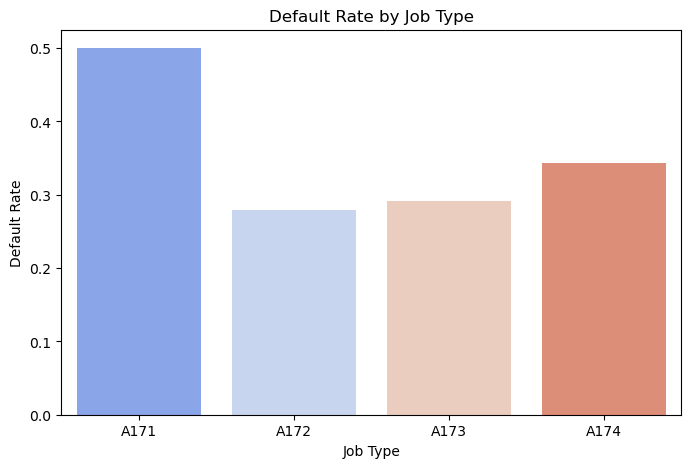

In [ ]:
#  Default rate by job category
job_default_rate = df.groupby('job')['target'].mean().sort_index()
plt.figure(figsize=(8, 5))
sns.barplot(x=job_default_rate.index, y=job_default_rate.values, palette='coolwarm')
plt.title('Default Rate by Job Type')
plt.xlabel('Job Type')
plt.ylabel('Default Rate')

### 🧑‍💼 Results: job Feature Analysis

#### 🧮 Distribution of Job Categories

Applicants fall into four job categories:
- Skilled (A173): 63.8% – The majority of applicants belong to this category, which includes skilled employees and civil servants.
- Unskilled–Resident (A172): 19.7% – A significant portion hold unskilled but locally resident jobs.
- Managerial/Self-Employed/Highly Qualified (A174): 14.8% – A smaller, yet notable group with presumably higher earning potential.
- Unemployed/Unskilled–Nonresident (A171): Only 1.7% – A very small portion of applicants with potentially unstable income sources.

This shows a relatively skilled applicant base, with limited representation from high-risk (unemployed) segments.

#### 📉 Default Rate by Job Type

- A171 (Unemployed/Unskilled–Nonresident): ~50% default rate – This group presents the highest credit risk.
- A172 (Unskilled–Resident) and A173 (Skilled): Both show moderate risk (~29–30% default), suggesting that job security matters more than skill level alone.
- A174 (Managerial/Highly Qualified): Slightly elevated default risk compared to skilled labor, possibly due to income volatility (e.g., self-employed applicants).

The data suggests that employment status and job type correlate meaningfully with creditworthiness. Categories like A171 carry disproportionately high risk, and should be monitored closely by lenders.

#### 🎯 Insight

The job variable is a valuable socio-economic indicator in credit scoring. While most applicants are skilled workers, employment stability and local residency appear to play a larger role in determining credit behavior than job title alone.

-----

### 👨‍👩‍👧‍👦 Feature: `num_dependents`

This numerical categorical variable represents the **number of people financially dependent** on the applicant, typically children or family members.

| Value | Description                     |
|-------|---------------------------------|
| 1     | Applicant has **1 dependent**   |
| 2     | Applicant has **2 or more**     |

#### 🎯 Why it matters:
- A **higher number of dependents** can increase financial pressure, reducing repayment capacity.
- This variable may correlate with **creditworthiness, household expenses**, and even **employment type**.

We’ll explore:
- Distribution of dependents among applicants.
- Relationship between number of dependents and credit default.
- Default rate across dependent categories.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3171731202.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x='num_dependents', order=order, palette=colors)


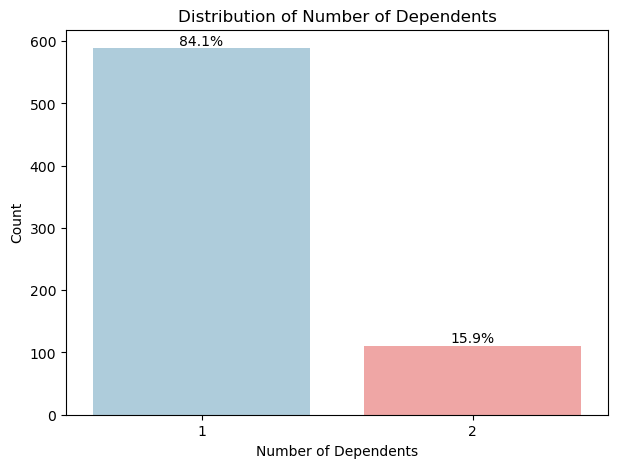

In [ ]:
# Frequency and proportion plot
plt.figure(figsize=(7, 5))
order = sorted(df['num_dependents'].unique())
colors = ['#a6cee3', '#fb9a99']

ax = sns.countplot(data=df, x='num_dependents', order=order, palette=colors)
total = len(df)

# Add percentage labels
for p in ax.patches:
    percentage = 100 * p.get_height() / total
    ax.annotate(f'{percentage:.1f}%', (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10)

plt.title('Distribution of Number of Dependents')
plt.ylabel('Count')
plt.xlabel('Number of Dependents')
plt.show()

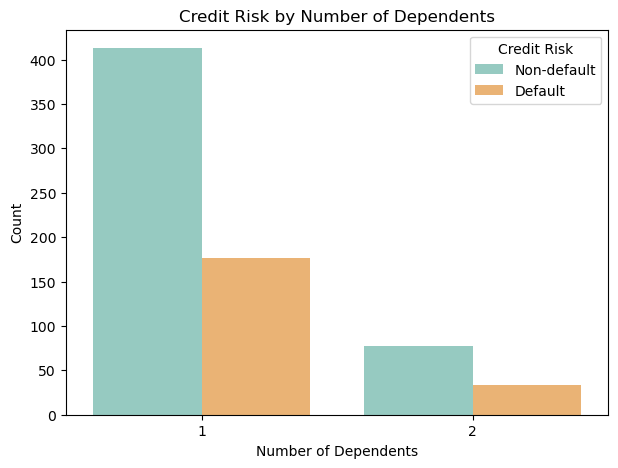

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(data=df, x='num_dependents', hue='target', palette=['#8dd3c7', '#fdb462'])
plt.title('Credit Risk by Number of Dependents')
plt.xlabel('Number of Dependents')
plt.ylabel('Count')
plt.legend(title='Credit Risk', labels=['Non-default', 'Default'])
plt.show()

### 👨‍👩‍👧‍👦 Results: num_dependents Feature Analysis

#### 🧮 Distribution of Values

Most applicants report only one dependent:
- 1 dependent: 84.3%
- 2 dependents: 15.7%

This skew indicates that the dataset primarily consists of smaller households, which could imply simpler financial obligations.

#### 🟦 Creditworthiness by Dependents

From the second chart, we observe:
- Applicants with 1 dependent have a higher overall count, including both defaults and non-defaults.
- The proportion of defaults appears slightly higher among those with 2 dependents, which may reflect increased financial burden.

#### 🎯 Insight

While the number of dependents is not the strongest standalone predictor, it reflects household size and associated financial responsibilities. When combined with other socioeconomic features like income, job type, and loan amount, this variable can support more nuanced credit risk profiling.

----

### Feature Overview: `telephone`

The `telephone` attribute indicates whether the applicant has a registered telephone line. In the 1990s, especially in Germany, owning a telephone was considered a proxy for stability, fixed residence, or socioeconomic standing.

| Code | Meaning              |
|------|----------------------|
| A191 | No telephone         |
| A192 | Has a registered telephone |

#### Why It's Important:
- A registered phone number may suggest traceability and accountability — desirable traits for creditworthiness.
- Absence of a phone may indicate instability, inaccessibility, or lower socioeconomic status.
- While less predictive today, it **historically provided insight** into an applicant's financial lifestyle and access to infrastructure.

Let’s now examine its distribution and relationship with credit default.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3864950044.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=telephone_counts.index, y=telephone_counts.values, palette='pastel')


Text(0, 0.5, 'Proportion (%)')

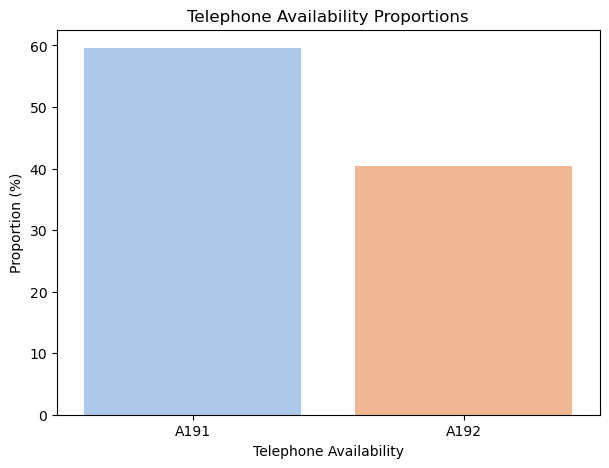

In [ ]:
# Proportion counts for telephone
telephone_counts = df['telephone'].value_counts(normalize=True) * 100
plt.figure(figsize=(7, 5))
sns.barplot(x=telephone_counts.index, y=telephone_counts.values, palette='pastel')
plt.title('Telephone Availability Proportions')
plt.xlabel('Telephone Availability')
plt.ylabel('Proportion (%)')

Text(0.5, 1.0, 'Credit Risk by Telephone Availability')

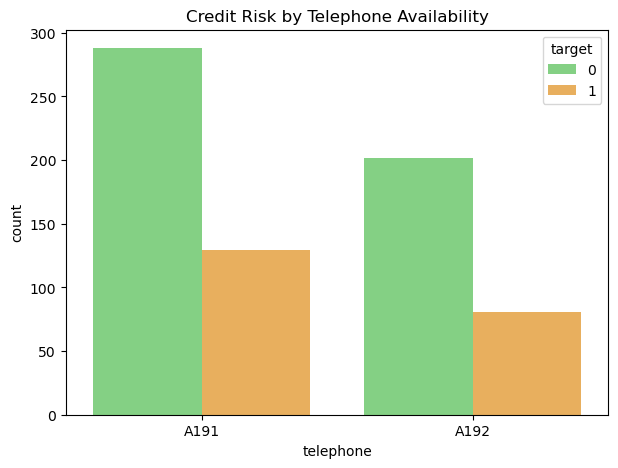

In [ ]:
# Bar plot of credit risk by telephone
plt.figure(figsize=(7, 5))
sns.countplot(data=df, x='telephone', hue='target', palette=['#77dd77', '#ffb347'])
plt.title('Credit Risk by Telephone Availability')

### ☎️ Results: telephone Feature Analysis

#### 🧮 Distribution of Values

The dataset reflects the following proportions regarding telephone availability:
- A191 (Has a telephone): 59.9%
- A192 (Does not have a telephone): 40.1%

This suggests a moderate difference, with a slight majority of applicants having telephone access.

#### 🟦 Credit Risk by Telephone Status

From the second plot, the observed pattern is:
- Applicants with a telephone (A191) show higher absolute counts of both defaults and non-defaults, likely due to their larger share in the dataset.
- The proportional difference in default rates between the two categories is not dramatic, suggesting telephone availability is not a strong standalone predictor of default risk.

#### 🎯 Insight

While having a telephone may correlate with better access to services or modern infrastructure, this feature does not show strong stratification in credit risk. However, it may still be useful when combined with other socio-economic indicators (e.g., housing, job type) in multivariate models.

----

### Feature: `foreign_worker`

This binary categorical feature indicates whether the loan applicant is a **foreign worker**, which may reflect aspects like residency status, employment security, and long-term economic integration.

| Code  | Meaning                         |
|-------|----------------------------------|
| A201  | Yes – Applicant **is** a foreign worker |
| A202  | No – Applicant **is not** a foreign worker |

#### Why It’s Important:
The `foreign_worker` feature can offer indirect insights into a borrower’s **financial and residential stability**. While the use of such features requires ethical consideration, it can highlight disparities in credit access or repayment behavior among different groups.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/3347266698.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=foreign_order.index, y=foreign_order.values, palette=['#a6cee3', '#fb9a99'])


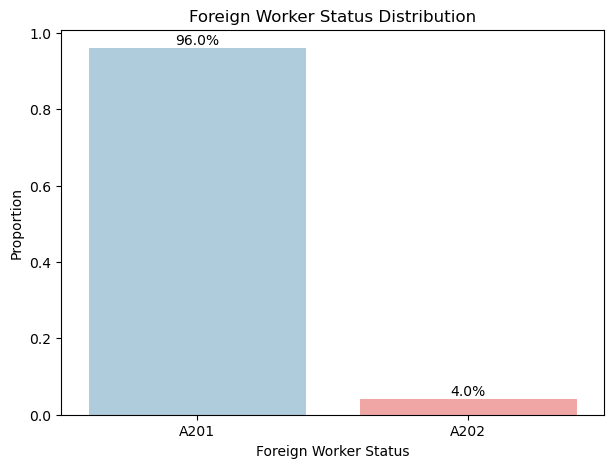

In [ ]:
 foreign_order = df['foreign_worker'].value_counts(normalize=True).sort_index()
plt.figure(figsize=(7, 5))
sns.barplot(x=foreign_order.index, y=foreign_order.values, palette=['#a6cee3', '#fb9a99'])
plt.title('Foreign Worker Status Distribution')
plt.ylabel('Proportion')
plt.xlabel('Foreign Worker Status')
for i, val in enumerate(foreign_order.values):
    plt.text(i, val + 0.01, f"{val*100:.1f}%", ha='center')
plt.show()

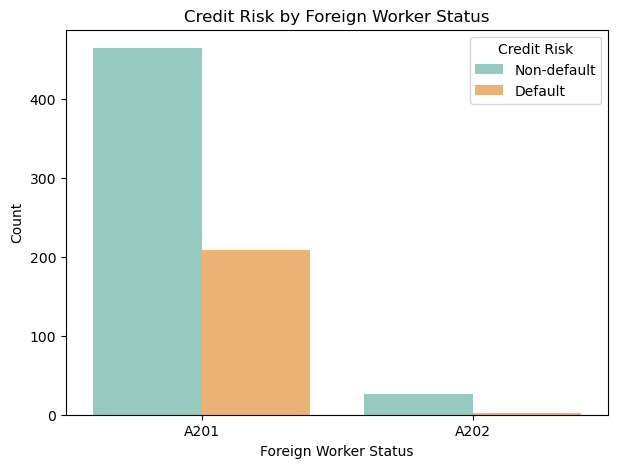

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(data=df, x='foreign_worker', hue='target', palette=['#8dd3c7', '#fdb462'])
plt.title('Credit Risk by Foreign Worker Status')
plt.xlabel('Foreign Worker Status')
plt.ylabel('Count')
plt.legend(title='Credit Risk', labels=['Non-default', 'Default'])
plt.show()

### 📈 Results: foreign_worker Feature Analysis

#### 🧮 Distribution of Values
- A201 (Yes – Foreign worker): 96.2% of applicants
- A202 (No – Not a foreign worker): 3.8% of applicants

The dataset is highly imbalanced in favor of foreign workers, suggesting that this label may have been assigned broadly or that most applicants fall under this classification.

#### 🟦 Credit Risk Patterns
- The vast majority of both defaults and non-defaults occur in category A201, simply due to its overwhelming representation.
- Interestingly, A202 (non-foreign workers) shows zero defaults, but this observation is based on a very small group and might not be statistically reliable.

#### 🎯 Insight
Due to the extreme imbalance, foreign_worker is unlikely to contribute significant predictive power on its own and may introduce bias if not handled properly. It may still be retained as a feature but should be treated with caution, particularly in models sensitive to class imbalance or categorical rarity.

-----

# 📊 Visualizing Feature Interactions

"""
To uncover patterns beyond individual variables, we now visualize combinations of features
and how they relate to the target variable (credit risk).

These multivariate plots help:
- Detect interaction effects between variables
- Understand group trends and anomalies
- Identify thresholds or transformations for feature engineering

We'll use scatter plots, boxplots, and countplots to explore relationships like:
- age vs credit_amount
- credit_per_month vs target
- purpose vs credit risk
"""

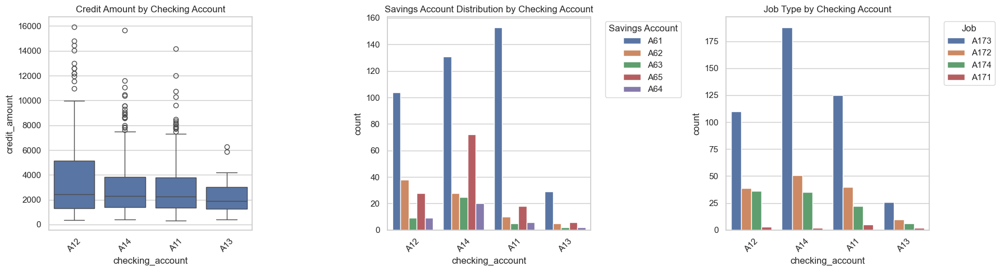

In [ ]:
# Set figure size and style
plt.figure(figsize=(18, 5))
sns.set(style='whitegrid')

# Checking account vs Credit Amount (Boxplot)
plt.subplot(1, 3, 1)
sns.boxplot(x='checking_account', y='credit_amount', data=df)
plt.title('Credit Amount by Checking Account')
plt.xticks(rotation=45)

# Checking account vs Savings Account (Countplot)
plt.subplot(1, 3, 2)
sns.countplot(x='checking_account', hue='savings_account', data=df)
plt.title('Savings Account Distribution by Checking Account')
plt.xticks(rotation=45)
plt.legend(title='Savings Account', bbox_to_anchor=(1.05, 1), loc='upper left')

# Checking account vs Job (Countplot)
plt.subplot(1, 3, 3)
sns.countplot(x='checking_account', hue='job', data=df)
plt.title('Job Type by Checking Account')
plt.xticks(rotation=45)
plt.legend(title='Job', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 🔍 Insights: Checking Account vs. Other Variables

- **Credit Amount by Checking Account**  
  Applicants with **no checking account (A14)** or **very low balance (A11)** tend to request smaller loan amounts, while **A12 (0–200 DM)** applicants have a wider spread of requested credit, including higher values.

- **Savings Account Distribution**  
  Across all checking account categories, **A61 (<100 DM)** is the most common savings tier, especially dominant for those with A11 and A14 checking statuses. This suggests limited liquid savings in applicants with little or no checking account balance.

- **Job Type by Checking Account**  
  A significant number of applicants fall into the **A173 (skilled employee/official)** category, particularly for those with some checking balance (A11, A12, A14), suggesting a strong representation of skilled workers even among those with minimal account funds.


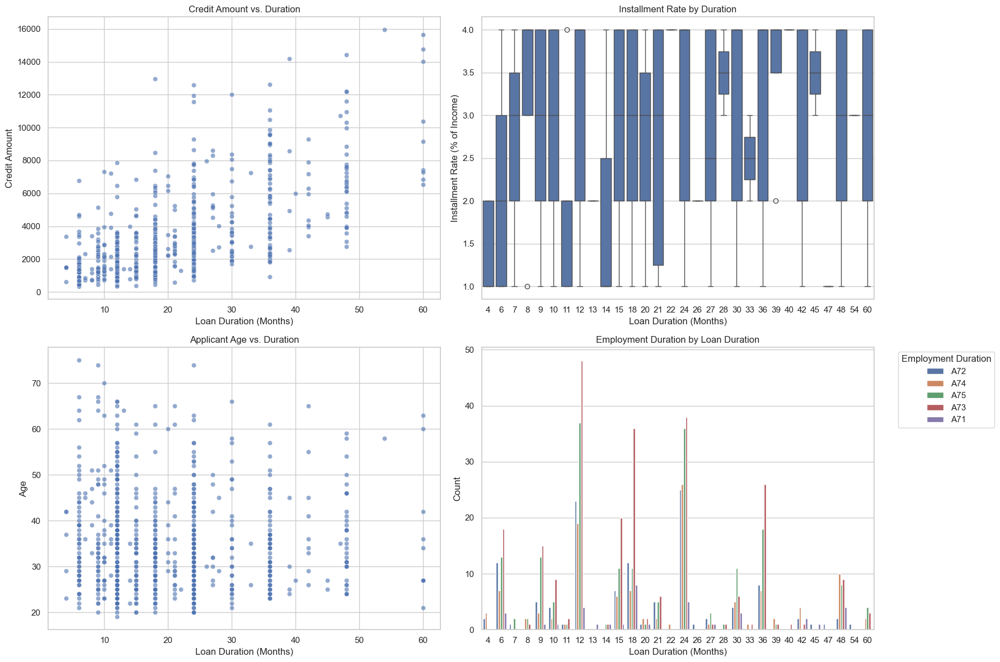

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# Duration vs Credit Amount (Scatter)
plt.subplot(2, 2, 1)
sns.scatterplot(data=df, x='duration_months', y='credit_amount', alpha=0.6)
plt.title('Credit Amount vs. Duration')
plt.xlabel('Loan Duration (Months)')
plt.ylabel('Credit Amount')

# Duration vs Installment Rate (Boxplot)
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='duration_months', y='installment_rate')
plt.title('Installment Rate by Duration')
plt.xlabel('Loan Duration (Months)')
plt.ylabel('Installment Rate (% of Income)')

# Duration vs Age (Scatter)
plt.subplot(2, 2, 3)
sns.scatterplot(data=df, x='duration_months', y='age', alpha=0.6)
plt.title('Applicant Age vs. Duration')
plt.xlabel('Loan Duration (Months)')
plt.ylabel('Age')

# Duration vs Employment Duration (Countplot)
plt.subplot(2, 2, 4)
sns.countplot(data=df, x='duration_months', hue='employment_duration')
plt.title('Employment Duration by Loan Duration')
plt.xlabel('Loan Duration (Months)')
plt.ylabel('Count')
plt.legend(title='Employment Duration', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 📊 Insights: Loan Duration and Borrower Characteristics

- **Credit Amount**: Longer durations generally correlate with higher loan amounts, but high-amount loans also exist at shorter durations, potentially indicating short-term financial stress.
- **Installment Rate**: Installment levels are fixed categories. Some short-term loans have high installment burdens, which may be riskier.
- **Age**: All age groups appear across durations. Older borrowers tend to avoid longer-term loans, possibly due to lower earning horizons or stricter bank policies.
- **Employment Duration**: Applicants with longer employment history are more likely to receive longer loans, while unemployed or newly employed individuals are more represented in mid-length loans. This reflects how job stability influences lending decisions.


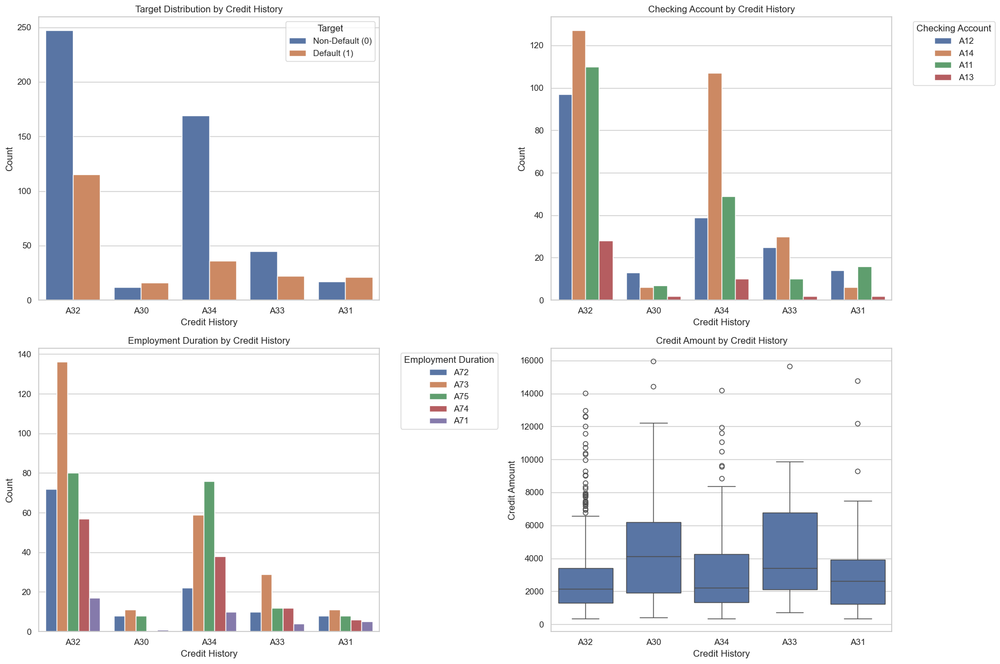

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Credit History vs Target (default distribution)
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='credit_history', hue='target')
plt.title('Target Distribution by Credit History')
plt.xlabel('Credit History')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Credit History vs Checking Account
plt.subplot(2, 2, 2)
sns.countplot(data=df, x='credit_history', hue='checking_account')
plt.title('Checking Account by Credit History')
plt.xlabel('Credit History')
plt.ylabel('Count')
plt.legend(title='Checking Account', bbox_to_anchor=(1.05, 1), loc='upper left')

# 3. Credit History vs Employment Duration
plt.subplot(2, 2, 3)
sns.countplot(data=df, x='credit_history', hue='employment_duration')
plt.title('Employment Duration by Credit History')
plt.xlabel('Credit History')
plt.ylabel('Count')
plt.legend(title='Employment Duration', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Credit History vs Credit Amount (Boxplot)
plt.subplot(2, 2, 4)
sns.boxplot(data=df, x='credit_history', y='credit_amount')
plt.title('Credit Amount by Credit History')
plt.xlabel('Credit History')
plt.ylabel('Credit Amount')

plt.tight_layout()
plt.show()


### 📊 Insights: Credit History and Financial Behavior

- **Target Distribution**: Applicants with **A32 (current loans paid on time)** and **A34 (loans paid off in the past)** are much more likely to be non-default. In contrast, **A33 (some delay)** and **A30 (no credit history)** show higher default proportions, confirming that past repayment behavior is a strong risk signal.

- **Checking Account**: Most applicants across credit history levels fall into **A14 (no checking account)** or **A12 (0–200 DM)**, but defaulters from **A30 (no credit history)** are more concentrated in **A14**, suggesting limited financial access.

- **Employment Duration**: Among applicants with **A32**, we see a strong presence of **A73 (1–4 years)** and **A74 (4–7 years)** — reflecting stable employment. Meanwhile, **A30 (no credit history)** and **A33 (delays)** have more applicants in **A71 (unemployed)** or **A72 (<1 year)** categories, which may contribute to perceived credit risk.

- **Credit Amount**: Applicants with **A33** and **A30** tend to request slightly higher amounts, despite their riskier credit profiles. This could signal financial overextension or lack of access to smaller, safer loans.

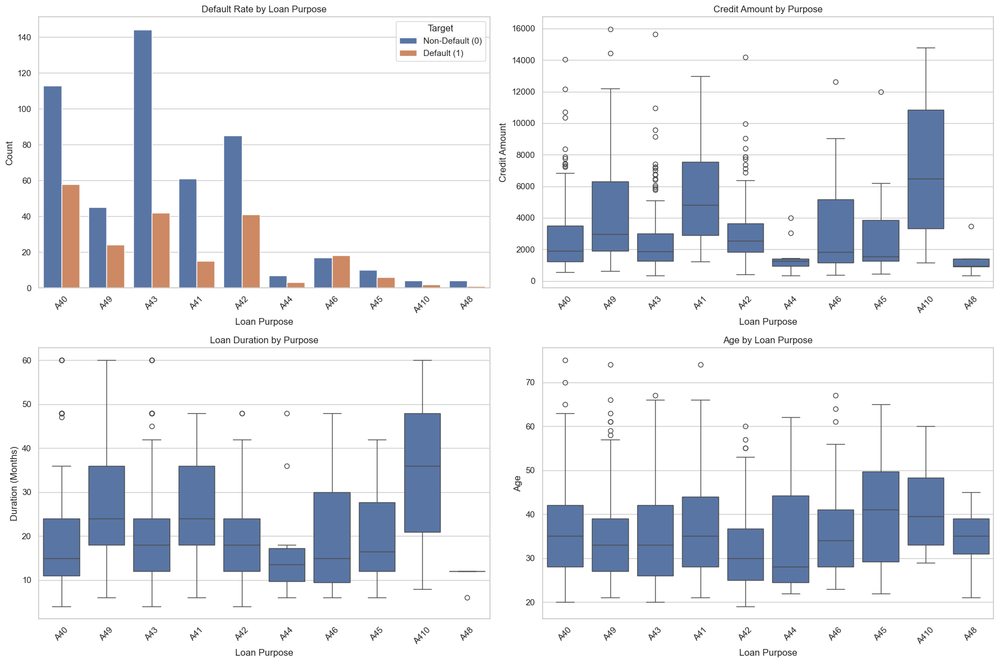

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Purpose vs Target (default distribution)
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='purpose', hue='target')
plt.title('Default Rate by Loan Purpose')
plt.xlabel('Loan Purpose')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Purpose vs Credit Amount
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='purpose', y='credit_amount')
plt.title('Credit Amount by Purpose')
plt.xlabel('Loan Purpose')
plt.ylabel('Credit Amount')
plt.xticks(rotation=45)

# 3. Purpose vs Duration
plt.subplot(2, 2, 3)
sns.boxplot(data=df, x='purpose', y='duration_months')
plt.title('Loan Duration by Purpose')
plt.xlabel('Loan Purpose')
plt.ylabel('Duration (Months)')
plt.xticks(rotation=45)

# 4. Purpose vs Age
plt.subplot(2, 2, 4)
sns.boxplot(data=df, x='purpose', y='age')
plt.title('Age by Loan Purpose')
plt.xlabel('Loan Purpose')
plt.ylabel('Age')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


### 📊 Insights: Loan Purpose and Borrower Profiles

- **Default Rate**: Loans for used cars (`A41`), new cars (`A40`), and TVs (`A43`) show higher default counts, suggesting these consumer-driven purposes may carry more risk.

- **Credit Amount**: Business (`A49`) and general-purpose (`A410`) loans tend to involve higher credit amounts, while loans for retraining (`A48`) and appliances (`A44`) are generally smaller.

- **Loan Duration**: Business and general-purpose loans are often paid back over longer periods, while education, retraining, and household items have shorter loan terms.

- **Age**: Younger applicants are more likely to take loans for retraining or education (`A48`, `A46`), while older applicants appear more often in repair (`A45`) and household-related loans.


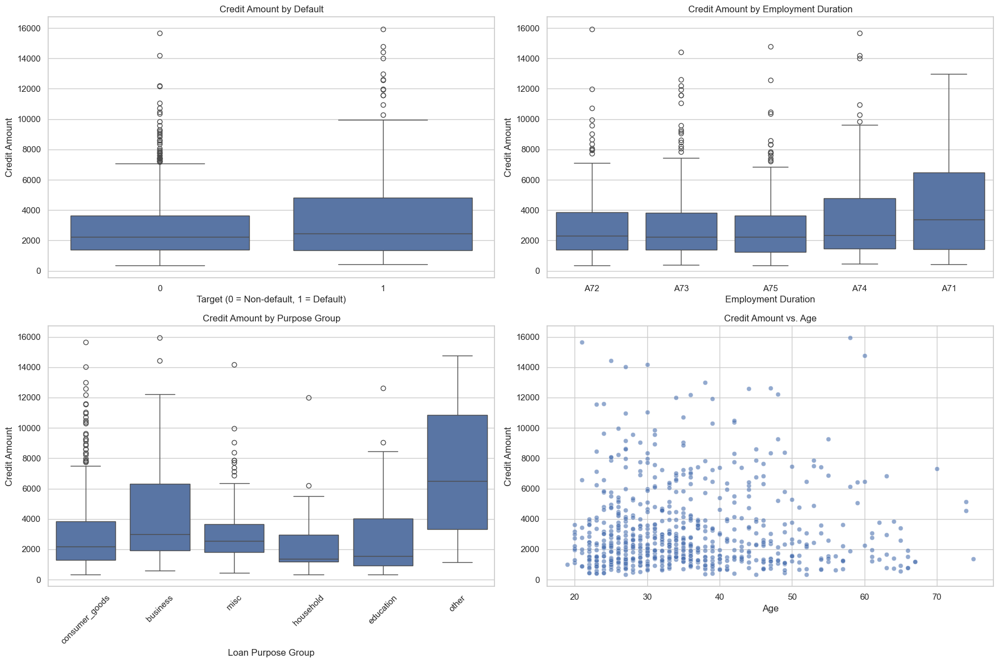

In [ ]:
def map_purpose_group(purpose):
    if purpose in ['A40', 'A41', 'A43']:
        return 'consumer_goods'       # cars, TV/radio
    elif purpose in ['A44', 'A45']:
        return 'household'            # appliances, repairs
    elif purpose in ['A46', 'A48']:
        return 'education'            # education, retraining
    elif purpose == 'A49':
        return 'business'
    elif purpose == 'A410':
        return 'other'
    else:
        return 'misc'

df['purpose_group'] = df['purpose'].apply(map_purpose_group)

sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Credit Amount vs Target
plt.subplot(2, 2, 1)
sns.boxplot(data=df, x='target', y='credit_amount')
plt.title('Credit Amount by Default')
plt.xlabel('Target (0 = Non-default, 1 = Default)')
plt.ylabel('Credit Amount')

# 2. Credit Amount vs Employment Duration
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='employment_duration', y='credit_amount')
plt.title('Credit Amount by Employment Duration')
plt.xlabel('Employment Duration')
plt.ylabel('Credit Amount')

# 3. Credit Amount vs Purpose Group
plt.subplot(2, 2, 3)
sns.boxplot(data=df, x='purpose_group', y='credit_amount')
plt.title('Credit Amount by Purpose Group')
plt.xlabel('Loan Purpose Group')
plt.ylabel('Credit Amount')
plt.xticks(rotation=45)

# 4. Credit Amount vs Age
plt.subplot(2, 2, 4)
sns.scatterplot(data=df, x='age', y='credit_amount', alpha=0.6)
plt.title('Credit Amount vs. Age')
plt.xlabel('Age')
plt.ylabel('Credit Amount')

plt.tight_layout()
plt.show()


### 📊 Insights: Credit Amount and Borrower Risk Patterns

- **Default**: Applicants who default (target = 1) tend to request slightly higher loan amounts, with more extreme outliers, suggesting larger loans may increase default risk.

- **Employment Duration**: Surprisingly, unemployed applicants (`A71`) request the highest loan amounts on average. In contrast, applicants with longer job histories (`A74`, `A75`) borrow more moderately.

- **Loan Purpose Group**: Business and “other” loan purposes have the highest credit amounts, while household and education-related purposes involve smaller, more consistent loans.

- **Age**: Credit amounts are mostly clustered below €5000 across all ages. While a few older applicants take large loans, age alone doesn’t appear to strongly influence loan size.


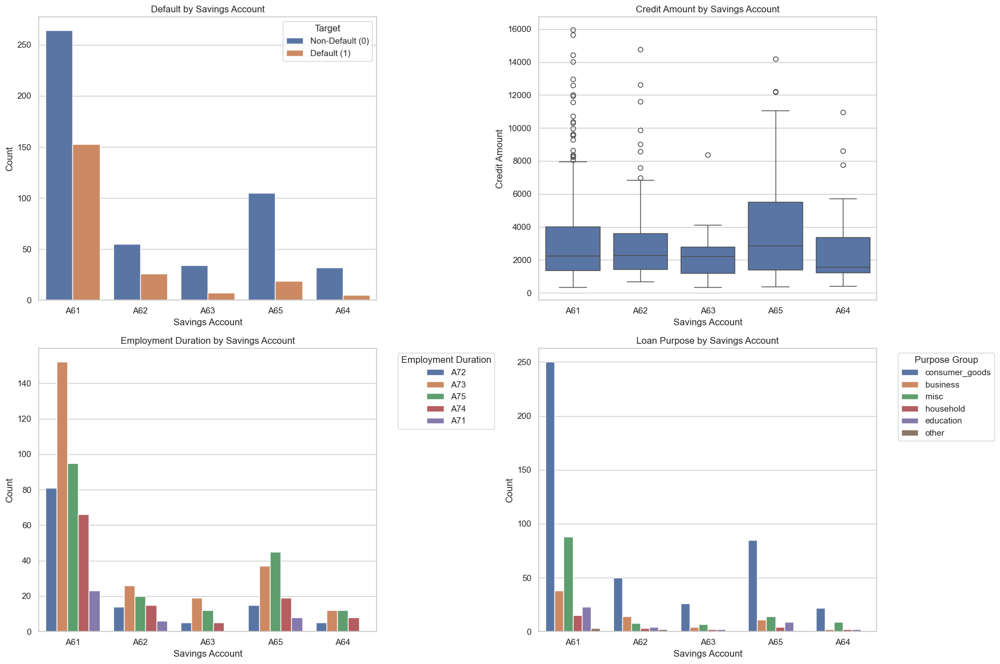

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Savings Account vs Target
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='savings_account', hue='target')
plt.title('Default by Savings Account')
plt.xlabel('Savings Account')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Savings Account vs Credit Amount
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='savings_account', y='credit_amount')
plt.title('Credit Amount by Savings Account')
plt.xlabel('Savings Account')
plt.ylabel('Credit Amount')

# 3. Savings Account vs Employment Duration
plt.subplot(2, 2, 3)
sns.countplot(data=df, x='savings_account', hue='employment_duration')
plt.title('Employment Duration by Savings Account')
plt.xlabel('Savings Account')
plt.ylabel('Count')
plt.legend(title='Employment Duration', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Savings Account vs Purpose Group
plt.subplot(2, 2, 4)
sns.countplot(data=df, x='savings_account', hue='purpose_group')
plt.title('Loan Purpose by Savings Account')
plt.xlabel('Savings Account')
plt.ylabel('Count')
plt.legend(title='Purpose Group', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 📊 Insights: Savings Account and Credit Risk

- **Default**: Applicants with low savings (`A61`) have the highest default rates. In contrast, those with higher savings (`A63`, `A64`) rarely default, indicating stronger financial stability.

- **Credit Amount**: Some applicants with unknown or no savings (`A65`) receive large loan amounts, suggesting that limited visibility into liquidity could hide risk.

- **Employment Duration**: Low-savings applicants are more likely to have short or unstable job histories (`A71`, `A72`), compounding financial vulnerability.

- **Loan Purpose**: Most loans from low-savings applicants are for consumer goods, while higher-savings applicants request more diverse loan purposes, including business and education.


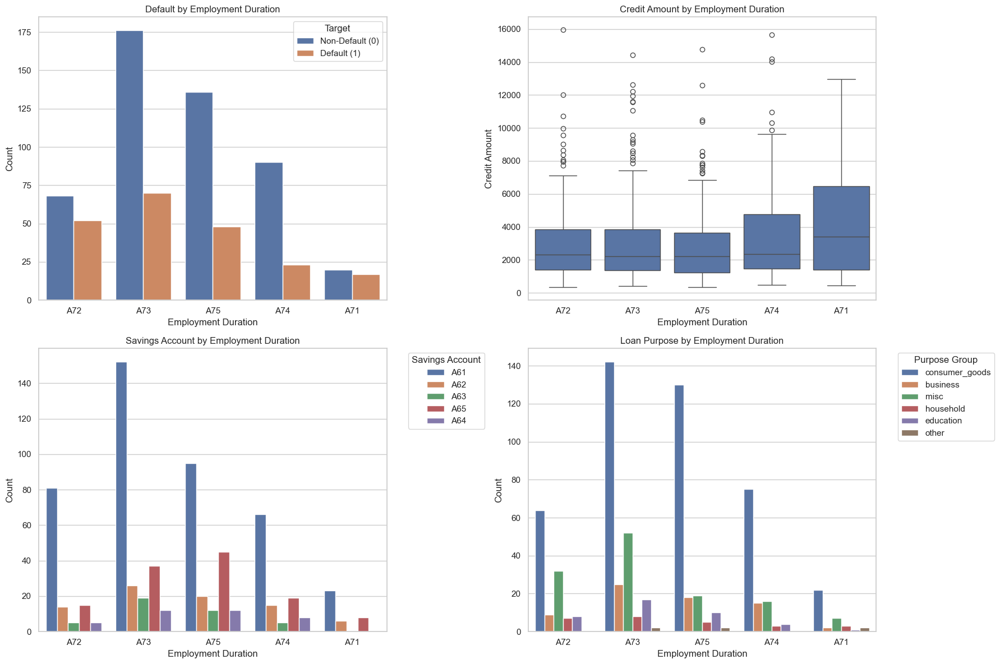

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Employment Duration vs Target
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='employment_duration', hue='target')
plt.title('Default by Employment Duration')
plt.xlabel('Employment Duration')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Employment Duration vs Credit Amount
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='employment_duration', y='credit_amount')
plt.title('Credit Amount by Employment Duration')
plt.xlabel('Employment Duration')
plt.ylabel('Credit Amount')

# 3. Employment Duration vs Savings Account
plt.subplot(2, 2, 3)
sns.countplot(data=df, x='employment_duration', hue='savings_account')
plt.title('Savings Account by Employment Duration')
plt.xlabel('Employment Duration')
plt.ylabel('Count')
plt.legend(title='Savings Account', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Employment Duration vs Purpose Group
plt.subplot(2, 2, 4)
sns.countplot(data=df, x='employment_duration', hue='purpose_group')
plt.title('Loan Purpose by Employment Duration')
plt.xlabel('Employment Duration')
plt.ylabel('Count')
plt.legend(title='Purpose Group', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 📊 Insights: Employment Duration and Credit Risk

- **Default**: Applicants with short employment duration (`A72`, `A73`) show the highest default rates. Interestingly, both long-term employed (`A75`) and unemployed (`A71`) have lower default counts, possibly due to more predictable financial behavior.

- **Credit Amount**: Unemployed (`A71`) and long-employed (`A75`) applicants tend to request larger loan amounts, while mid-term employed groups borrow more modestly.

- **Savings Account**: Applicants with short employment history generally have lower or unknown savings. Higher savings levels are more common among those with longer job tenure.

- **Loan Purpose**: Short-tenure applicants mostly take loans for consumer goods. In contrast, long-employed borrowers are more likely to request loans for business or education, suggesting more diverse financial planning.


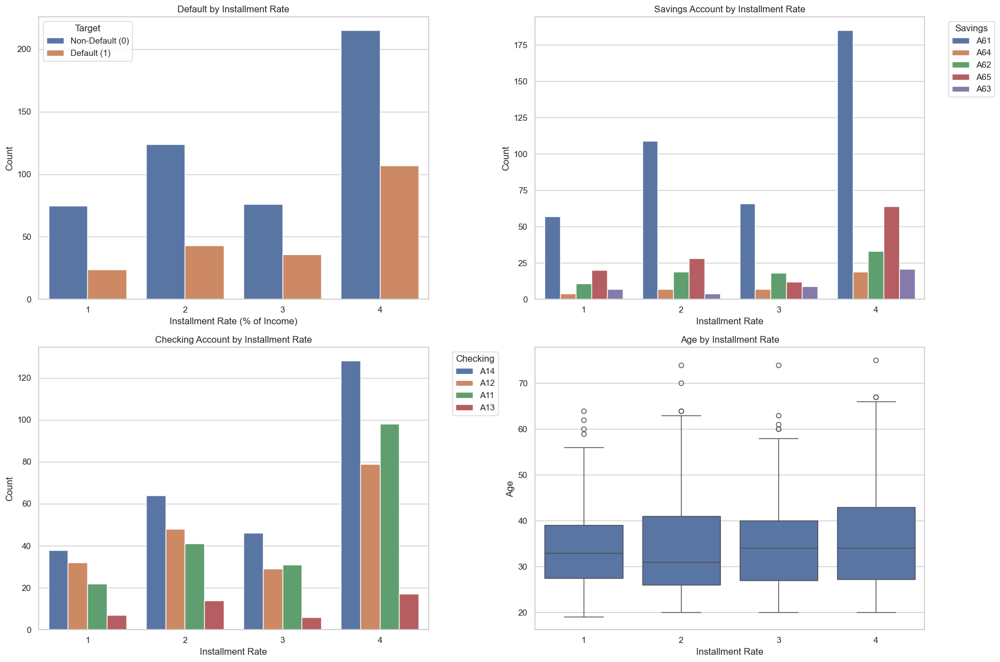

In [ ]:

sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Installment Rate vs Target
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='installment_rate', hue='target')
plt.title('Default by Installment Rate')
plt.xlabel('Installment Rate (% of Income)')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Installment Rate vs Savings Account
plt.subplot(2, 2, 2)
sns.countplot(data=df, x='installment_rate', hue='savings_account')
plt.title('Savings Account by Installment Rate')
plt.xlabel('Installment Rate')
plt.ylabel('Count')
plt.legend(title='Savings', bbox_to_anchor=(1.05, 1), loc='upper left')

# 3. Installment Rate vs Checking Account
plt.subplot(2, 2, 3)
sns.countplot(data=df, x='installment_rate', hue='checking_account')
plt.title('Checking Account by Installment Rate')
plt.xlabel('Installment Rate')
plt.ylabel('Count')
plt.legend(title='Checking', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Installment Rate vs Age
plt.subplot(2, 2, 4)
sns.boxplot(data=df, x='installment_rate', y='age')
plt.title('Age by Installment Rate')
plt.xlabel('Installment Rate')
plt.ylabel('Age')

plt.tight_layout()
plt.show()


### 📊 Insights: Installment Rate and Credit Risk

- **Default**: Higher installment rates are clearly linked to more defaults. Applicants with an installment rate of 4 (highest burden) show the most defaults, suggesting debt-to-income pressure is a strong risk signal.

- **Savings Account**: Applicants with higher installment burdens tend to have low or unknown savings (`A61`, `A65`). This indicates that high repayment ratios often coincide with limited liquidity.

- **Checking Account**: Those with higher installment rates more often have low checking account balances (`A11`, `A12`), reinforcing the trend of low short-term liquidity under high debt pressure.

- **Age**: Higher installment rates are slightly more common among older applicants, but the difference is subtle. Debt burden appears more behavior-driven than age-dependent.


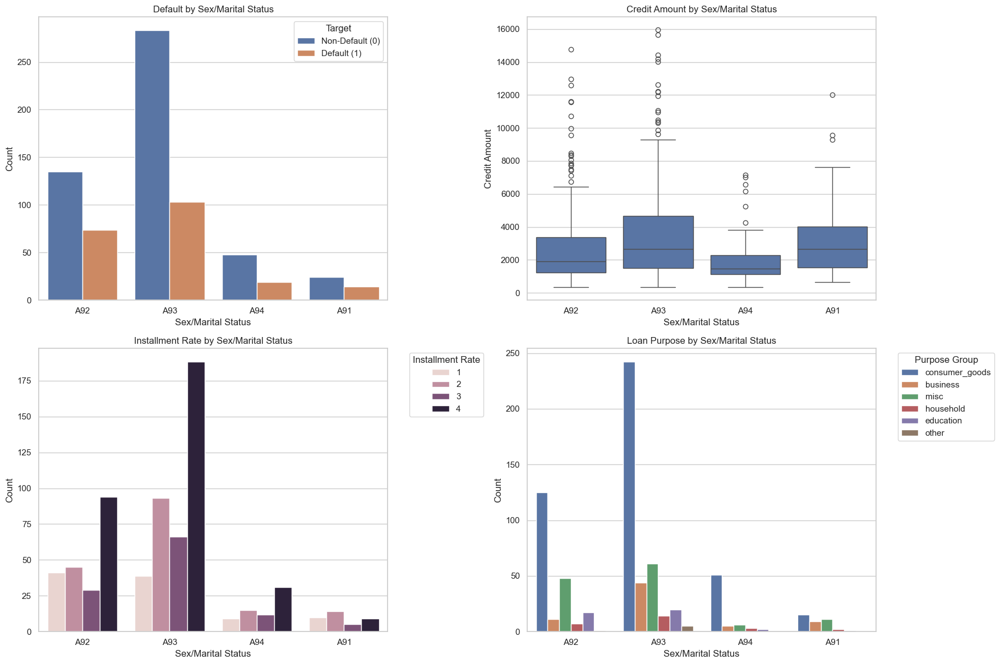

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(18, 12))

# 1. Default by Sex
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='personal_status_sex', hue='target')
plt.title('Default by Sex/Marital Status')
plt.xlabel('Sex/Marital Status')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Credit Amount by Sex
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='personal_status_sex', y='credit_amount')
plt.title('Credit Amount by Sex/Marital Status')
plt.xlabel('Sex/Marital Status')
plt.ylabel('Credit Amount')

# 3. Installment Rate by Sex
plt.subplot(2, 2, 3)
sns.countplot(data=df, x='personal_status_sex', hue='installment_rate')
plt.title('Installment Rate by Sex/Marital Status')
plt.xlabel('Sex/Marital Status')
plt.ylabel('Count')
plt.legend(title='Installment Rate', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Loan Purpose by Sex
plt.subplot(2, 2, 4)
sns.countplot(data=df, x='personal_status_sex', hue='purpose_group')
plt.title('Loan Purpose by Sex/Marital Status')
plt.xlabel('Sex/Marital Status')
plt.ylabel('Count')
plt.legend(title='Purpose Group', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 📊 Insights: Sex/Marital Status and Credit Behavior

- **Default**: Single males (`A93`) show the highest number of defaults, followed by married females (`A92`). This may reflect varying levels of financial responsibility or risk tolerance.

- **Credit Amount**: Single males (`A93`) tend to request the highest credit amounts, while married (`A94`) and divorced males (`A91`) borrow less on average.

- **Installment Rate**: A large portion of single male applicants fall into the highest installment burden group (rate = 4), indicating elevated repayment pressure.

- **Loan Purpose**: Consumer goods are the dominant loan purpose for all groups, but especially common among single males. Other categories (like business or education) are more distributed among other groups.


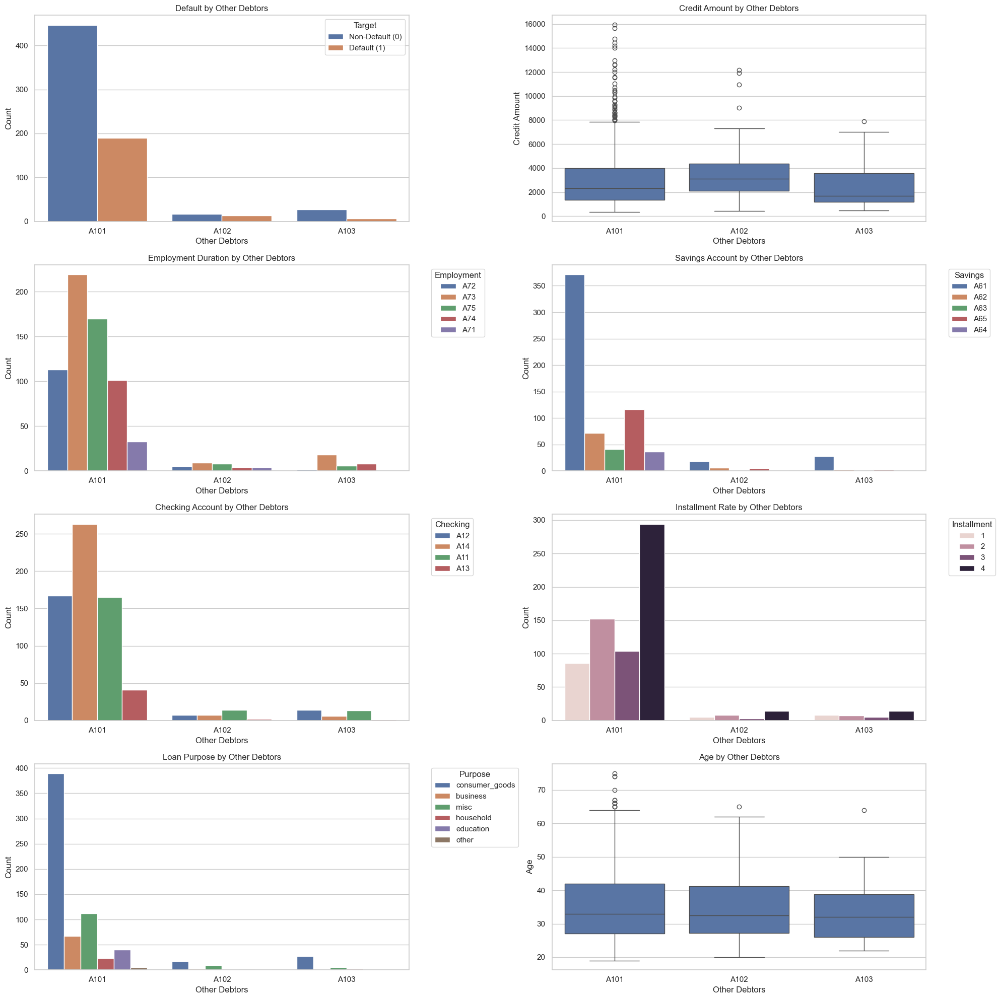

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(20, 20))

# 1. Target
plt.subplot(4, 2, 1)
sns.countplot(data=df, x='other_debtors', hue='target')
plt.title('Default by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default (0)', 'Default (1)'])

# 2. Credit Amount
plt.subplot(4, 2, 2)
sns.boxplot(data=df, x='other_debtors', y='credit_amount')
plt.title('Credit Amount by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Credit Amount')

# 3. Employment Duration
plt.subplot(4, 2, 3)
sns.countplot(data=df, x='other_debtors', hue='employment_duration')
plt.title('Employment Duration by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Count')
plt.legend(title='Employment', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Savings Account
plt.subplot(4, 2, 4)
sns.countplot(data=df, x='other_debtors', hue='savings_account')
plt.title('Savings Account by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Count')
plt.legend(title='Savings', bbox_to_anchor=(1.05, 1), loc='upper left')

# 5. Checking Account
plt.subplot(4, 2, 5)
sns.countplot(data=df, x='other_debtors', hue='checking_account')
plt.title('Checking Account by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Count')
plt.legend(title='Checking', bbox_to_anchor=(1.05, 1), loc='upper left')

# 6. Installment Rate
plt.subplot(4, 2, 6)
sns.countplot(data=df, x='other_debtors', hue='installment_rate')
plt.title('Installment Rate by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Count')
plt.legend(title='Installment', bbox_to_anchor=(1.05, 1), loc='upper left')

# 7. Purpose Group
plt.subplot(4, 2, 7)
sns.countplot(data=df, x='other_debtors', hue='purpose_group')
plt.title('Loan Purpose by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Count')
plt.legend(title='Purpose', bbox_to_anchor=(1.05, 1), loc='upper left')

# 8. Age
plt.subplot(4, 2, 8)
sns.boxplot(data=df, x='other_debtors', y='age')
plt.title('Age by Other Debtors')
plt.xlabel('Other Debtors')
plt.ylabel('Age')

plt.tight_layout()
plt.show()


### 📊 Insights: Other Debtors and Credit Risk Behavior

- **Default**: Most applicants have no co-debtor (`A101`). Co-applicants (`A102`) and guarantors (`A103`) are rare but show slightly higher default rates relative to their counts.

- **Credit Amount**: Applicants with co-debtors tend to receive slightly higher loan amounts than those applying individually.

- **Employment Duration**: Co-debtors are more common among applicants with shorter or unstable employment, suggesting a possible compensation for weak job stability.

- **Savings Account**: Most co-debtor applicants have low or unknown savings (`A61`, `A65`), indicating limited financial reserves.

- **Checking Account**: Co-debtors are mostly found in low checking balance categories, reinforcing the liquidity-constrained profile.

- **Installment Rate**: Those with co-debtors are more concentrated in higher repayment burden groups (3–4), suggesting co-borrowing is used to access larger loans despite high debt loads.

- **Loan Purpose**: Consumer goods dominate across all groups, but loans for business or education are slightly more represented among co-debtor applicants.

- **Age**: Applicants with co-debtors tend to be slightly younger, indicating that joint applications may help support early-stage borrowers.


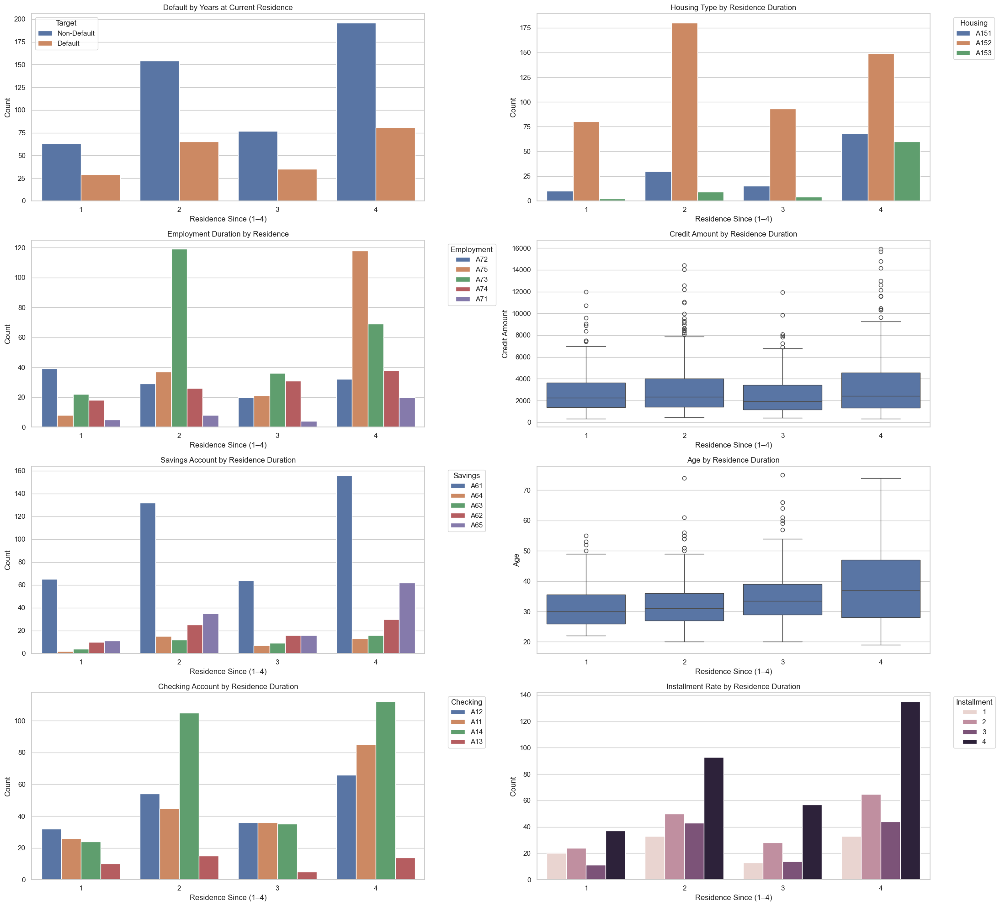

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(22, 20))

# 1. Target
plt.subplot(4, 2, 1)
sns.countplot(data=df, x='residence_since', hue='target')
plt.title('Default by Years at Current Residence')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default', 'Default'])

# 2. Housing
plt.subplot(4, 2, 2)
sns.countplot(data=df, x='residence_since', hue='housing')
plt.title('Housing Type by Residence Duration')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Count')
plt.legend(title='Housing', bbox_to_anchor=(1.05, 1), loc='upper left')

# 3. Employment Duration
plt.subplot(4, 2, 3)
sns.countplot(data=df, x='residence_since', hue='employment_duration')
plt.title('Employment Duration by Residence')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Count')
plt.legend(title='Employment', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Credit Amount
plt.subplot(4, 2, 4)
sns.boxplot(data=df, x='residence_since', y='credit_amount')
plt.title('Credit Amount by Residence Duration')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Credit Amount')

# 5. Savings Account
plt.subplot(4, 2, 5)
sns.countplot(data=df, x='residence_since', hue='savings_account')
plt.title('Savings Account by Residence Duration')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Count')
plt.legend(title='Savings', bbox_to_anchor=(1.05, 1), loc='upper left')

# 6. Age
plt.subplot(4, 2, 6)
sns.boxplot(data=df, x='residence_since', y='age')
plt.title('Age by Residence Duration')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Age')

# 7. Checking Account
plt.subplot(4, 2, 7)
sns.countplot(data=df, x='residence_since', hue='checking_account')
plt.title('Checking Account by Residence Duration')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Count')
plt.legend(title='Checking', bbox_to_anchor=(1.05, 1), loc='upper left')

# 8. Installment Rate
plt.subplot(4, 2, 8)
sns.countplot(data=df, x='residence_since', hue='installment_rate')
plt.title('Installment Rate by Residence Duration')
plt.xlabel('Residence Since (1–4)')
plt.ylabel('Count')
plt.legend(title='Installment', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 📊 Insights: Residence Duration and Credit Behavior

- **Default**: Applicants who have lived at their current address for 4+ years (category `4`) show the highest number of non-defaults. Those with only 1 year of residence (`1`) have slightly elevated default rates, suggesting that residential instability may relate to higher credit risk.

- **Employment Duration**: Longer residence is linked to more stable employment (`A73`, `A75`), supporting the idea that residential and job stability are often correlated.

- **Credit Amount**: Median credit amount is slightly higher for those with longer residence, reflecting stronger creditworthiness or more borrowing power.

- **Age**: Applicants who’ve lived longer at one address are generally older, which aligns with life-stage stability and financial maturity.

- **Savings Account**: Those in the 4-year group have more diverse savings profiles, with a higher portion in stronger categories (`A65`, `A62`), though `A61` (no savings) remains common.


- **Installment Rate**: Higher installment rates (3 and 4) are more common among long-term residents, possibly due to access to larger loans.

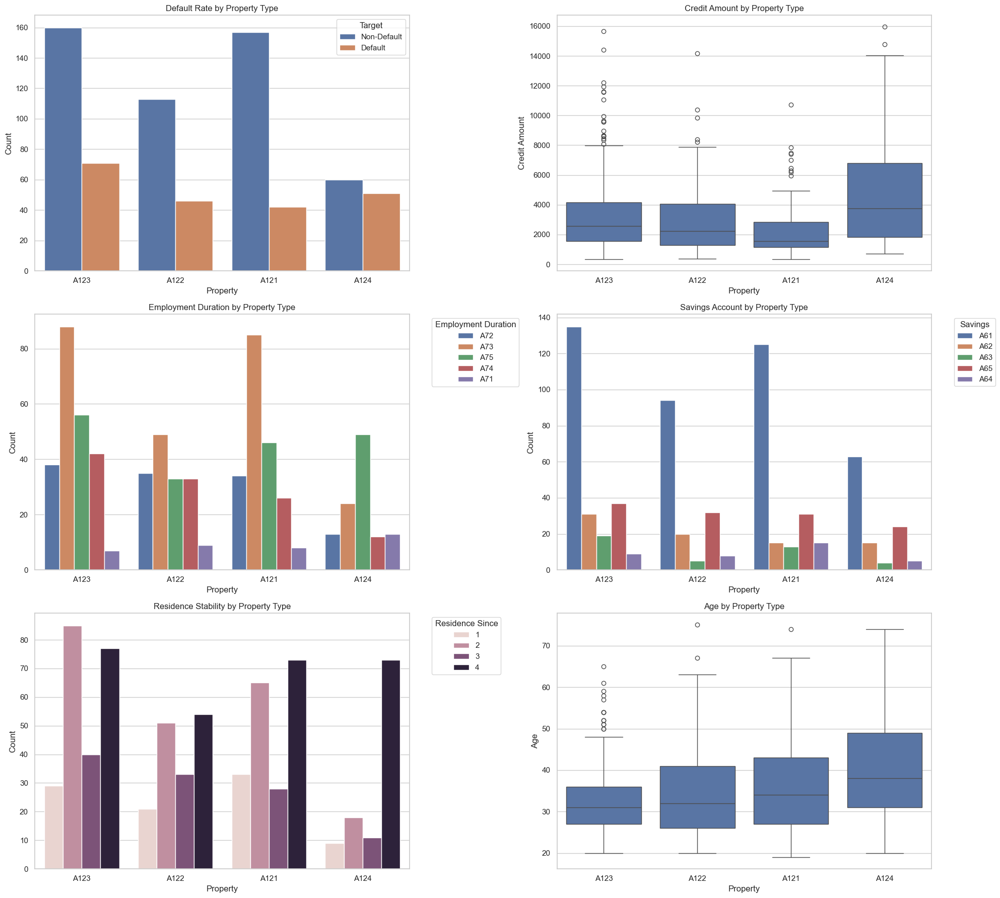

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(20, 18))

# 1. Target
plt.subplot(3, 2, 1)
sns.countplot(data=df, x='property', hue='target')
plt.title('Default Rate by Property Type')
plt.xlabel('Property')
plt.ylabel('Count')
plt.legend(title='Target', labels=['Non-Default', 'Default'])

# 2. Credit Amount
plt.subplot(3, 2, 2)
sns.boxplot(data=df, x='property', y='credit_amount')
plt.title('Credit Amount by Property Type')
plt.xlabel('Property')
plt.ylabel('Credit Amount')

# 3. Employment Duration
plt.subplot(3, 2, 3)
sns.countplot(data=df, x='property', hue='employment_duration')
plt.title('Employment Duration by Property Type')
plt.xlabel('Property')
plt.ylabel('Count')
plt.legend(title='Employment Duration', bbox_to_anchor=(1.05, 1), loc='upper left')

# 4. Savings Account
plt.subplot(3, 2, 4)
sns.countplot(data=df, x='property', hue='savings_account')
plt.title('Savings Account by Property Type')
plt.xlabel('Property')
plt.ylabel('Count')
plt.legend(title='Savings', bbox_to_anchor=(1.05, 1), loc='upper left')

# 5. Residence Since
plt.subplot(3, 2, 5)
sns.countplot(data=df, x='property', hue='residence_since')
plt.title('Residence Stability by Property Type')
plt.xlabel('Property')
plt.ylabel('Count')
plt.legend(title='Residence Since', bbox_to_anchor=(1.05, 1), loc='upper left')

# 6. Age
plt.subplot(3, 2, 6)
sns.boxplot(data=df, x='property', y='age')
plt.title('Age by Property Type')
plt.xlabel('Property')
plt.ylabel('Age')

plt.tight_layout()
plt.show()


### 🏠 Insights: Property Type and Credit Risk Indicators

- **Default Rate**: Applicants with no property (`A124`) show higher default rates compared to those with real estate, car ownership, or savings-based assets. Property ownership appears linked to reduced credit risk.

- **Credit Amount**: Those without property tend to request larger credit amounts, possibly indicating higher financial need or lack of collateral.

- **Employment Duration**: Real estate (`A121`) and savings/insurance (`A122`) holders are more represented in longer employment durations (`A74`, `A75`), reflecting greater income stability.

- **Savings Account**: Applicants with tangible or financial assets — such as cars (`A123`) or savings (`A121`) — tend to have better savings profiles, particularly in the `A61` and `A62` categories.

- **Residence Stability**: Long-term residence (`residence_since` 3 or 4) is more common among property holders (`A121`, `A123`), reinforcing their stability signal.

- **Age**: Interestingly, applicants without property (`A124`) are generally older, which might reflect prior asset loss, retirement, or post-liquidation financial situations.


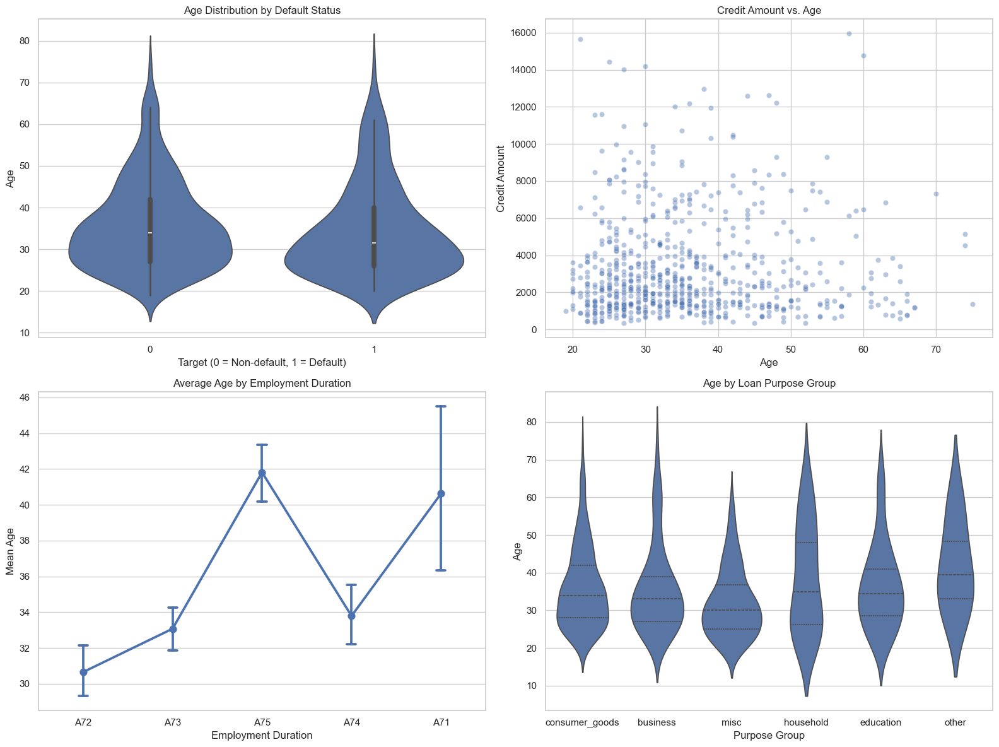

In [ ]:

sns.set(style='whitegrid')
plt.figure(figsize=(16, 12))

# 1. Violinplot: Age by Default Status (Target)
plt.subplot(2, 2, 1)
sns.violinplot(data=df, x='target', y='age', inner='box')
plt.title('Age Distribution by Default Status')
plt.xlabel('Target (0 = Non-default, 1 = Default)')
plt.ylabel('Age')

# 2. Scatterplot: Credit Amount vs. Age
plt.subplot(2, 2, 2)
sns.scatterplot(data=df, x='age', y='credit_amount', alpha=0.4)
plt.title('Credit Amount vs. Age')
plt.xlabel('Age')
plt.ylabel('Credit Amount')

# 3. Pointplot: Age by Employment Duration
plt.subplot(2, 2, 3)
sns.pointplot(data=df, x='employment_duration', y='age', capsize=.1)
plt.title('Average Age by Employment Duration')
plt.xlabel('Employment Duration')
plt.ylabel('Mean Age')

# 4. Violinplot: Age by Loan Purpose Group
plt.subplot(2, 2, 4)
sns.violinplot(data=df, x='purpose_group', y='age', inner='quartile')
plt.title('Age by Loan Purpose Group')
plt.xlabel('Purpose Group')
plt.ylabel('Age')

plt.tight_layout()
plt.show()


### 📊 Insights: Age and Credit Risk Relationships

- **Age Distribution by Default Status**  
  The distribution of age shows that defaulters are slightly more concentrated in younger age brackets, while older applicants are more represented among non-defaulters. However, the overall shape is relatively similar across groups.

- **Credit Amount vs. Age**  
  Most credit amounts are concentrated among applicants aged 25–40. Interestingly, some of the highest loan amounts are taken by younger individuals, which may reflect early-life financial ambition or higher risk tolerance.

- **Average Age by Employment Duration**  
  There is a clear upward trend in age with longer employment duration. Applicants who are unemployed or newly employed tend to be younger, while those with more stable job histories are typically older.

- **Age by Loan Purpose Group**  
  Different age groups seek credit for different reasons. Younger borrowers often request loans for consumer goods or business, while older applicants are more likely to apply for education- or household-related loans.


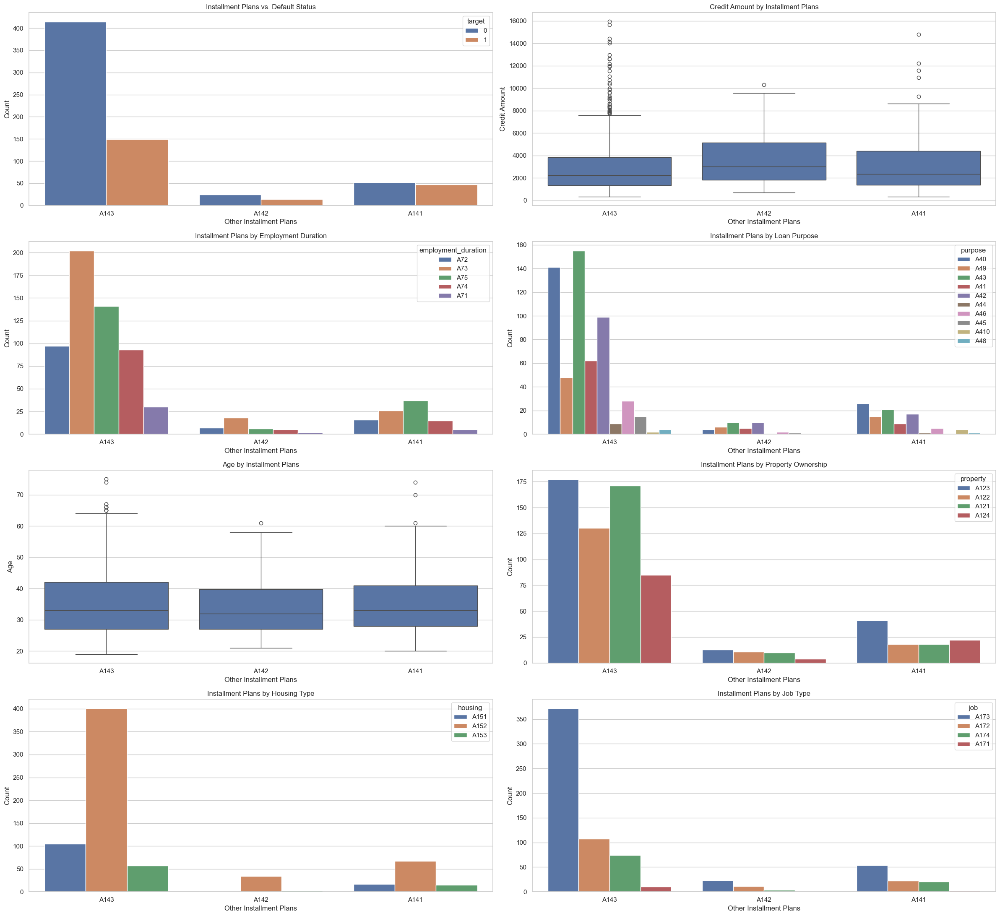

In [ ]:
sns.set(style='whitegrid')
plt.figure(figsize=(24, 22))

# 1. other_installment_plans vs Target
plt.subplot(4, 2, 1)
sns.countplot(data=df, x='other_installment_plans', hue='target')
plt.title('Installment Plans vs. Default Status')
plt.xlabel('Other Installment Plans')
plt.ylabel('Count')

# 2. other_installment_plans vs Credit Amount
plt.subplot(4, 2, 2)
sns.boxplot(data=df, x='other_installment_plans', y='credit_amount')
plt.title('Credit Amount by Installment Plans')
plt.xlabel('Other Installment Plans')
plt.ylabel('Credit Amount')

# 3. other_installment_plans vs Employment Duration
plt.subplot(4, 2, 3)
sns.countplot(data=df, x='other_installment_plans', hue='employment_duration')
plt.title('Installment Plans by Employment Duration')
plt.xlabel('Other Installment Plans')
plt.ylabel('Count')

# 4. other_installment_plans vs Purpose
plt.subplot(4, 2, 4)
sns.countplot(data=df, x='other_installment_plans', hue='purpose')
plt.title('Installment Plans by Loan Purpose')
plt.xlabel('Other Installment Plans')
plt.ylabel('Count')
plt.xticks(rotation=0)

# 5. other_installment_plans vs Age
plt.subplot(4, 2, 5)
sns.boxplot(data=df, x='other_installment_plans', y='age')
plt.title('Age by Installment Plans')
plt.xlabel('Other Installment Plans')
plt.ylabel('Age')

# 6. other_installment_plans vs Property
plt.subplot(4, 2, 6)
sns.countplot(data=df, x='other_installment_plans', hue='property')
plt.title('Installment Plans by Property Ownership')
plt.xlabel('Other Installment Plans')
plt.ylabel('Count')

# 7. other_installment_plans vs Housing
plt.subplot(4, 2, 7)
sns.countplot(data=df, x='other_installment_plans', hue='housing')
plt.title('Installment Plans by Housing Type')
plt.xlabel('Other Installment Plans')
plt.ylabel('Count')

# 8. other_installment_plans vs Job
plt.subplot(4, 2, 8)
sns.countplot(data=df, x='other_installment_plans', hue='job')
plt.title('Installment Plans by Job Type')
plt.xlabel('Other Installment Plans')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


### 📊 Insights: Installment Plans and Borrower Characteristics

- **Default**: Most applicants have installment plans through the bank (`A143`). Defaults are most frequent in this group, though this may reflect its size rather than increased risk.

- **Credit Amount**: Applicants without installment plans (`A142`) tend to receive higher loan amounts, suggesting they may be more financially stable or have access to alternative financing.

- **Employment Duration**: Bank installment plans are used across all employment categories but are most common among unemployed or shorter-employed individuals (`A71`, `A73`), indicating it may serve as a fallback option.

- **Loan Purpose**: Loans for consumer goods dominate all installment types. Non-bank options (`A141`, `A142`) are occasionally used for business or education-related loans.

- **Property Ownership**: Most bank installment users (`A143`) have property coded as `A123`, possibly indicating lower-value or more common forms of ownership.

- **Age**: Age distribution is relatively consistent across all installment types, with slightly older applicants using non-bank options.

- **Housing Type**: Bank installment plans are mostly used by those in rented housing (`A152`), while non-bank options are more evenly distributed.

- **Job Type**: Skilled workers (`A173`) and unskilled laborers (`A172`) dominate bank installment usage, while managerial roles are more balanced across installment types.

🔍 **Conclusion**: Installment plan type reflects broader financial behaviors and access. Bank-linked plans dominate but may be associated with riskier borrower profiles compared to non-installment or third-party alternatives.

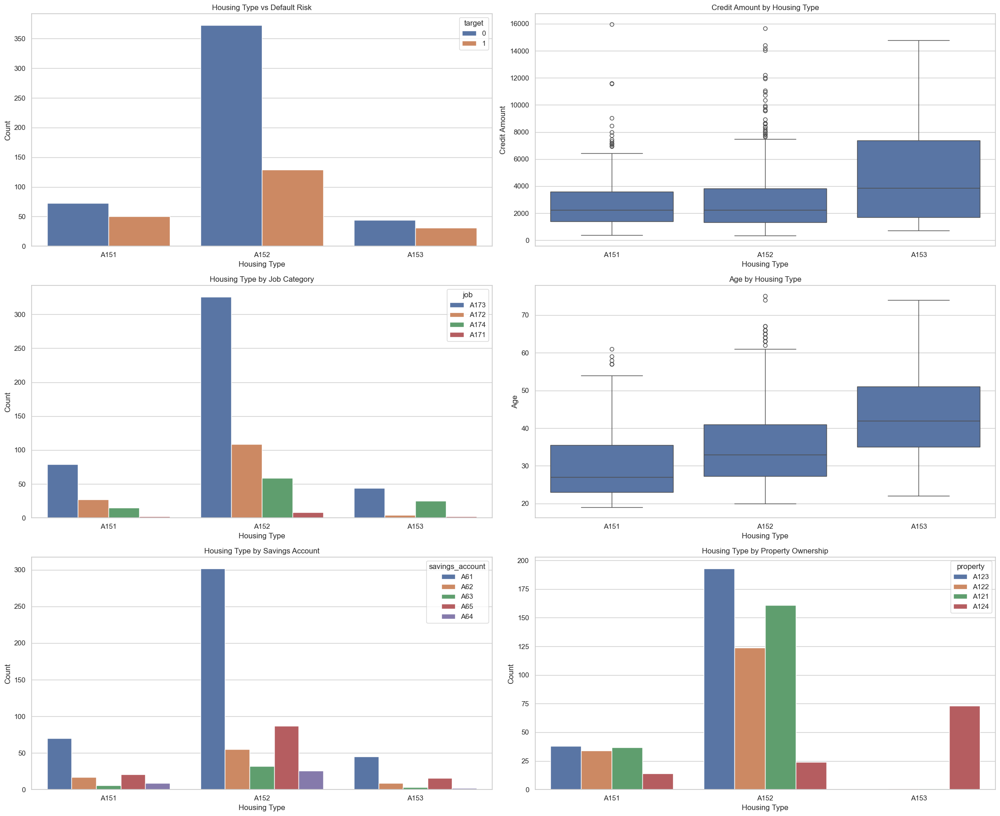

In [ ]:

plt.figure(figsize=(22, 18))
sns.set(style='whitegrid')

# 1. Housing vs Target
plt.subplot(3, 2, 1)
sns.countplot(data=df, x='housing', hue='target')
plt.title('Housing Type vs Default Risk')
plt.xlabel('Housing Type')
plt.ylabel('Count')

# 2. Housing vs Credit Amount
plt.subplot(3, 2, 2)
sns.boxplot(data=df, x='housing', y='credit_amount')
plt.title('Credit Amount by Housing Type')
plt.xlabel('Housing Type')
plt.ylabel('Credit Amount')

# 3. Housing vs Job
plt.subplot(3, 2, 3)
sns.countplot(data=df, x='housing', hue='job')
plt.title('Housing Type by Job Category')
plt.xlabel('Housing Type')
plt.ylabel('Count')

# 4. Housing vs Age
plt.subplot(3, 2, 4)
sns.boxplot(data=df, x='housing', y='age')
plt.title('Age by Housing Type')
plt.xlabel('Housing Type')
plt.ylabel('Age')

# 5. Housing vs Savings Account
plt.subplot(3, 2, 5)
sns.countplot(data=df, x='housing', hue='savings_account')
plt.title('Housing Type by Savings Account')
plt.xlabel('Housing Type')
plt.ylabel('Count')

# 6. Housing vs Property
plt.subplot(3, 2, 6)
sns.countplot(data=df, x='housing', hue='property')
plt.title('Housing Type by Property Ownership')
plt.xlabel('Housing Type')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


### Insights: Housing Type and Credit Behavior

- **Default Risk**:  
  Applicants who **own their home (`A152`)** make up the majority and exhibit **moderate default rates**, while those who **rent (`A151`)** or live **for free (`A153`)** show slightly **lower default counts** but may reflect different risk dynamics due to smaller sample sizes.

- **Credit Amount**:  
  Those **living for free (`A153`)** tend to borrow the **highest credit amounts**, with a wider spread and more outliers. In contrast, **renters** and **owners** request more modest amounts on average.

- **Job Category**:  
  Most **owners (`A152`)** are **unskilled (`A172`)** or **skilled (`A173`)** workers. **Highly qualified professionals (`A174`)** are rare across all housing types but slightly more represented among **renters**.

- **Age**:  
  Applicants **living for free (`A153`)** are generally **older**, while **renters (`A151`)** tend to be the **youngest**, possibly reflecting earlier career stages or transitional housing situations.

- **Savings Account**:  
  Owners (`A152`) show a **diverse distribution** across savings categories, but many fall into **low or unknown savings (`A61`, `A65`)**, suggesting that ownership does not always indicate high liquidity.

- **Property Ownership**:  
  As expected, those with **real estate (`A121`)** or **savings insurance (`A122`)** as assets are more likely to be in the **owner category (`A152`)**, reinforcing a correlation between **asset wealth and housing ownership**.

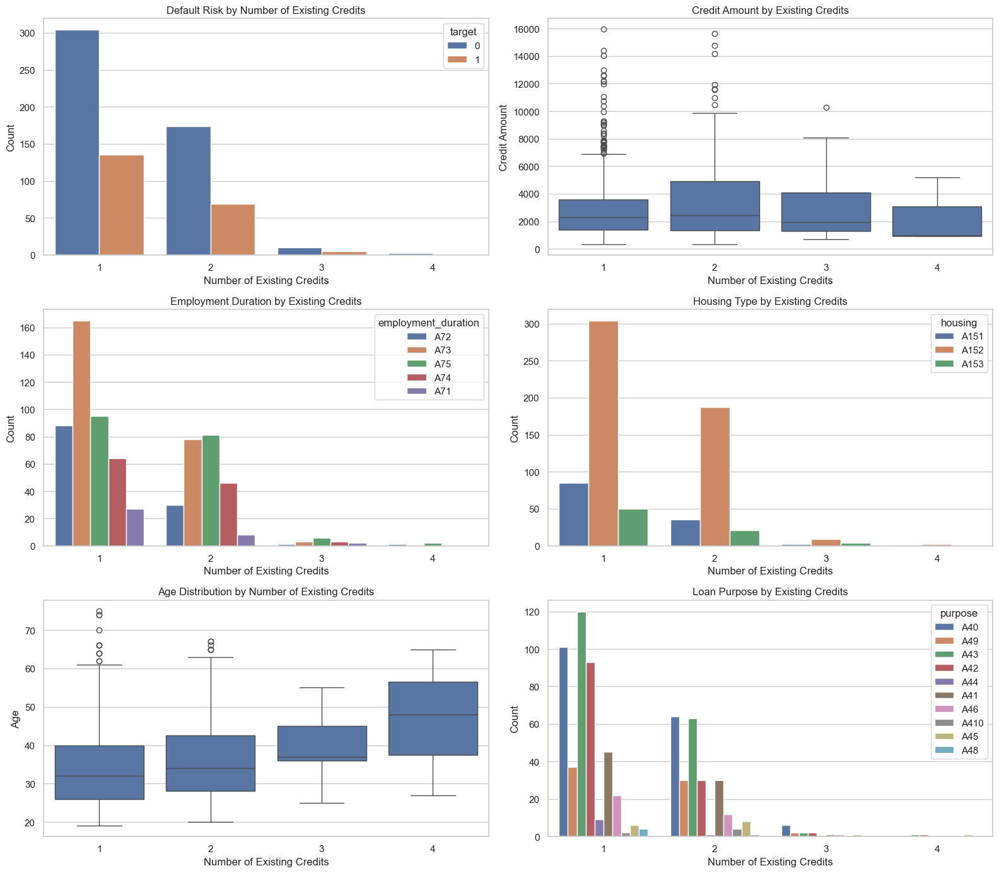

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Plot 1: Distribution by Default
sns.countplot(data=df, x='existing_credits', hue='target', ax=axs[0, 0])
axs[0, 0].set_title('Default Risk by Number of Existing Credits')
axs[0, 0].set_xlabel('Number of Existing Credits')
axs[0, 0].set_ylabel('Count')

# Plot 2: Credit Amount by Number of Existing Credits
sns.boxplot(data=df, x='existing_credits', y='credit_amount', ax=axs[0, 1])
axs[0, 1].set_title('Credit Amount by Existing Credits')
axs[0, 1].set_xlabel('Number of Existing Credits')
axs[0, 1].set_ylabel('Credit Amount')

# Plot 3: Employment Duration by Existing Credits
sns.countplot(data=df, x='existing_credits', hue='employment_duration', ax=axs[1, 0])
axs[1, 0].set_title('Employment Duration by Existing Credits')
axs[1, 0].set_xlabel('Number of Existing Credits')
axs[1, 0].set_ylabel('Count')

# Plot 4: Housing Type by Existing Credits
sns.countplot(data=df, x='existing_credits', hue='housing', ax=axs[1, 1])
axs[1, 1].set_title('Housing Type by Existing Credits')
axs[1, 1].set_xlabel('Number of Existing Credits')
axs[1, 1].set_ylabel('Count')

# Plot 5: Age by Existing Credits
sns.boxplot(data=df, x='existing_credits', y='age', ax=axs[2, 0])
axs[2, 0].set_title('Age Distribution by Number of Existing Credits')
axs[2, 0].set_xlabel('Number of Existing Credits')
axs[2, 0].set_ylabel('Age')

# Plot 6: Countplot with Loan Purpose
sns.countplot(data=df, x='existing_credits', hue='purpose', ax=axs[2, 1])
axs[2, 1].set_title('Loan Purpose by Existing Credits')
axs[2, 1].set_xlabel('Number of Existing Credits')
axs[2, 1].set_ylabel('Count')

plt.tight_layout()
plt.show()


###  Insights: Number of Existing Credits and Borrower Profile

- **Default Risk**:  
  Most applicants hold **only one existing credit**, and this group shows **moderate default rates**. Default risk does **not increase linearly** with more credits, but sample sizes drop sharply for 3–4 credits.

- **Credit Amount**:  
  Applicants with **2 or more existing credits** tend to request **higher loan amounts**, especially those with 2 credits, suggesting **increased financial capacity or risk appetite**.

- **Employment Duration**:  
  Longer employment duration (especially `A73` and `A75`, meaning 1–4 or ≥7 years) is most common among those with **one or two credits**, indicating a **more stable earning profile**.

- **Housing Type**:  
  The majority of those with 1–2 credits **own their home (`A152`)**, while **renters (`A151`)** are more prevalent among applicants with only one credit, suggesting financial growth with credit experience.

- **Age**:  
  Applicants with **more existing credits are generally older**, implying that credit accumulation **correlates with life stage and financial maturity**.

- **Loan Purpose**:  
  Applicants with **more credits** are still mostly borrowing for **consumer goods (`A43`, `A42`)**, but there is a slight **increase in business and education-related purposes** with more credit history.

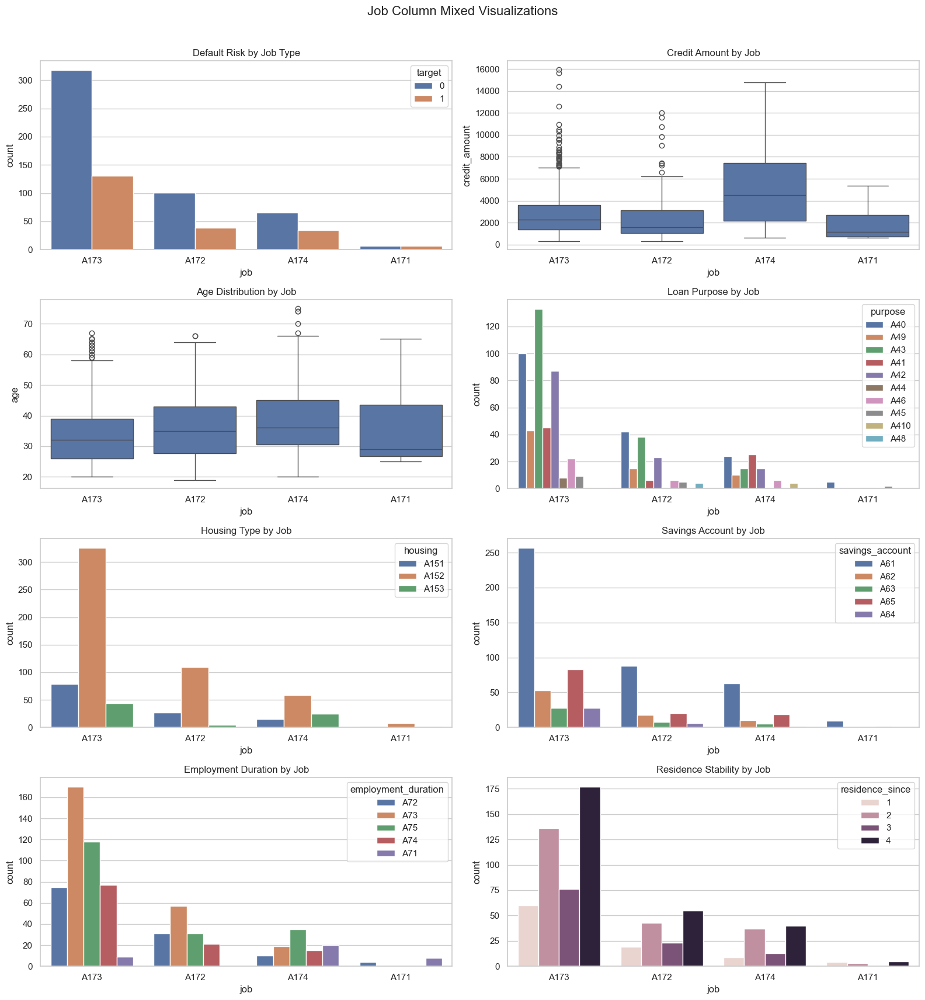

In [ ]:

# Set up 8-panel grid
fig, axes = plt.subplots(4, 2, figsize=(16, 18))
fig.suptitle('Job Column Mixed Visualizations', fontsize=16)

# 1. Job vs Target
sns.countplot(ax=axes[0, 0], data=df, x='job', hue='target')
axes[0, 0].set_title('Default Risk by Job Type')

# 2. Job vs Credit Amount
sns.boxplot(ax=axes[0, 1], data=df, x='job', y='credit_amount')
axes[0, 1].set_title('Credit Amount by Job')

# 3. Job vs Age
sns.boxplot(ax=axes[1, 0], data=df, x='job', y='age')
axes[1, 0].set_title('Age Distribution by Job')

# 4. Job vs Loan Purpose
sns.countplot(ax=axes[1, 1], data=df, x='job', hue='purpose')
axes[1, 1].set_title('Loan Purpose by Job')

# 5. Job vs Housing
sns.countplot(ax=axes[2, 0], data=df, x='job', hue='housing')
axes[2, 0].set_title('Housing Type by Job')

# 6. Job vs Savings Account
sns.countplot(ax=axes[2, 1], data=df, x='job', hue='savings_account')
axes[2, 1].set_title('Savings Account by Job')

# 7. Job vs Employment Duration
sns.countplot(ax=axes[3, 0], data=df, x='job', hue='employment_duration')
axes[3, 0].set_title('Employment Duration by Job')

# 8. Job vs Residence Since
sns.countplot(ax=axes[3, 1], data=df, x='job', hue='residence_since')
axes[3, 1].set_title('Residence Stability by Job')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


### Insights: Job Type and Borrower Profiles

- **Default Risk**: Default is most common among skilled workers (A173), followed by unskilled workers (A172). Unemployed applicants (A171) are fewer but have a higher default ratio.
- **Credit Amount**: Highly qualified professionals (A174) tend to request the highest credit amounts. Other job types request smaller but more consistent amounts.
- **Age**: Unemployed applicants (A171) are generally older, while skilled and unskilled workers are typically younger.
- **Loan Purpose**: Skilled workers (A173) borrow for a wide range of reasons, including business and consumer goods. Unemployed applicants borrow for more essential purposes.
- **Housing**: Skilled and unskilled workers mostly live in rented housing (A152), while highly qualified workers show a more diverse housing profile.
- **Savings Account**: Skilled workers are overrepresented among those with no savings (A61), indicating potential liquidity risk.
- **Employment Duration**: Skilled workers span across short and long job durations. Unemployed applicants are concentrated in the shortest employment category.
- **Residence Stability**: Shorter residence periods are common among skilled workers. Unemployed applicants show a slight skew toward longer residence durations.


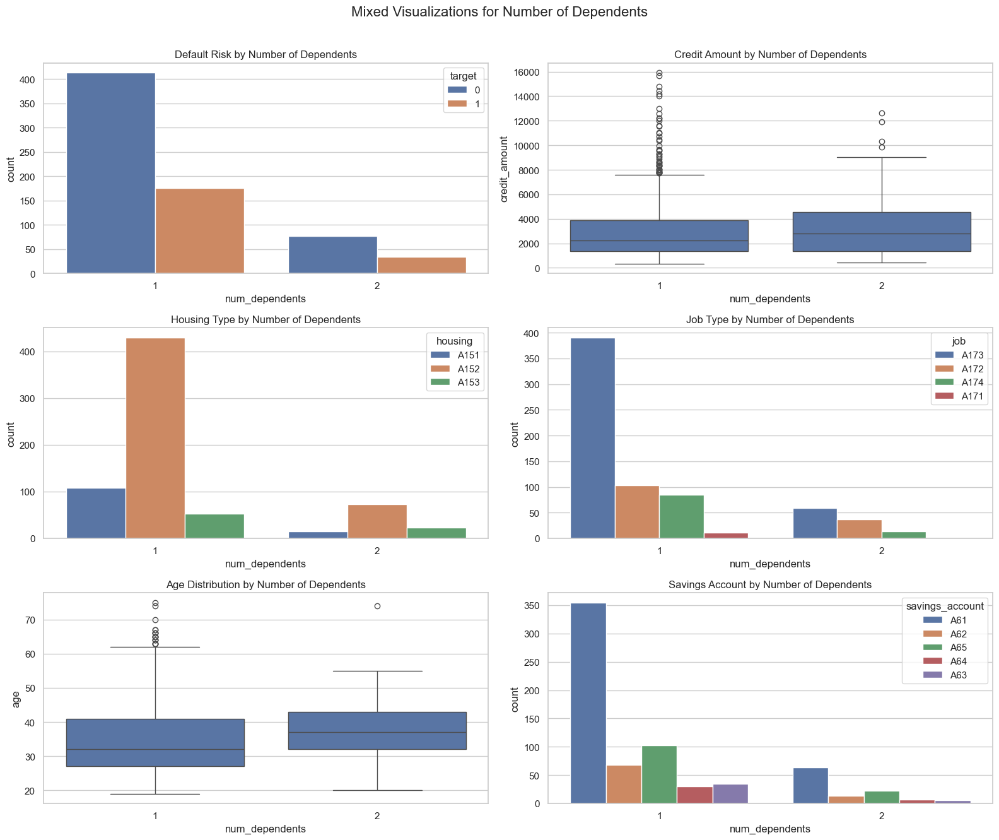

In [ ]:
# Set up the 6-panel grid
fig, axes = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle('Mixed Visualizations for Number of Dependents', fontsize=16)

# 1. num_dependents vs target
sns.countplot(ax=axes[0, 0], data=df, x='num_dependents', hue='target')
axes[0, 0].set_title('Default Risk by Number of Dependents')

# 2. num_dependents vs credit amount
sns.boxplot(ax=axes[0, 1], data=df, x='num_dependents', y='credit_amount')
axes[0, 1].set_title('Credit Amount by Number of Dependents')

# 3. num_dependents vs housing
sns.countplot(ax=axes[1, 0], data=df, x='num_dependents', hue='housing')
axes[1, 0].set_title('Housing Type by Number of Dependents')

# 4. num_dependents vs job
sns.countplot(ax=axes[1, 1], data=df, x='num_dependents', hue='job')
axes[1, 1].set_title('Job Type by Number of Dependents')

# 5. num_dependents vs age
sns.boxplot(ax=axes[2, 0], data=df, x='num_dependents', y='age')
axes[2, 0].set_title('Age Distribution by Number of Dependents')

# 6. num_dependents vs savings account
sns.countplot(ax=axes[2, 1], data=df, x='num_dependents', hue='savings_account')
axes[2, 1].set_title('Savings Account by Number of Dependents')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


###  Insights: Number of Dependents and Financial Profile

- **Default Risk**:  
  Applicants with **two dependents** show a **slightly higher default rate**, suggesting greater financial pressure compared to those with just one.

- **Credit Amount**:  
  Those with **two dependents** tend to request **slightly higher credit amounts**, possibly reflecting increased household expenses.

- **Housing Type**:  
  The majority of applicants with either one or two dependents **own their homes (`A152`)**, although renters (`A151`) are slightly more represented among those with one dependent.

- **Job Type**:  
  **Highly qualified jobs (`A174`)** dominate among applicants with **one dependent**, while two-dependent applicants are more spread across **skilled and unskilled roles**.

- **Age**:  
  Applicants with **two dependents are slightly older on average**, which aligns with expectations of larger family responsibilities.

- **Savings Account**:  
  Across both groups, most applicants have **low (`A61`) or no known savings (`A65`)**, but the two-dependent group shows a slight increase in mid-level savings (`A62`–`A64`), indicating a marginally better buffer.

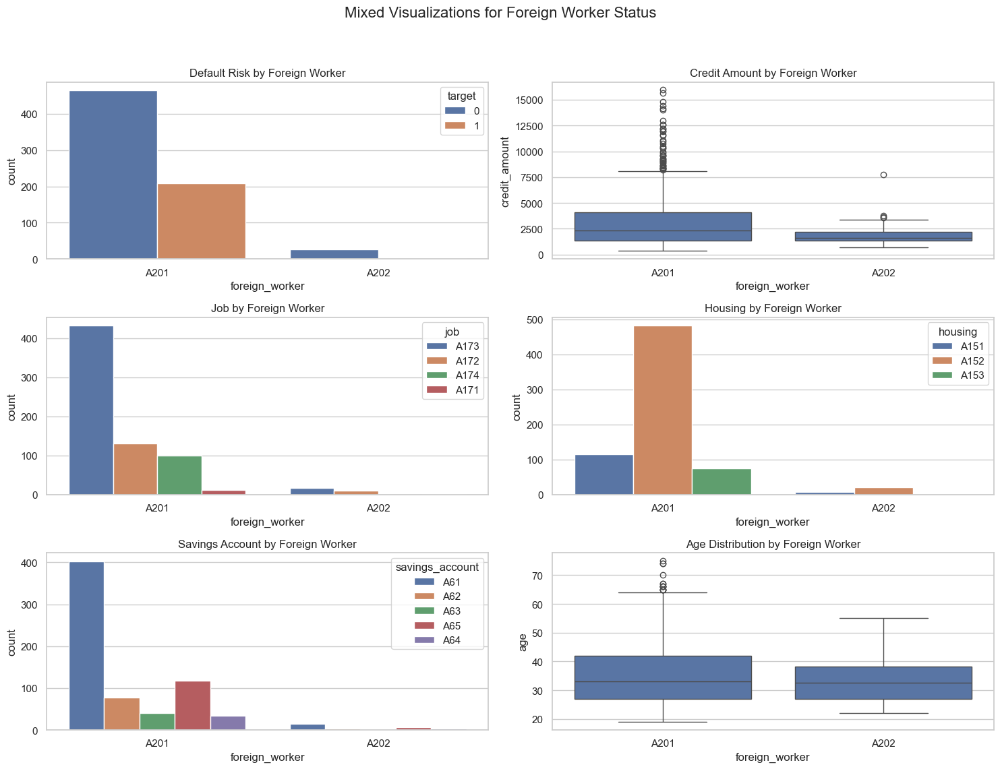

In [ ]:

# Clean up foreign_worker column (handle missing or unexpected values)
df['foreign_worker'] = df['foreign_worker'].fillna('Unknown')

# Create the subplots
fig, axs = plt.subplots(3, 2, figsize=(15, 12))
fig.suptitle('Mixed Visualizations for Foreign Worker Status', fontsize=16)

# Plot 1: Default Risk by Foreign Worker Status
sns.countplot(data=df, x='foreign_worker', hue='target', ax=axs[0, 0])
axs[0, 0].set_title('Default Risk by Foreign Worker')

# Plot 2: Credit Amount by Foreign Worker Status
sns.boxplot(data=df, x='foreign_worker', y='credit_amount', ax=axs[0, 1])
axs[0, 1].set_title('Credit Amount by Foreign Worker')

# Plot 3: Foreign Worker by Job
sns.countplot(data=df, x='foreign_worker', hue='job', ax=axs[1, 0])
axs[1, 0].set_title('Job by Foreign Worker')

# Plot 4: Foreign Worker by Housing Type
sns.countplot(data=df, x='foreign_worker', hue='housing', ax=axs[1, 1])
axs[1, 1].set_title('Housing by Foreign Worker')

# Plot 5: Foreign Worker by Savings Account
sns.countplot(data=df, x='foreign_worker', hue='savings_account', ax=axs[2, 0])
axs[2, 0].set_title('Savings Account by Foreign Worker')

# Plot 6: Age by Foreign Worker
sns.boxplot(data=df, x='foreign_worker', y='age', ax=axs[2, 1])
axs[2, 1].set_title('Age Distribution by Foreign Worker')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


----
# 🛠️ Feature Engineering

"""
Based on insights from the visualizations, we will engineer new features to enrich the dataset
and potentially improve model performance.

Feature engineering goals:
- Capture interactions between existing variables
- Normalize or simplify financial indicators
- Create binary flags for risk-related conditions

⚠️ Each new feature will be created for both:
- df (training set)
- df_test (test set)

This ensures the model receives consistent input during training and evaluation.
"""
----

### 💡 Feature: High Credit Amount Flag (Train-Based Threshold)

To identify applicants requesting unusually high loan amounts, we create a binary feature `high_credit_flag` based on the 75th percentile of `credit_amount` **calculated from the training set only**. This ensures the test set remains completely unseen. The same threshold will later be reused when generating this feature for the test set.


In [ ]:
#  Step 1: Calculate 75th percentile of credit_amount from training set
credit_amount_q3_train = df['credit_amount'].quantile(0.75)

#  Step 2: Create 'high_credit_flag' feature for training set
df['high_credit_flag'] = (df['credit_amount'] > credit_amount_q3_train).astype(int)

# Print for reference
print(f"75th percentile of credit_amount (train only): {credit_amount_q3_train}")



75th percentile of credit_amount (train only): 3974.5


In [ ]:
# Apply the same logic to test set using training quantile
df_test['high_credit_flag'] = (df_test['credit_amount'] > credit_amount_q3_train).astype(int)


### 💡 Feature: Low Liquidity Indicator

This binary feature identifies applicants with minimal liquid assets. We flag those whose `checking_account` status is either "none" or "very low" (`A14`, `A11`) **and** whose `savings_account` is also "very low" or "unknown" (`A61`, `A65`). The logic is defined using only the training set and reused for the test set without peeking.


In [ ]:
# Define what counts as "low" in each account
low_checking_values_train = ['A11', 'A14']  # little or no checking account balance
low_saving_values_train = ['A61', 'A65']   # little or unknown savings

# Create binary indicator for low liquidity
df['low_liquidity'] = (
    df['checking_account'].isin(low_checking_values_train) &
    df['savings_account'].isin(low_saving_values_train)
).astype(int)


In [ ]:
df_test['low_liquidity'] = (
    df_test['checking_account'].isin(low_checking_values_train) &
    df_test['savings_account'].isin(low_saving_values_train)
).astype(int)


### 💡 Feature: Checking Risk Profile

This binary feature flags applicants with limited liquidity (`A11` or `A14` in `checking_account`) and unstable employment (`A171` or `A172` in `job`). These applicants may represent higher credit risk due to both low cash availability and uncertain income. The feature is designed to highlight financially vulnerable profiles based on patterns observed in the data.


In [ ]:
# Define risky checking + job combinations
low_checking = ['A11', 'A14']
unstable_job = ['A171', 'A172']

# Create binary flag for potential financial instability
df['checking_risk_profile'] = (
    df['checking_account'].isin(low_checking) &
    df['job'].isin(unstable_job)
).astype(int)


In [ ]:
df_test['checking_risk_profile'] = (
    df_test['checking_account'].isin(low_checking) &
    df_test['job'].isin(unstable_job)
).astype(int)


### 🧠 Feature Engineering: Duration-Based Risk Indicators

Based on our visual and statistical analysis of loan duration, we introduce four new features that capture important risk signals:

1. **`loan_to_duration`**  
   Ratio of credit amount to loan duration. High values may indicate short-term, high-pressure borrowing.

2. **`long_duration_low_employment`**  
   Binary flag for applicants requesting long-term loans (above 75th percentile) while having unstable or short employment (unemployed or <1 year).

3. **`young_long_loan`**  
   Flags young applicants (age < 30) taking long-duration loans. This may indicate financial overextension.

4. **`short_term_high_installment`**  
   Identifies applicants with short-duration loans (below 25th percentile) and high installment rates (≥3), indicating higher monthly financial burden.

All duration thresholds are calculated based on the training set to preserve test set independence.


In [ ]:
#  Save 75th and 25th percentiles from training set
duration_q3_train = df['duration_months'].quantile(0.75)
duration_q1_train = df['duration_months'].quantile(0.25)

#  Loan-to-Duration Ratio
df['loan_to_duration'] = df['credit_amount'] / df['duration_months']
df_test['loan_to_duration'] = df_test['credit_amount'] / df_test['duration_months']

#  Long Duration + Short Employment Flag
short_employment = ['A71', 'A72']  # unemployed or <1 year
df['long_duration_low_employment'] = (
    (df['duration_months'] > duration_q3_train) &
    (df['employment_duration'].isin(short_employment))
).astype(int)

df_test['long_duration_low_employment'] = (
    (df_test['duration_months'] > duration_q3_train) &
    (df_test['employment_duration'].isin(short_employment))
).astype(int)

# Young Borrower + Long Duration
df['young_long_loan'] = (
    (df['age'] < 30) &
    (df['duration_months'] > duration_q3_train)
).astype(int)

df_test['young_long_loan'] = (
    (df_test['age'] < 30) &
    (df_test['duration_months'] > duration_q3_train)
).astype(int)

#  Short Duration + High Installment Burden
df['short_term_high_installment'] = (
    (df['duration_months'] < duration_q1_train) &
    (df['installment_rate'] >= 3)
).astype(int)

df_test['short_term_high_installment'] = (
    (df_test['duration_months'] < duration_q1_train) &
    (df_test['installment_rate'] >= 3)
).astype(int)

# Optional: Print thresholds used
print(f"75th percentile of duration (train): {duration_q3_train}")
print(f"25th percentile of duration (train): {duration_q1_train}")


75th percentile of duration (train): 24.0
25th percentile of duration (train): 12.0


### 💡 Feature: Bad Credit History Flag

This binary feature flags applicants with delayed or critical credit history (`A33` or `A34`). These categories showed higher default rates in the data and are known indicators of increased credit risk.


In [ ]:
bad_credit_categories = ['A33', 'A34']
df['bad_credit_history_flag'] = df['credit_history'].isin(bad_credit_categories).astype(int)
df_test['bad_credit_history_flag'] = df_test['credit_history'].isin(bad_credit_categories).astype(int)


### 💡 Feature: Good Credit History Flag

This binary feature identifies applicants with a strong repayment record—either all previous credits were paid back (`A31`) or current credits are being paid back on time (`A32`). These applicants represent lower credit risk and a more reliable borrowing profile.


In [ ]:
df['no_credit_history_flag'] = (df['credit_history'] == 'A30').astype(int)
df_test['no_credit_history_flag'] = (df_test['credit_history'] == 'A30').astype(int)


### 💡 Feature: Low Amount Purpose Flag

This binary feature identifies applicants requesting loans for smaller, practical needs such as repairs (`A45`), household appliances (`A44`), and retraining (`A48`). These loans tend to be lower in value and may represent lower financial exposure.

### 💡 Feature: Education Purpose Flag

This feature flags loans taken for education (`A46`) or retraining (`A48`). These applicants are often younger and may have lower current income, making this a useful signal for financial background and potential future earnings.


In [ ]:
# Low Amount Purpose Flag
low_amount_purposes = ['A44', 'A45', 'A48']
df['low_amount_purpose'] = df['purpose'].isin(low_amount_purposes).astype(int)
df_test['low_amount_purpose'] = df_test['purpose'].isin(low_amount_purposes).astype(int)

# Education-Related Purpose Flag
education_purposes = ['A46', 'A48']
df['education_purpose'] = df['purpose'].isin(education_purposes).astype(int)
df_test['education_purpose'] = df_test['purpose'].isin(education_purposes).astype(int)


### 💡 Feature: Purpose Group

This categorical feature combines individual loan purpose codes into broader, interpretable groups. The categories include:

- `consumer_goods`: car purchases and electronics (`A40`, `A41`, `A43`)
- `household`: appliances and repairs (`A44`, `A45`)
- `education`: education and retraining (`A46`, `A48`)
- `business`: business-related loans (`A49`)
- `other`: general-purpose or uncategorized loans (`A410`)
- `misc`: fallback category for uncommon or missing values

This grouping simplifies analysis and improves model interpretability by reducing noise from highly specific categories.


In [ ]:
# Grouped Loan Purpose Categories

df_test['purpose_group'] = df_test['purpose'].apply(map_purpose_group)


### 💡 Features: Credit Amount and Risk

1. **High Credit Amount Flag**  
   Flags applicants whose requested loan exceeds the 75th percentile in the training set. These applicants are exposed to higher financial commitments and may carry more risk.

2. **Unemployed with High Credit Flag**  
   Identifies applicants who are unemployed (`A71`) but still request large loans. This group may face challenges repaying without stable income.

3. **Credit to Age Ratio**  
   Captures the relationship between the loan amount and the applicant's age. A high ratio may signal overextension, particularly among younger borrowers.


In [ ]:
#  Threshold from training set (75th percentile)
credit_amount_q3_train = df['credit_amount'].quantile(0.75)

#  High Credit Amount Flag
df['high_credit_amount_flag'] = (df['credit_amount'] > credit_amount_q3_train).astype(int)
df_test['high_credit_amount_flag'] = (df_test['credit_amount'] > credit_amount_q3_train).astype(int)

#  Unemployed with High Credit Flag
df['unemployed_high_credit_flag'] = (
    (df['employment_duration'] == 'A71') &
    (df['credit_amount'] > credit_amount_q3_train)
).astype(int)

df_test['unemployed_high_credit_flag'] = (
    (df_test['employment_duration'] == 'A71') &
    (df_test['credit_amount'] > credit_amount_q3_train)
).astype(int)

#  Credit to Age Ratio
df['credit_to_age_ratio'] = df['credit_amount'] / (df['age'] + 1)
df_test['credit_to_age_ratio'] = df_test['credit_amount'] / (df_test['age'] + 1)


### 💡 Feature: Savings Account and Financial Vulnerability

 **Low Savings Flag**  
   Flags applicants with less than 100 DM in savings (`A61`), indicating limited liquidity and higher risk.


In [ ]:
df['low_savings_flag'] = (df['savings_account'] == 'A61').astype(int)
df_test['low_savings_flag'] = (df_test['savings_account'] == 'A61').astype(int)


### 💡 Feature: Installment-to-Age Ratio

This numerical feature captures how heavy the loan repayment burden is relative to the applicant’s age. A higher ratio may signal that younger applicants are taking on disproportionately large installment burdens, which can increase the risk of financial strain or default.


In [ ]:
# Feature: Installment Rate to Age Ratio
df['installment_to_age_ratio'] = df['installment_rate'] / (df['age'] + 1)
df_test['installment_to_age_ratio'] = df_test['installment_rate'] / (df_test['age'] + 1)


### 💡 Feature: Co-Debtor with Low Liquidity Flag

This binary feature identifies applicants who rely on a co-debtor (either co-applicant or guarantor) and simultaneously have low liquidity, as measured by low savings or checking account balances. This combination may signal financial fragility despite shared responsibility.


In [ ]:
#  Feature: Co-Debtor with Low Liquidity Flag
# Flags applicants who have a co-debtor AND low liquidity (low savings or checking balance)

low_savings = ['A61', 'A65']
low_checking = ['A11', 'A12']

df['co_debtor_low_liquidity_flag'] = (
    df['other_debtors'].isin(['A102', 'A103']) &
    (df['savings_account'].isin(low_savings) | df['checking_account'].isin(low_checking))
).astype(int)

df_test['co_debtor_low_liquidity_flag'] = (
    df_test['other_debtors'].isin(['A102', 'A103']) &
    (df_test['savings_account'].isin(low_savings) | df_test['checking_account'].isin(low_checking))
).astype(int)


### 💡 Feature: Young Applicant with Co-Debtor Flag

This feature flags borrowers who are below the median age and also have a co-debtor. Younger applicants may lack financial independence, and the presence of a co-debtor could indicate credit support due to limited income or credit history.


In [ ]:
#  Feature: Young Applicant with Co-Debtor Flag
# Flags applicants below the median age who also rely on a co-debtor

age_median_train = df['age'].median()

df['young_with_co_debtor'] = (
    (df['age'] < age_median_train) &
    df['other_debtors'].isin(['A102', 'A103'])
).astype(int)

df_test['young_with_co_debtor'] = (
    (df_test['age'] < age_median_train) &
    df_test['other_debtors'].isin(['A102', 'A103'])
).astype(int)


### 🏠 Engineered Features: Residence Duration and Stability

- **`stable_residence`**: Flags applicants who have lived at their current address for 7 or more years (`residence_since == 4`). Long-term residence is often a strong indicator of financial and lifestyle stability, and tends to correlate with lower default risk.

- **`short_term_residence`**: Identifies applicants who have lived at their current residence for less than 1 year (`residence_since == 1`). High mobility may suggest instability or recent financial changes, potentially increasing credit risk.

- **`residence_employment_stability`**: A compound feature that flags applicants with both stable residence (`residence_since == 4`) and long-term employment (`employment_duration` in `A74`, `A75`). These individuals exhibit dual markers of trustworthiness, which may indicate significantly lower default probability.


In [ ]:
# Feature Engineering: Residence-Based Stability Flags

# 1. Stable Residence Flag (7+ years)
df['stable_residence'] = (df['residence_since'] == 4).astype(int)
df_test['stable_residence'] = (df_test['residence_since'] == 4).astype(int)

# 2. Short-Term Mobility Flag (<1 year)
df['short_term_residence'] = (df['residence_since'] == 1).astype(int)
df_test['short_term_residence'] = (df_test['residence_since'] == 1).astype(int)

# 3. Dual Stability: Long Residence AND Long Employment
df['residence_employment_stability'] = (
    (df['residence_since'] == 4) &
    df['employment_duration'].isin(['A74', 'A75'])
).astype(int)

df_test['residence_employment_stability'] = (
    (df_test['residence_since'] == 4) &
    df_test['employment_duration'].isin(['A74', 'A75'])
).astype(int)


###  Feature Engineering: Age-Based Variables

- **`employment_duration_years`**  
  Numeric conversion of the `employment_duration` categorical feature:
  - `A71` → 0.0 (unemployed)  
  - `A72` → 0.5 (less than 1 year)  
  - `A73` → 2.5 (1–4 years)  
  - `A74` → 5.5 (4–7 years)  
  - `A75` → 8.0 (7+ years)  
  This enables calculations involving employment duration as a numeric feature.

- **`age_group`**  
  Bins applicant age into life stages:
  - `young_adult` (18–25)  
  - `adult` (26–35)  
  - `middle_age` (36–50)  
  - `senior` (51+)  
  Useful for identifying risk patterns across different age categories.

- **`is_young_borrower`**  
  Binary flag indicating applicants under 25. These borrowers may carry higher risk due to limited financial history.

- **`age_to_employment_ratio`**  
  Ratio of applicant's age to employment duration (in years). A low ratio may indicate job instability or short work history relative to age.


In [ ]:
#  Map employment_duration to numeric values (years)
employment_mapping = {
    'A71': 0.0,   # unemployed
    'A72': 0.5,   # < 1 year
    'A73': 2.5,   # 1–4 years
    'A74': 5.5,   # 4–7 years
    'A75': 8.0    # ≥ 7 years
}

# Create numeric version of employment duration
df['employment_duration_years'] = df['employment_duration'].map(employment_mapping)

#  Feature 1: Age Group Binning
df['age_group'] = pd.cut(
    df['age'],
    bins=[18, 25, 35, 50, 100],
    labels=['young_adult', 'adult', 'middle_age', 'senior']
)

#  Feature 2: Young Borrower Flag
df['is_young_borrower'] = (df['age'] < 25).astype(int)

#  Feature 3: Age-to-Employment Duration Ratio (with 0.1 fallback)
df['age_to_employment_ratio'] = df['age'] / df['employment_duration_years'].replace(0, 0.1)


df.drop(columns= ["employment_duration_years"], inplace= True)




In [ ]:

# Create numeric version of employment duration
df_test['employment_duration_years'] = df_test['employment_duration'].map(employment_mapping)

# Feature 1: Age Group Binning
df_test['age_group'] = pd.cut(
    df_test['age'],
    bins=[18, 25, 35, 50, 100],
    labels=['young_adult', 'adult', 'middle_age', 'senior']
)

# Feature 2: Young Borrower Flag
df_test['is_young_borrower'] = (df_test['age'] < 25).astype(int)

# Feature 3: Age-to-Employment Duration Ratio (fallback for div/0)
df_test['age_to_employment_ratio'] = df_test['age'] / df_test['employment_duration_years'].replace(0, 0.1)

# Drop the temporary column
df_test.drop(columns=['employment_duration_years'], inplace=True)

###  Feature: Job and Installment Risk Flag

This binary feature flags applicants who are both:
- **Unemployed or unskilled workers** (`A171`, `A172`), and
- Have a **bank-based installment plan** (`A141`)

This combination indicates elevated financial vulnerability — individuals with low or unstable income sources who also carry formal debt obligations. This group may be at greater risk of default due to limited repayment capacity.


In [ ]:
# Define the high-risk combo: bank installment + unemployed or unskilled job
high_risk_jobs = ['A171', 'A172']   # Unemployed and Unskilled
high_risk_installment = 'A141'      # Bank plan

# Create the feature for train set
df['job_installment_risk_flag'] = (
    (df['other_installment_plans'] == high_risk_installment) &
    (df['job'].isin(high_risk_jobs))
).astype(int)

# If working with a separate test set, apply the same logic:
df_test['job_installment_risk_flag'] = (
    (df_test['other_installment_plans'] == high_risk_installment) &
    (df_test['job'].isin(high_risk_jobs))
).astype(int)


###  Feature: `job_savings_risk`

This binary feature flags applicants who have both:

- A **moderate-to-risky job** type (`A172` = unskilled-resident, `A173` = skilled), **and**
- A **low liquidity profile**, indicated by little, moderate, or no savings (`A61`, `A62`, `A65`).

Such applicants may lack both income security and financial buffers, increasing their overall credit risk. This interaction captures vulnerability that may not be obvious from either variable alone.


In [ ]:
# Define low-savings categories
low_savings_categories = ['A61', 'A62', 'A65']  # little, moderate, or no savings

# Define job types considered moderate to high risk
at_risk_jobs = ['A172', 'A173']  # unskilled and skilled workers

# Create the feature in both train and test sets using pre-split df and df_test
df['job_savings_risk'] = df.apply(
    lambda row: 1 if (row['job'] in at_risk_jobs and row['savings_account'] in low_savings_categories) else 0,
    axis=1
)

df_test['job_savings_risk'] = df_test.apply(
    lambda row: 1 if (row['job'] in at_risk_jobs and row['savings_account'] in low_savings_categories) else 0,
    axis=1
)


### Feature: `foreign_residence_stability`

This feature identifies foreign applicants with short residence durations (≤1 year). These individuals may have less stable housing situations or weaker ties to the local economy, which could influence creditworthiness.

**Rationale**:
- Combines *foreign_worker* status with *residence_since* as a proxy for social and financial integration.
- Applicants flagged by this feature may be at higher risk due to lack of local history or support structures.


In [ ]:
df['foreign_residence_stability'] = ((df['foreign_worker'] == 'yes') &
                                     (df['residence_since'] <= 1)).astype(int)

df_test['foreign_residence_stability'] = ((df_test['foreign_worker'] == 'yes') &
                                     (df_test['residence_since'] <= 1)).astype(int)


------

In [ ]:
print("Train shape:", df.shape)
print("Test shape:", df_test.shape)

df.head()  # Preview engineered features
df_test.head()


Train shape: (700, 49)
Test shape: (300, 49)


,checking_account,duration_months,credit_history,purpose,credit_amount,savings_account,employment_duration,installment_rate,personal_status_sex,other_debtors,...,young_with_co_debtor,stable_residence,short_term_residence,residence_employment_stability,age_group,is_young_borrower,age_to_employment_ratio,job_installment_risk_flag,job_savings_risk,foreign_residence_stability
0,A14,48,A34,A43,3578,A65,A75,4,A93,A101,...,0,0,1,0,middle_age,0,5.875,0,1,0
1,A12,13,A34,A43,882,A61,A72,4,A93,A103,...,1,1,0,0,young_adult,1,46.000,0,1,0
2,A13,36,A32,A43,4473,A61,A75,4,A93,A101,...,0,0,0,0,adult,0,3.875,0,1,0
3,A14,30,A34,A43,2831,A61,A73,4,A92,A101,...,0,0,0,0,adult,0,13.200,0,1,0
4,A11,12,A32,A42,1289,A61,A73,4,A93,A103,...,1,0,1,0,young_adult,1,8.400,0,1,0


In [ ]:
df.to_csv("/Users/arezoo/Documents/1.MDDB/MasterProject/Code/df_train_processed.csv", index=False)
df_test.to_csv("/Users/arezoo/Documents/1.MDDB/MasterProject/Code/df_test_processed.csv", index=False)

----

### 🧩 Feature Encoding Strategy

To prepare the dataset for machine learning models, categorical features were encoded based on their type—binary, ordinal, or nominal. This ensures all variables are in a suitable numeric format for analysis and model training:

#### 🔵 Binary Encoding
Two binary features were directly mapped to numeric values:
- telephone: {'A191': 0, 'A192': 1}
- foreign_worker: {'A202': 0, 'A201': 1}

This simple mapping maintains clarity and interpretability.

#### 🟠 Ordinal Encoding
Ordinal features were encoded using custom numeric mappings that reflect their inherent order:

- checking_account:  
  A11 (<0 DM) → 0  
  A12 (0–200 DM) → 1  
  A13 (≥200 DM) → 2  
  A14 (no account) → 3

- savings_account:  
  A61 (<100 DM) → 0  
  A62 (100–500 DM) → 1  
  A63 (500–1000 DM) → 2  
  A64 (≥1000 DM) → 3  
  A65 (unknown) → 4

- employment_duration:  
  A71 (unemployed) → 0  
  A72 (<1 yr) → 1  
  A73 (1–4 yrs) → 2  
  A74 (4–7 yrs) → 3  
  A75 (≥7 yrs) → 4

#### 🟡 One-Hot Encoding
Nominal categorical features without inherent order were one-hot encoded to avoid imposing false ordinal relationships. These include:

- credit_history
- purpose
- personal_status_sex
- other_debtors
- property
- other_installment_plans
- housing
- job

To reduce dimensionality and multicollinearity, drop_first=True was used, which removes the first category of each feature during encoding.

---

This encoding strategy ensures compatibility with both linear and non-linear models while preserving interpretability and avoiding information loss.

In [ ]:
# Binary mapping
binary_mappings = {
    'telephone': {'A191': 0, 'A192': 1},
    'foreign_worker': {'A201': 1, 'A202': 0}
}
df.replace(binary_mappings, inplace=True)

# Ordinal mapping
df['checking_account'] = df['checking_account'].map({
    'A11': 0,  # < 0 DM
    'A12': 1,  # 0 - 200 DM
    'A13': 2,  # >= 200 DM
    'A14': 3   # no checking account
})

df['savings_account'] = df['savings_account'].map({
    'A61': 0,  # < 100 DM
    'A62': 1,  # 100 - 500 DM
    'A63': 2,  # 500 - 1000 DM
    'A64': 3,  # >= 1000 DM
    'A65': 4   # unknown / no account
})

df['employment_duration'] = df['employment_duration'].map({
    'A71': 0,  # unemployed
    'A72': 1,  # <1 yr
    'A73': 2,  # 1–4 yrs
    'A74': 3,  # 4–7 yrs
    'A75': 4   # >= 7 yrs
})

# One-hot encode nominal categorical variables with 0/1 output
one_hot_cols = [
    'credit_history', 'purpose', 'personal_status_sex',
    'other_debtors', 'property', 'other_installment_plans',
    'housing', 'job', 'purpose_group', 'age_group'
]

df = pd.get_dummies(df, columns=one_hot_cols, drop_first=True, dtype=int)

In [ ]:
# Binary mapping
binary_mappings = {
    'telephone': {'A191': 0, 'A192': 1},
    'foreign_worker': {'A201': 1, 'A202': 0}
}
df_test.replace(binary_mappings, inplace=True)

# Ordinal mapping
df_test['checking_account'] = df_test['checking_account'].map({
    'A11': 0,
    'A12': 1,
    'A13': 2,
    'A14': 3
})

df_test['savings_account'] = df_test['savings_account'].map({
    'A61': 0,
    'A62': 1,
    'A63': 2,
    'A64': 3,
    'A65': 4
})

df_test['employment_duration'] = df_test['employment_duration'].map({
    'A71': 0,
    'A72': 1,
    'A73': 2,
    'A74': 3,
    'A75': 4
})

# One-hot encoding — same columns, same settings
one_hot_cols = [
    'credit_history', 'purpose', 'personal_status_sex',
    'other_debtors', 'property', 'other_installment_plans',
    'housing', 'job', 'purpose_group', 'age_group'
]

# Encode test set
df_test = pd.get_dummies(df_test, columns=one_hot_cols, drop_first=True, dtype=int)

# Ensure test set has same columns as train set
missing_cols = set(df.columns) - set(df_test.columns)
for col in missing_cols:
    df_test[col] = 0  # Add missing dummy columns with 0s

# Reorder test set to match train set column order
df_test = df_test[df.columns]

In [ ]:
# Columns to scale
scale_cols = ['credit_amount', 'age', 'duration_months','loan_to_duration', 'credit_to_age_ratio', 'age_to_employment_ratio']

# Fit on training data only
scaler = MinMaxScaler()
df[scale_cols] = scaler.fit_transform(df[scale_cols])       # Train set

# Transform test data using same scaling parameters
df_test[scale_cols] = scaler.transform(df_test[scale_cols])  # Test set

### 📊 Correlation Analysis Introduction

Before model training, it is essential to explore the relationships between features in the dataset. One effective way to do this is through a **correlation matrix**, which measures the strength and direction of linear relationships between numerical variables.

By visualizing this matrix as a **heatmap**, we can:
- Detect **multicollinearity** (features that are too similar),
- Identify potentially **redundant variables**, and
- Highlight features that have a **moderate or strong correlation with the target**.

This step supports **better feature selection**, especially when using linear models like Logistic Regression or when aiming for clearer interpretability through SHAP later in the pipeline.

/var/folders/yb/y19kkw691dxc3nxmdmnqpqgr0000gn/T/ipykernel_39920/637295863.py:17: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from current font.
  plt.tight_layout()
/Users/arezoo/anaconda3/envs/AI/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


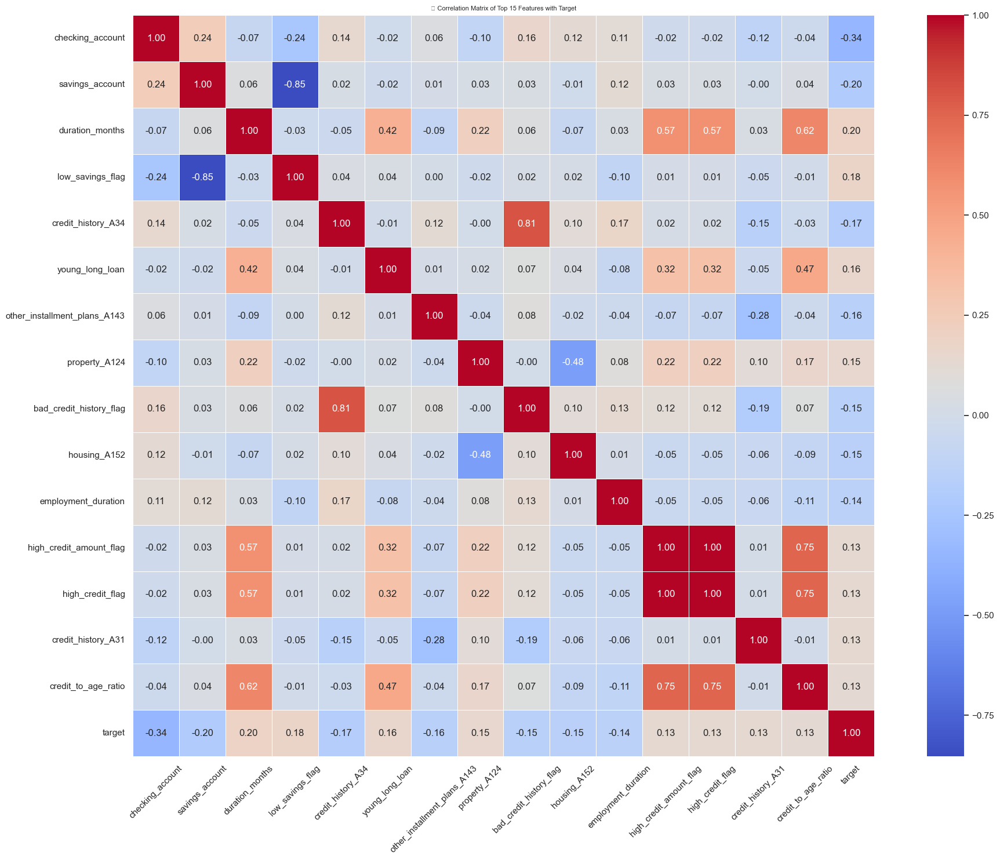

In [ ]:
#  Compute correlations with target (excluding 'target' itself)
target_corr = df.corr()['target'].drop('target')

#  Select top 15 features (by absolute correlation with target)
top_features = target_corr.abs().sort_values(ascending=False).head(15).index.tolist()
top_features.append('target')  # Include target for full matrix

#  Subset the dataframe to include only these features
top_corr_matrix = df[top_features].corr()

#  Plot heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(top_corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5)
plt.title("🔗 Correlation Matrix of Top 15 Features with Target", fontsize=8)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


### 🧹 Feature Engineering via Correlation Filtering

The correlation heatmap allowed us to identify and interpret the strongest relationships between features and the target variable. As part of the feature engineering process, we performed **correlation-based feature reduction** to eliminate redundancy and improve model performance.

This approach is especially valuable for:
- **Reducing multicollinearity** in linear models like Logistic Regression,
- Enhancing interpretability in tools like SHAP, and
- Simplifying the dataset without significant loss of information.

Features with an absolute correlation coefficient greater than **0.85** were flagged as highly redundant. From each correlated pair, we removed the less interpretable or less essential feature to streamline the model. This preprocessing step ensures consistency across both training and test sets.

----

### Feature Reduction via Correlation Filtering

To prevent issues related to multicollinearity, especially in linear models like Logistic Regression and when interpreting model outputs using SHAP, we identified and removed highly correlated features.

- We computed the absolute correlation matrix and focused on the upper triangle to avoid duplicate pair comparisons.
- Features with a correlation coefficient greater than 0.85 were considered highly redundant.
- From each correlated pair, one feature was dropped — typically the less interpretable or more complex one.
- This step helps:
  - Improve model stability in Logistic Regression
  - Reduce noise in SHAP explanations
  - Prevent overfitting caused by redundant signals

The same columns were dropped from both the training and test sets to maintain consistency across the pipeline.

In [ ]:
# 1. Compute absolute correlation matrix
corr_matrix = df.corr().abs()

# 2. Keep only the upper triangle (to avoid duplicate pairs)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# 3. Identify columns with correlation > 0.85
to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]

# 4. Drop those columns
df_reduced = df.drop(columns=to_drop)
df_test_reduced = df_test.drop(columns=to_drop)

# Print what was removed
print("Dropped due to high correlation:", to_drop)

Dropped due to high correlation: ['high_credit_amount_flag', 'credit_to_age_ratio', 'low_savings_flag', 'stable_residence', 'purpose_A46', 'purpose_group_education', 'purpose_group_household', 'purpose_group_misc', 'purpose_group_other']


----

### 🧪 Model Training, Hyperparameter Tuning, and Evaluation

In this section, we trained and evaluated three machine learning models to predict credit default risk:

- **Logistic Regression**: a linear model sensitive to feature scaling and multicollinearity.
- **Random Forest**: a tree-based ensemble model, robust to outliers and feature interactions.
- **XGBoost**: a gradient boosting model known for high accuracy and flexibility.

The full training process included:
1. **Library imports** and dataset preparation (`X`, `y`, `X_test`, `y_test`).
2. **Hyperparameter tuning** using `GridSearchCV` with 5-fold cross-validation to select the best model configuration for each algorithm.
3. **Model evaluation** on the test set using metrics such as **accuracy**, **precision**, **recall**, **F1 score**, and **ROC AUC**.

This comprehensive evaluation allowed us to compare model performance and determine which algorithm is most suitable for SHAP-based explainability in the next step.

In [ ]:
import shap
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, roc_curve, classification_report
)



import warnings
warnings.filterwarnings("ignore")

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
# Separate X and y
X = df_reduced.drop(columns=['target'])
y = df_reduced['target']

X_test = df_test_reduced.drop(columns=['target'])
y_test = df_test_reduced['target']

In [ ]:
# Logistic Regression
log_reg = LogisticRegression(solver='liblinear')
log_reg_params = {
    'C': [0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2']
}

# Random Forest
rf = RandomForestClassifier(random_state=42)
rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [4, 6, 10],
    'min_samples_split': [2, 5]
}

# XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_params = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2]
}

# Neural Network (MLPClassifier)
mlp = MLPClassifier(max_iter=500, random_state=42)
mlp_params = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['relu', 'tanh'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant', 'adaptive']
}

In [ ]:
# GridSearchCV setup
log_cv = GridSearchCV(log_reg, log_reg_params, cv=5, scoring='roc_auc')
rf_cv = GridSearchCV(rf, rf_params, cv=5, scoring='roc_auc')
xgb_cv = GridSearchCV(xgb, xgb_params, cv=5, scoring='roc_auc')
mlp_cv = GridSearchCV(mlp, mlp_params, cv=5, scoring='roc_auc')

# Fit all models
log_cv.fit(X, y)
rf_cv.fit(X, y)
xgb_cv.fit(X, y)
mlp_cv.fit(X, y)

# Function to print best params and scores
def print_best_params(name, gridcv):
    print(f"\n Best Parameters for {name}:")
    for param, val in gridcv.best_params_.items():
        print(f"  - {param}: {val}")
    print(f"🔍 Best Cross-Validated ROC AUC Score: {gridcv.best_score_:.3f}")

# Print all results
print_best_params("Logistic Regression", log_cv)
print_best_params("Random Forest", rf_cv)
print_best_params("XGBoost", xgb_cv)
print_best_params("Neural Network", mlp_cv)


 Best Parameters for Logistic Regression:
  - C: 0.1
  - penalty: l2
🔍 Best Cross-Validated ROC AUC Score: 0.774

 Best Parameters for Random Forest:
  - max_depth: 10
  - min_samples_split: 2
  - n_estimators: 100
🔍 Best Cross-Validated ROC AUC Score: 0.777

 Best Parameters for XGBoost:
  - learning_rate: 0.01
  - max_depth: 3
  - n_estimators: 200
🔍 Best Cross-Validated ROC AUC Score: 0.759

 Best Parameters for Neural Network:
  - activation: relu
  - alpha: 0.001
  - hidden_layer_sizes: (100,)
  - learning_rate: constant
🔍 Best Cross-Validated ROC AUC Score: 0.728


### 📊 Why Logistic Regression Performs Competitively

Despite being a linear model, Logistic Regression (LR) achieved a cross-validated ROC AUC score comparable to more advanced models such as Random Forest and XGBoost. This outcome can be explained by several factors specific to this project:

- **Structured, Tabular Dataset**: The German Credit dataset is relatively small and clean, with well-defined categorical and ordinal features. Logistic Regression often excels on such datasets, particularly when relationships are mostly linear or monotonic.

- **Strong Feature Engineering**: The engineered features in this study (e.g., `installment_to_age_ratio`, `stable_residence`, `job_savings_risk`) capture key financial risk patterns, enabling even simple models to make meaningful predictions without needing to learn complex non-linear interactions.

- **Effective Regularization**: With L2 regularization (`penalty='l2'`) and an optimal value of the regularization parameter `C`, the LR model avoids overfitting and generalizes well — especially important for small datasets.

- **Robust to Class Imbalance**: Since model evaluation was based on ROC AUC (a threshold-independent metric), LR's probabilistic output allowed for stable ranking performance even in the presence of imbalanced target classes.

- **Clean Feature Set**: Redundant and collinear features were removed through correlation filtering, which benefits Logistic Regression significantly by reducing multicollinearity and enhancing interpretability.

Overall, the strong performance of Logistic Regression supports the thesis objective: that interpretable models, when combined with thoughtful feature engineering, can be viable and transparent alternatives in regulated domains such as credit risk assessment.


---

## 📊 Model Performance Comparison

In this section, we evaluate and compare the performance of four models trained for credit risk prediction:

- Logistic Regression
- Random Forest
- XGBoost
- Neural Network (MLP)

Each model was assessed using the following metrics on the test set:

- **Accuracy**: Overall correctness of the model.
- **Precision**: How many predicted defaults were actual defaults.
- **Recall**: How many actual defaults were correctly identified.
- **F1 Score**: Harmonic mean of precision and recall.
- **ROC AUC**: Ability of the model to distinguish between classes across thresholds.

We also visualize:

- **ROC Curves** for all models in a single plot.
- **Confusion Matrices** for each model to show the balance of predicted vs. actual classes.

This evaluation helps in understanding both predictive performance and trade-offs between sensitivity and specificity, which are critical in credit scoring applications.



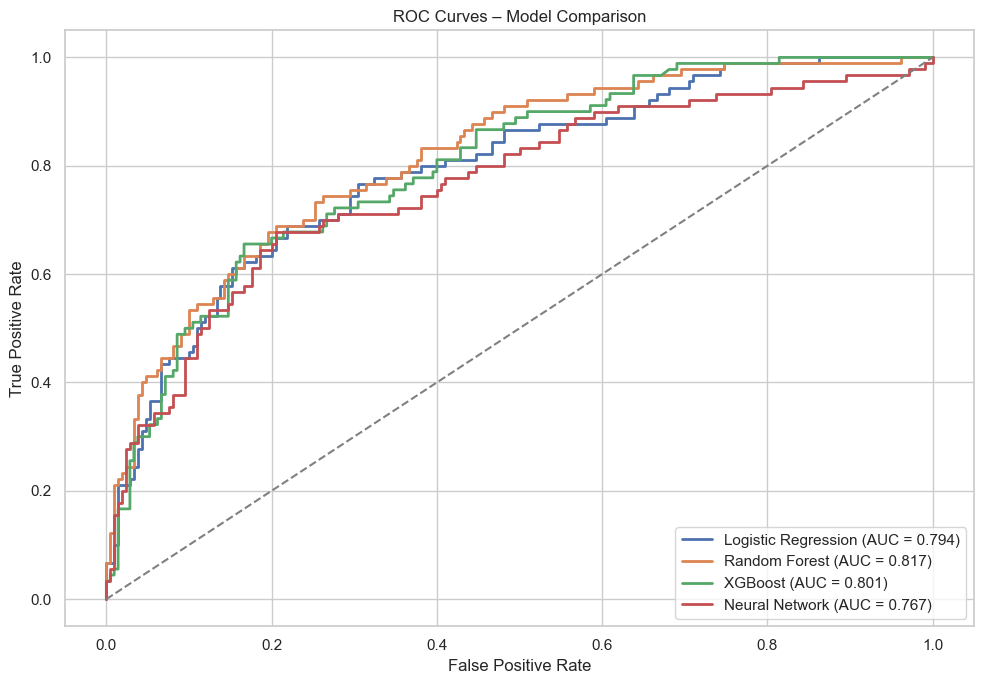

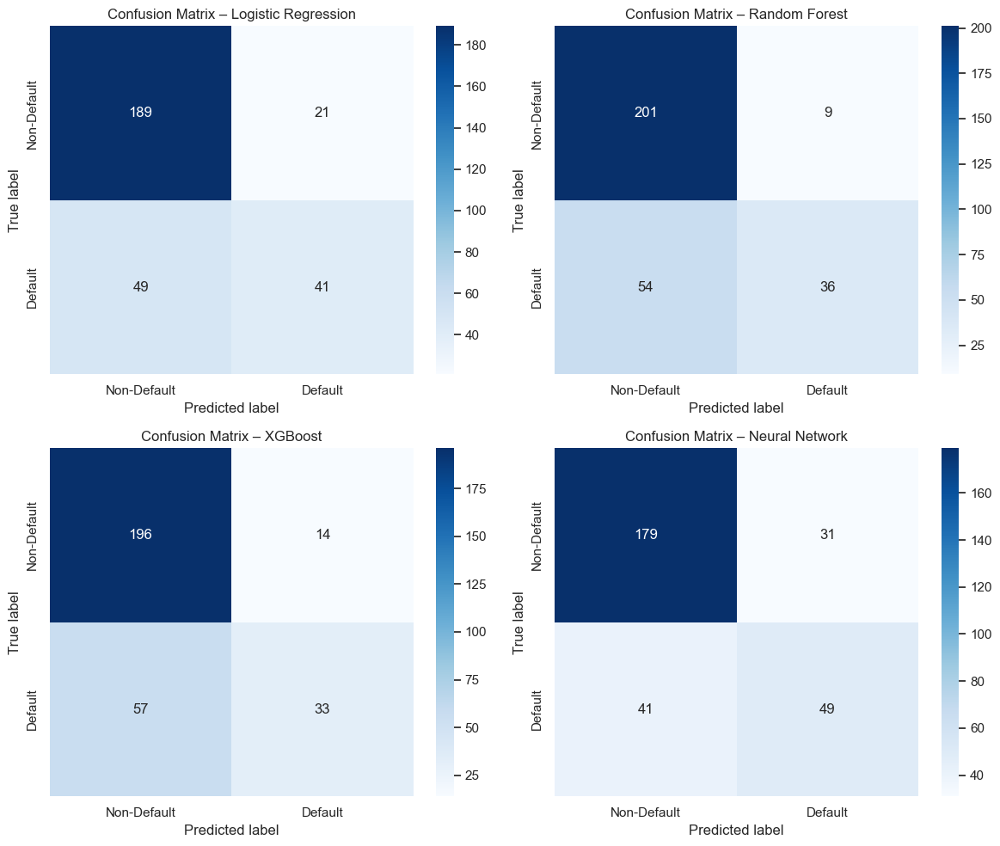

,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,Logistic Regression,0.766667,0.661290,0.455556,0.539474,0.793810
1,Random Forest,0.790000,0.800000,0.400000,0.533333,0.816825
2,XGBoost,0.763333,0.702128,0.366667,0.481752,0.800847
3,Neural Network,0.760000,0.612500,0.544444,0.576471,0.766561


In [ ]:


# Best models from GridSearchCV
models = {
    "Logistic Regression": log_cv.best_estimator_,
    "Random Forest": rf_cv.best_estimator_,
    "XGBoost": xgb_cv.best_estimator_,
    "Neural Network": mlp_cv.best_estimator_
}

results = []

# ROC Comparison Plot
plt.figure(figsize=(10, 7))

for name, model in models.items():
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test)

    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)

    results.append({
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1 Score": f1,
        "ROC AUC": auc
    })

    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.plot(fpr, tpr, lw=2, label=f"{name} (AUC = {auc:.3f})")

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("ROC Curves – Model Comparison")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# Combined Confusion Matrices (2x2 grid)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, (name, model) in zip(axes.flatten(), models.items()):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=["Non-Default", "Default"],
                yticklabels=["Non-Default", "Default"])
    ax.set_title(f"Confusion Matrix – {name}")
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")

plt.tight_layout()
plt.show()

# Summary metrics table
df_results = pd.DataFrame(results)
display(df_results)


### 🔍 Summary of Model Performance

- ✅ **Random Forest** achieved the highest **ROC AUC** (0.817), indicating the strongest overall discriminatory power.
- 🔁 **Neural Network** had the **highest recall** (0.544), making it more sensitive to identifying default cases, though with a trade-off in precision.
- ⚖️ **Logistic Regression** offered a good balance of **interpretability and performance**, with stable metrics across all scores.
- 📉 **XGBoost** performed slightly below Random Forest in terms of AUC (0.801) but showed better precision than Neural Network.

These results suggest that while Random Forest provides the best overall performance, model selection should also consider the explainability and fairness requirements defined in the project’s objectives.


----

------

### 🔎 Model Explainability with SHAP

To interpret the predictions of complex machine learning models, we used **SHAP (SHapley Additive exPlanations)** — a model-agnostic method that explains individual predictions by assigning each feature an importance value.

SHAP is grounded in game theory and provides two major advantages:
- **Global interpretability**: Understand which features drive the overall model decisions.
- **Local interpretability**: Explain individual predictions (e.g., why a specific customer is flagged as high-risk).

For this analysis, SHAP was applied to our best-performing model — **Random Forest** — to visualize:
- The **overall feature importance**, ranked by average impact.
- The **direction** and **magnitude** of each feature's effect on the predicted probability of default.

These insights help bridge the gap between model performance and trust, making the results more transparent and actionable for stakeholders in digital lending.


🔍 SHAP Analysis for Logistic Regression


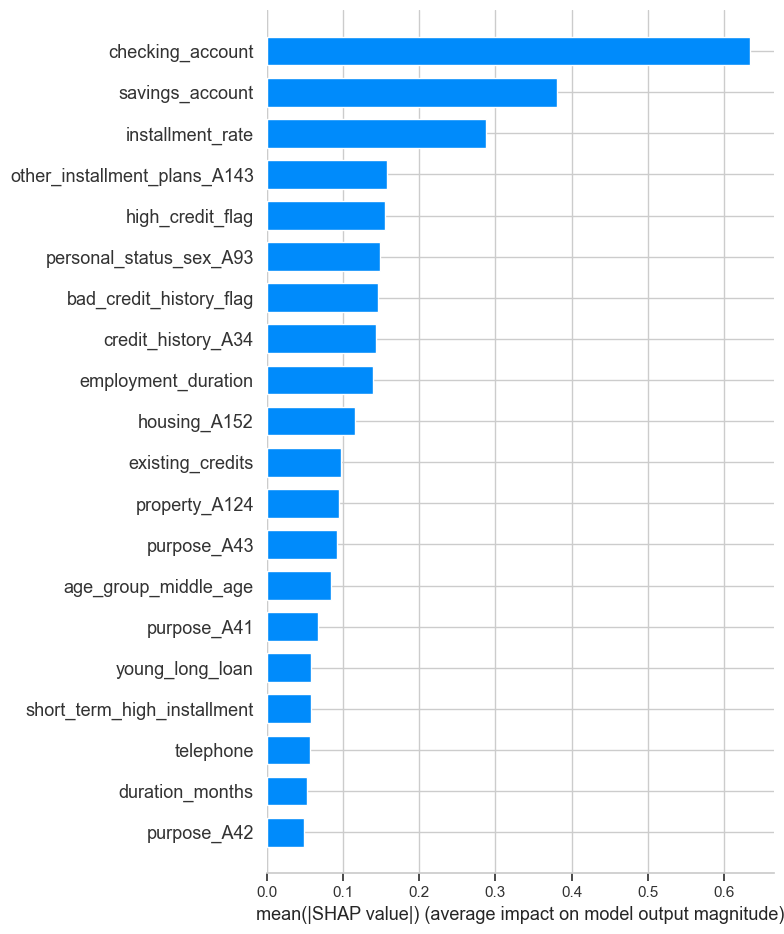

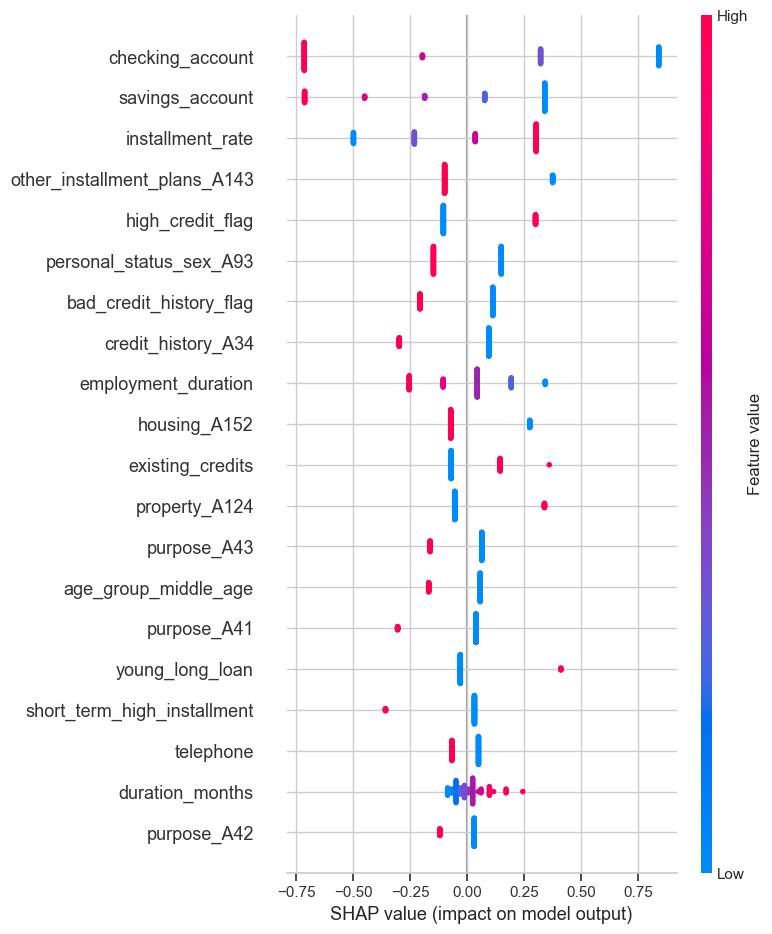


🔍 SHAP Analysis for Random Forest


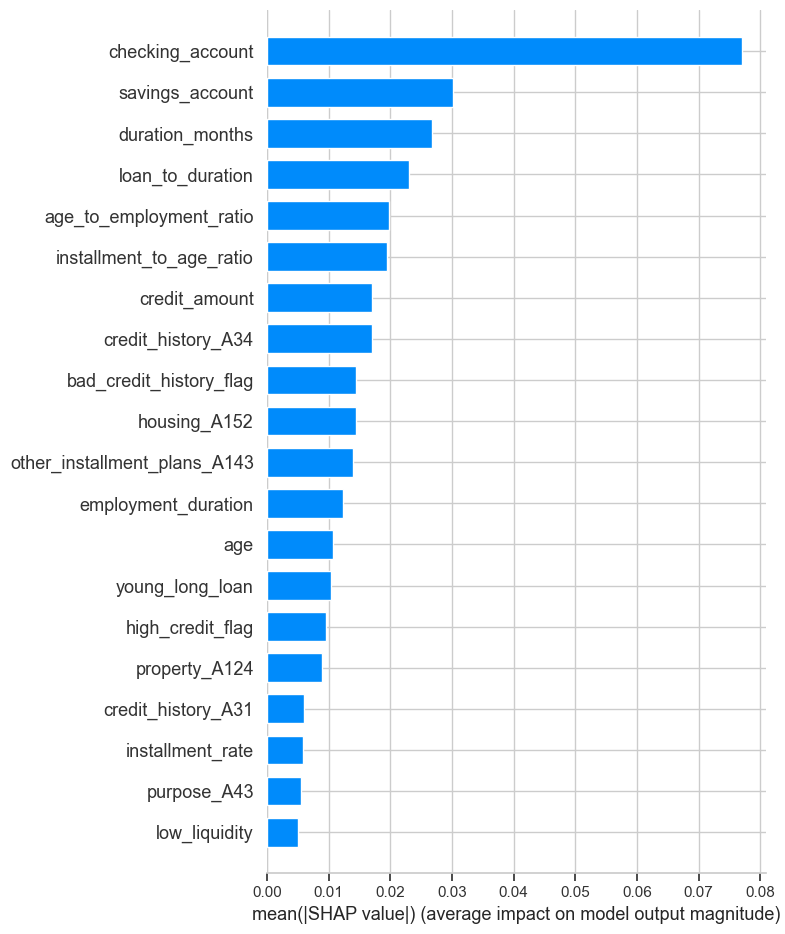

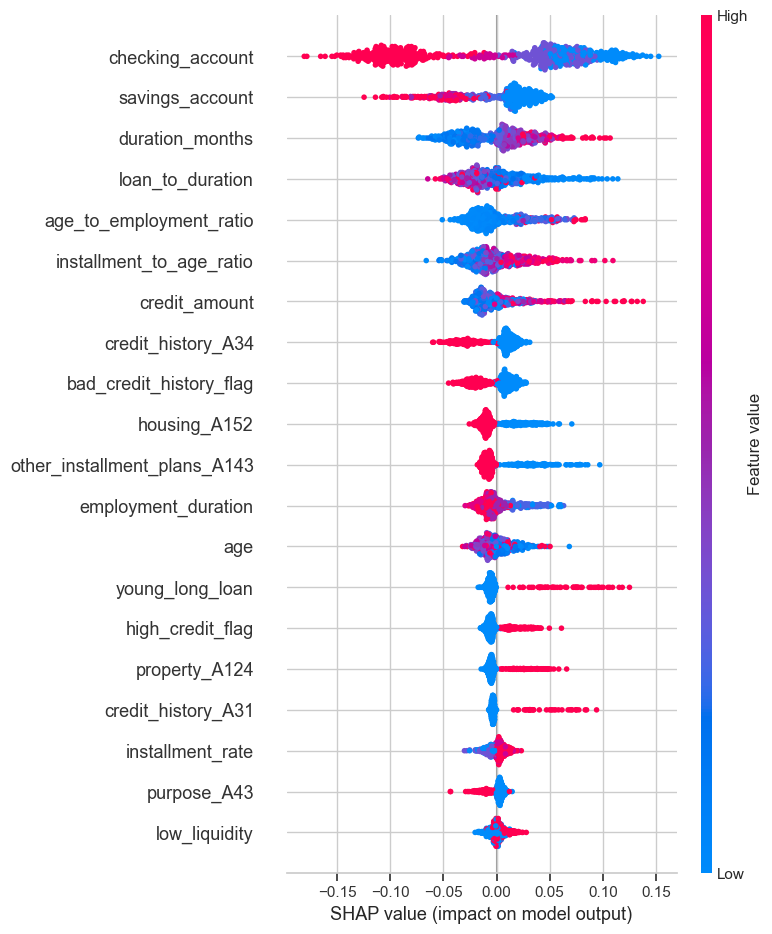


🔍 SHAP Analysis for XGBoost


  0%|          | 0/100 [00:00<?, ?it/s]

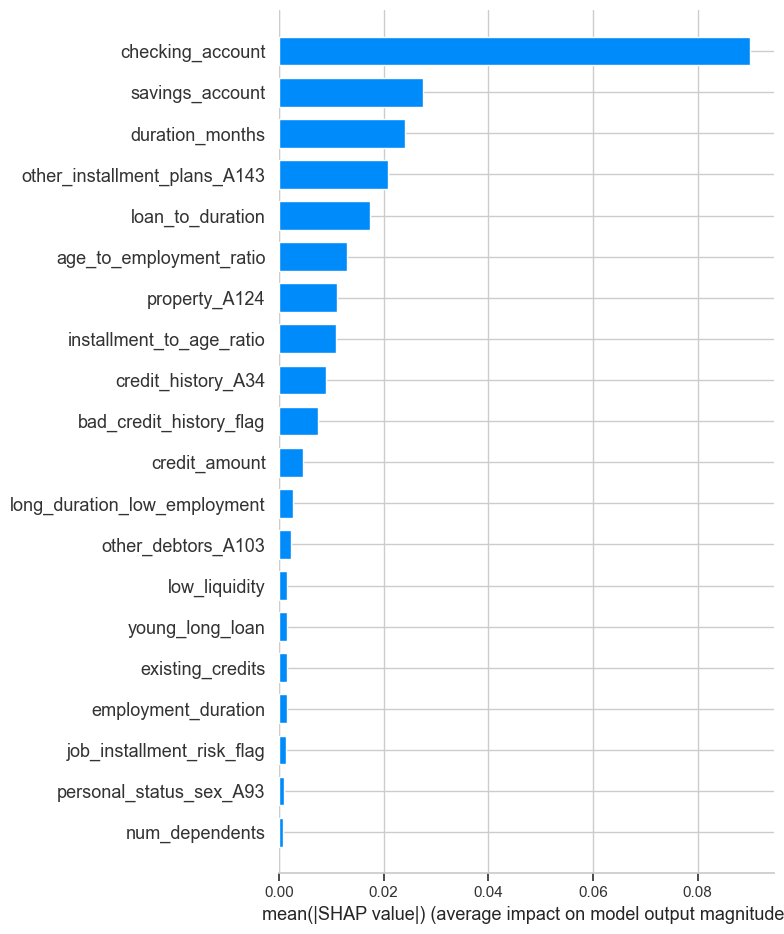

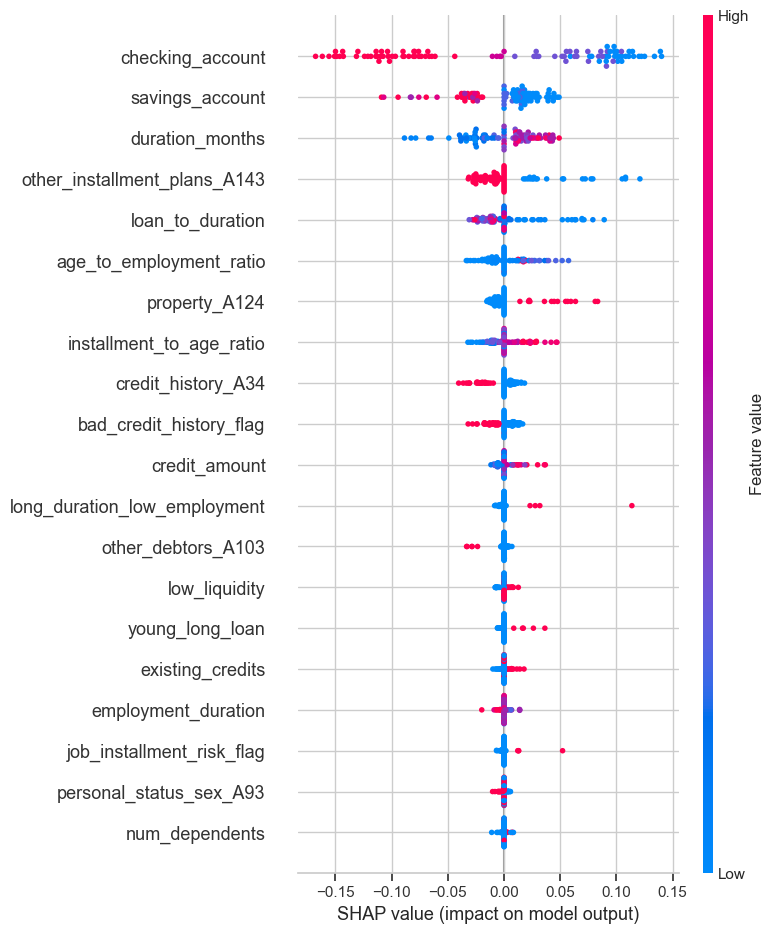


🔍 SHAP Analysis for Neural Network


  0%|          | 0/100 [00:00<?, ?it/s]

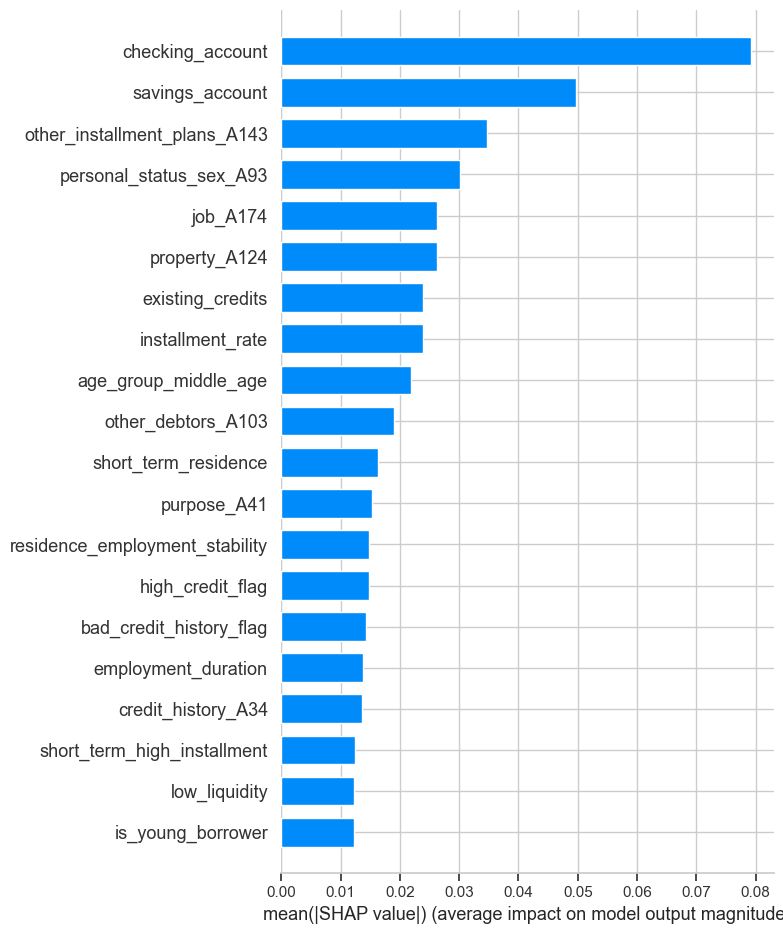

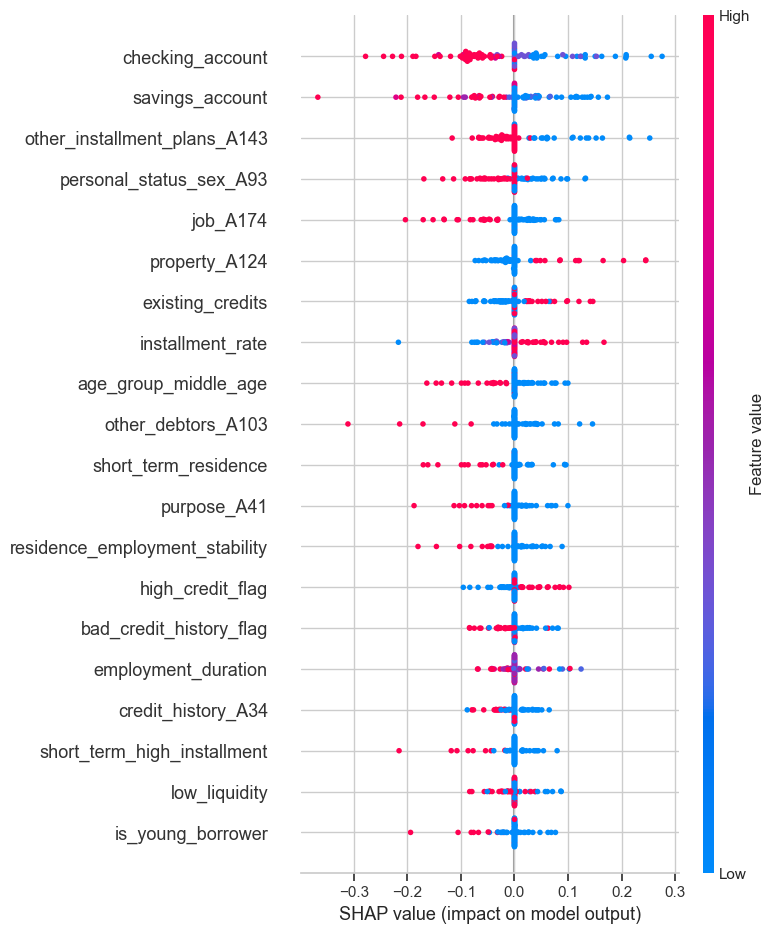

In [ ]:
# SHAP for All Models

# reduce the sample size for SHAP on slower models
sample_X = X.sample(100, random_state=42) if X.shape[0] > 100 else X

# Store best models
best_models = {
    "Logistic Regression": log_cv.best_estimator_,
    "Random Forest": rf_cv.best_estimator_,
    "XGBoost": xgb_cv.best_estimator_,
    "Neural Network": mlp_cv.best_estimator_
}

# SHAP visualizations for each model
for name, model in best_models.items():
    print(f"\n🔍 SHAP Analysis for {name}")

    try:
        if name == "Random Forest":
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X)
            shap.summary_plot(shap_values[1], X, plot_type="bar")
            shap.summary_plot(shap_values[1], X)

        elif name == "XGBoost":
            # Wrap model in a callable for SHAP KernelExplainer
            explainer = shap.KernelExplainer(
               lambda data: model.predict_proba(data)[:, 1],
                sample_X
            )
            shap_values = explainer.shap_values(sample_X, nsamples=100)
            shap.summary_plot(shap_values, sample_X, plot_type="bar")
            shap.summary_plot(shap_values, sample_X)


        elif name == "Logistic Regression":
            explainer = shap.LinearExplainer(model, sample_X)
            shap_values = explainer.shap_values(sample_X)
            shap.summary_plot(shap_values, sample_X, plot_type="bar")
            shap.summary_plot(shap_values, sample_X)

        elif name == "Neural Network":
            explainer = shap.KernelExplainer(model.predict_proba, sample_X)
            shap_values = explainer.shap_values(sample_X, nsamples=100)
            shap.summary_plot(shap_values[1], sample_X, plot_type="bar")
            shap.summary_plot(shap_values[1], sample_X)

    except Exception as e:
        print(f"⚠️ Could not compute SHAP for {name}: {e}")


## 🔍 SHAP-Based Feature Importance Comparison

To evaluate model interpretability, SHAP (SHapley Additive exPlanations) was applied to the best estimators of all four trained models. The resulting bar plots illustrate the mean absolute SHAP values, reflecting each feature’s average contribution to predicting credit default risk.

### Key Observations:
- **Checking and savings account** consistently ranked as the most influential features across all models, underscoring their role in assessing liquidity and financial reliability.
- **Installment-related** indicators and **credit history flags** appeared among the top contributors, confirming their relevance in traditional credit risk models.
- **XGBoost** and **Random Forest** captured more nuanced engineered features such as `loan_to_duration` and `age_to_employment_ratio`, highlighting their capacity to model non-linear interactions.
- The **Neural Network** demonstrated sensitivity to features like `residence_employment_stability` and `short_term_residence`, which were not as dominant in simpler models.
- Despite its linear nature, **Logistic Regression** focused sharply on a small set of highly discriminative features, particularly `checking_account`.

This comparative visualization reinforces the value of employing a diverse set of models and XAI tools. By examining both overlapping and divergent patterns of feature importance, practitioners can derive more reliable and transparent insights into credit decision-making.

_These insights directly contribute to the explainability objectives outlined in the proposed XAI framework and support its integration into credit scoring workflows._


##  SHAP Beeswarm Comparison: Feature Influence Across Models

To complement the bar plots of mean feature impact, SHAP beeswarm plots offer a richer view of how individual feature values affect predictions across instances. These plots visualize the **direction** and **magnitude** of each feature's contribution, as well as how **feature values** relate to SHAP impact (e.g., red for high values, blue for low).

### Observations:

- **Logistic Regression** displays clear linear separability. Features like `checking_account`, `savings_account`, and `installment_rate` consistently push predictions toward non-default when their values are favorable.
- **Random Forest** captures non-linear interactions. Features such as `loan_to_duration` and `age_to_employment_ratio` show varied effects across instances, reflecting flexible thresholds.
- **XGBoost** demonstrates sharper thresholds with high SHAP concentration for top features. Its compact structure yields strong directional separations for engineered features like `other_installment_plans_A143` and `credit_history_A34`.
- **Neural Network** yields smooth, distributed contributions across a broader set of features. It captures deeper patterns, though at the cost of slightly reduced transparency.

By comparing these plots side by side, we gain a nuanced understanding of how each model leverages the data — reinforcing the value of XAI in regulated credit assessment contexts.


------
------

## ⚙️ SHAP-Based Feature Selection and Model-Specific Evaluation

This section presents a tailored SHAP (SHapley Additive exPlanations) feature selection and evaluation pipeline applied **per model**. Each model type—Logistic Regression, Random Forest, XGBoost, and Neural Network—has its own architecture and assumptions, so we use the most suitable SHAP explainer for each:

- `LinearExplainer` for Logistic Regression (linear model),
- `TreeExplainer` for Random Forest,
- `KernelExplainer` for XGBoost and Neural Network (black-box models).

### 🔎 Feature Selection Method
For each model, we:
1. Compute SHAP values to capture feature importance.
2. Rank features by their average absolute SHAP contribution.
3. Select only the top features that **cumulatively contribute to 95% of the total SHAP importance**, ensuring interpretability while retaining the most influential variables.

### 🧪 Evaluation Strategy
After feature selection:
- Models are **retrained using only their selected SHAP-based features**.
- Performance is evaluated on a separate test set using:
  - **ROC AUC score** (discriminatory power),
  - **Accuracy, Precision, Recall, F1 Score** (classification effectiveness),
  - **ROC curves and confusion matrices** (visual insight into performance).

This customized SHAP-based feature selection approach respects the unique structure of each model and supports transparent credit risk modeling aligned with explainability goals in regulated domains like banking.



🚀 Processing Logistic Regression...
📌 Selected 33 features for Logistic Regression

🚀 Processing Random Forest...
📌 Selected 43 features for Random Forest

🚀 Processing XGBoost...


  0%|          | 0/100 [00:00<?, ?it/s]

📌 Selected 20 features for XGBoost

🚀 Processing Neural Network...


  0%|          | 0/100 [00:00<?, ?it/s]

📌 Selected 51 features for Neural Network


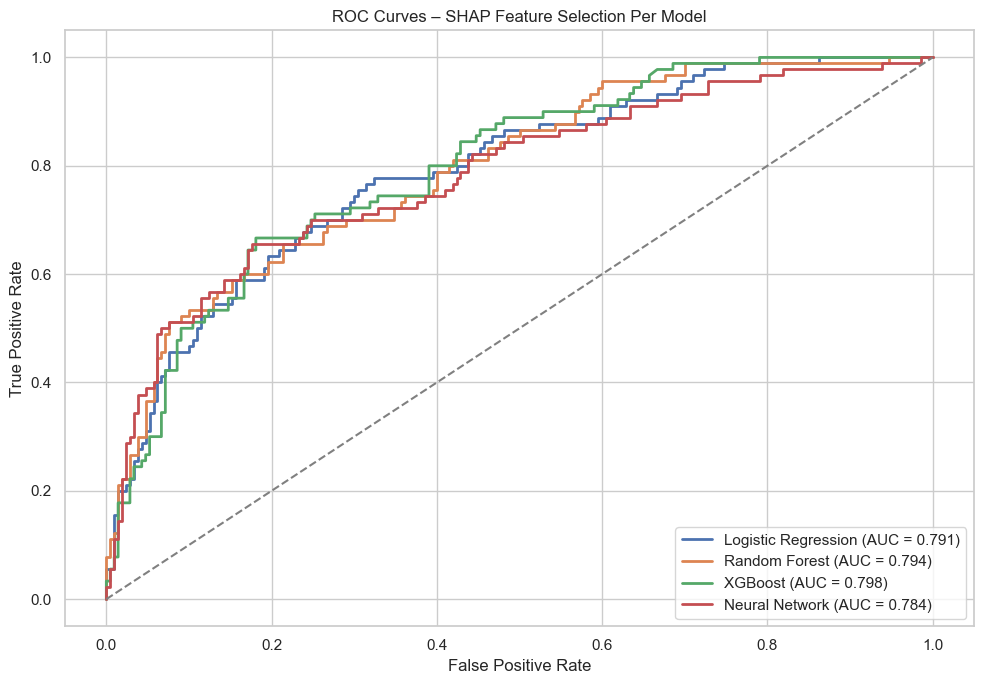

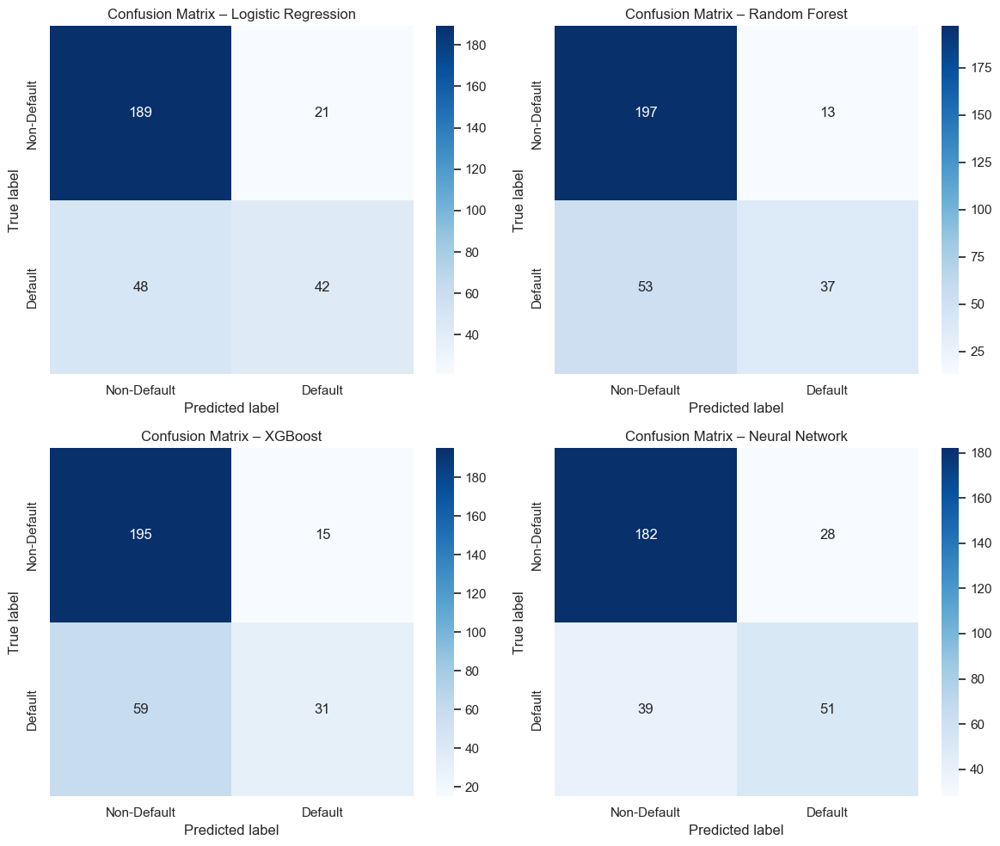

,Model,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,Logistic Regression,0.770000,0.666667,0.466667,0.549020,0.791323
1,Random Forest,0.780000,0.740000,0.411111,0.528571,0.793915
2,XGBoost,0.753333,0.673913,0.344444,0.455882,0.797672
3,Neural Network,0.776667,0.645570,0.566667,0.603550,0.783915


In [ ]:
# SHAP Feature-Based Selection & Evaluation (Per Model)


# ---- Setup models and SHAP types ----
model_configs = {
    "Logistic Regression": {
        "model": LogisticRegression,
        "params": log_cv.best_params_,
        "shap_type": "linear"
    },
    "Random Forest": {
        "model": RandomForestClassifier,
        "params": rf_cv.best_params_,
        "shap_type": "tree"
    },
    "XGBoost": {
        "model": XGBClassifier,
        "params": xgb_cv.best_params_,
        "shap_type": "kernel"
    },
    "Neural Network": {
        "model": MLPClassifier,
        "params": mlp_cv.best_params_,
        "shap_type": "kernel"
    }
}

results = []
roc_curves = []
confusion_matrices = []

for name, config in model_configs.items():
    print(f"\n🚀 Processing {name}...")
    model = config["model"](**config["params"])
    model.fit(X, y)

    # Select SHAP explainer
    if config["shap_type"] == "tree":
        explainer = shap.TreeExplainer(model)
        shap_values = explainer.shap_values(X)
        shap_vals = shap_values[1] if isinstance(shap_values, list) else shap_values

    elif config["shap_type"] == "linear":
        explainer = shap.LinearExplainer(model, X)
        shap_vals = explainer.shap_values(X)

    elif config["shap_type"] == "kernel":
        background = X.sample(100, random_state=42) if X.shape[0] > 100 else X
        explainer = shap.KernelExplainer(lambda d: model.predict_proba(d)[:, 1], background)
        shap_vals = explainer.shap_values(background, nsamples=100)

    # ---- SHAP Feature Selection ----
    shap_importance = np.abs(shap_vals).mean(axis=0)
    shap_df = pd.DataFrame({
        'feature': X.columns,
        'importance': shap_importance
    }).sort_values(by='importance', ascending=False)
    shap_df['cumulative'] = shap_df['importance'].cumsum() / shap_df['importance'].sum()
    selected_features = shap_df[shap_df['cumulative'] <= 0.95]['feature'].tolist()

    print(f"📌 Selected {len(selected_features)} features for {name}")

    # Filter data
    X_train_reduced = X[selected_features]
    X_test_reduced = X_test[selected_features]

    # Retrain and evaluate
    model.fit(X_train_reduced, y)
    y_pred = model.predict(X_test_reduced)
    y_proba = model.predict_proba(X_test_reduced)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test_reduced)

    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    fpr, tpr, _ = roc_curve(y_test, y_proba)

    results.append({
        "Model": name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1 Score": f1,
        "ROC AUC": auc
    })

    roc_curves.append((fpr, tpr, name, auc))
    confusion_matrices.append((confusion_matrix(y_test, y_pred), name))

# ---- ROC Curves ----
plt.figure(figsize=(10, 7))
for fpr, tpr, name, auc in roc_curves:
    plt.plot(fpr, tpr, lw=2, label=f"{name} (AUC = {auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title("ROC Curves – SHAP Feature Selection Per Model")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

# ---- Confusion Matrices ----
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
for ax, (cm, name) in zip(axes.flatten(), confusion_matrices):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=["Non-Default", "Default"],
                yticklabels=["Non-Default", "Default"])
    ax.set_title(f"Confusion Matrix – {name}")
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")
plt.tight_layout()
plt.show()

# ---- Summary Table ----
df_results = pd.DataFrame(results)
display(df_results)


-----
-----

### 🔍 Trade-off Between Model Performance and Explainability

This visualization illustrates the relationship between **model performance** (measured by ROC AUC score) and **explainability** (proxied by the number of features selected via SHAP) for four classification models used in credit risk assessment:

- Logistic Regression  
- Random Forest  
- XGBoost  
- Neural Network  

The number of features selected reflects model complexity — **fewer features** typically indicate **greater transparency and ease of explanation**, which is critical in regulated sectors like banking.


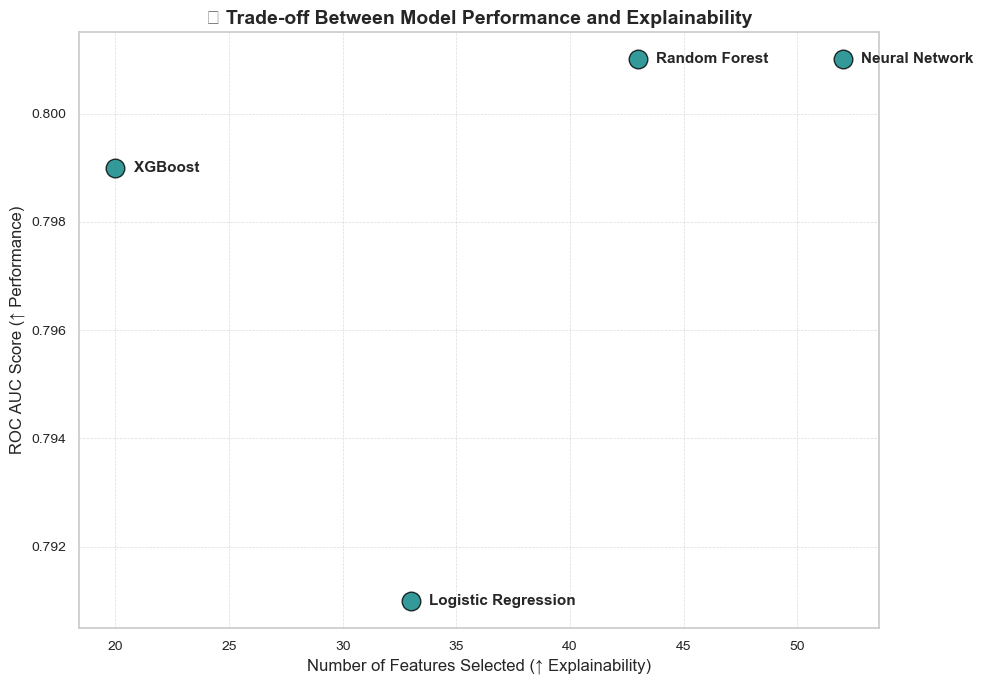

In [ ]:

# Model data
models = ['Logistic Regression', 'Random Forest', 'XGBoost', 'Neural Network']
features = [33, 43, 20, 52]  # SHAP-selected features (proxy for explainability)
roc_auc = [0.791, 0.801, 0.799, 0.801]  # Performance (ROC AUC)

# Plot
plt.figure(figsize=(10, 7))
plt.scatter(features, roc_auc, color='teal', s=180, edgecolors='black', alpha=0.8)

# Add model labels
for i, model in enumerate(models):
    plt.text(features[i] + 0.8, roc_auc[i], model,
             fontsize=11, weight='bold', verticalalignment='center')

# Axes and styling
plt.title("📊 Trade-off Between Model Performance and Explainability", fontsize=14, weight='bold')
plt.xlabel("Number of Features Selected (↑ Explainability)", fontsize=12)
plt.ylabel("ROC AUC Score (↑ Performance)", fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()



### 📌 **Conclusion**

This plot helps demonstrate the trade-off explored in *Sub-question 4* of the thesis. It shows that:

- **XGBoost** achieves **strong performance (AUC = 0.799)** with the **lowest number of features (20)**, offering the best balance between performance and interpretability.
- **Neural Networks** and **Random Forests** show the **highest AUC (0.801)** but with significantly **higher feature complexity (52 and 43 features)**, which may pose challenges for explainability and stakeholder trust.
- **Logistic Regression** is more interpretable than most but offers **slightly lower predictive performance**.

🧠 **Implication:** In contexts where transparency is as critical as accuracy — such as credit decisioning in incumbent banks — **XGBoost presents itself as a favorable compromise**, whereas black-box models may require additional explainability layers like SHAP or LIME to be deemed acceptable.

----

## 🔍 SHAP Waterfall Plots for Individual Prediction Explanations

To further illustrate how individual predictions are formed, we use SHAP waterfall plots. These plots provide a step-by-step visualization of how each feature contributes to a specific prediction—starting from the model's expected base value and arriving at the final output for that instance.

The following cells generate waterfall plots for:
- Typical non-default and default cases
- Best-performing models (e.g., Random Forest and Neural Network)

This level of local explainability is crucial for auditing credit decisions and helping stakeholders understand the rationale behind automated risk assessments.


🔍 SHAP Waterfall: Random Forest


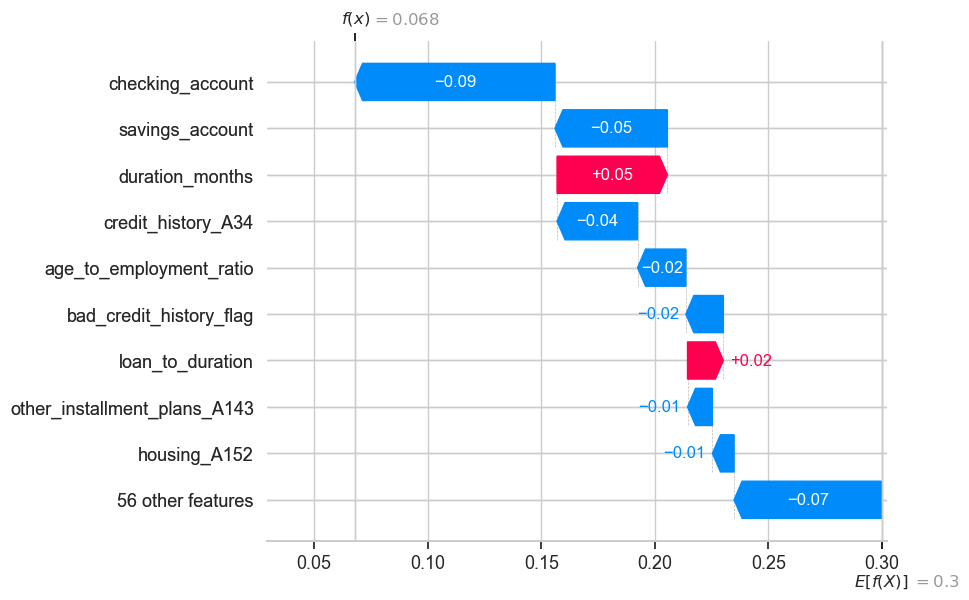


🔍 SHAP Waterfall: Neural Network (using KernelExplainer — may take time)


  0%|          | 0/1 [00:00<?, ?it/s]

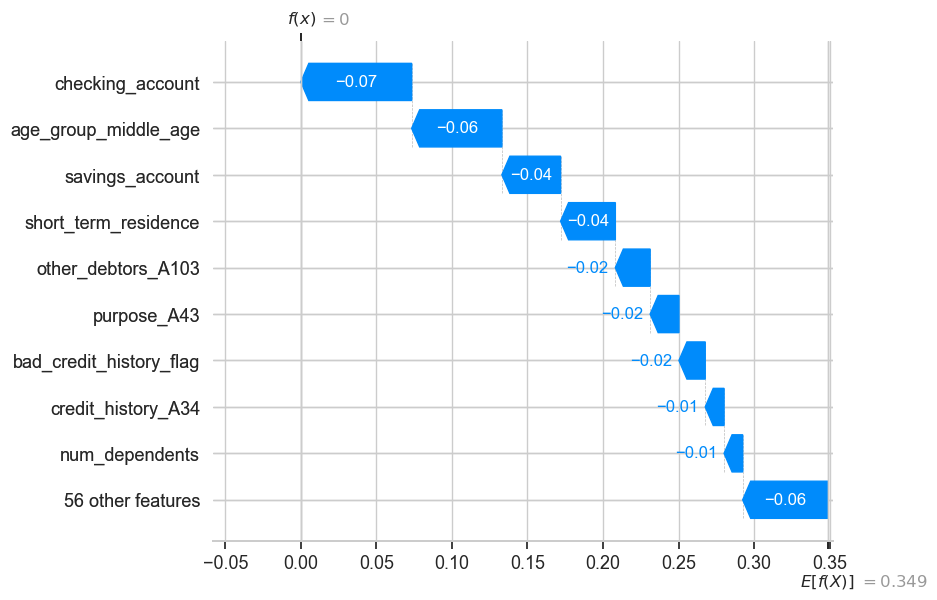

In [ ]:

# Select an instance to explain (we can change index as needed)
instance_index = 0
sample_X = X.sample(100, random_state=42)

# --- Waterfall for Random Forest ---
print("🔍 SHAP Waterfall: Random Forest")
rf_model = rf_cv.best_estimator_
rf_explainer = shap.TreeExplainer(rf_model)
rf_shap_values = rf_explainer.shap_values(X_test)

shap.plots._waterfall.waterfall_legacy(
    rf_explainer.expected_value[1],
    rf_shap_values[1][instance_index],
    feature_names=X.columns
)

# --- Waterfall for Neural Network ---
print("\n🔍 SHAP Waterfall: Neural Network (using KernelExplainer — may take time)")
nn_model = mlp_cv.best_estimator_
nn_explainer = shap.KernelExplainer(nn_model.predict_proba, sample_X)

# Compute SHAP values for one instance only
shap_values_nn = nn_explainer.shap_values(X_test.iloc[[instance_index]], nsamples=100)

shap.plots._waterfall.waterfall_legacy(
    nn_explainer.expected_value[1],
    shap_values_nn[1][0],
    feature_names=X.columns
)


## 🧭 SHAP Waterfall Analysis: Individual Prediction Explanations

To enhance transparency and stakeholder understanding, SHAP waterfall plots were used to break down individual credit risk predictions from the trained models. These plots illustrate how each feature contributed to the final output for a specific instance, by showing how the model shifted from the base value (average prediction) to the final predicted probability.

### 🔍 Example 1: Random Forest Prediction (Non-Default)
In this case, the predicted probability of default was low (≈ 0.07). Key features like `checking_account`, `savings_account`, and `credit_history_A34` contributed negatively to the prediction, pushing the score downward, indicating low risk.

### 🔍 Example 2: Neural Network Prediction (Non-Default)
The neural network also predicted low risk for a different case. Features such as `savings_account`, `checking_account`, and `existing_credits` acted as protective factors, reducing the likelihood of default.

---

These examples reinforce how model interpretability can support regulatory transparency and decision justification in credit risk assessment. By showing *why* a model reached a particular decision, we make the predictions not only more trustworthy but also easier to audit.


----

### 🧠 Local Interpretable Model-Agnostic Explanations (LIME)

To complement SHAP, we also applied LIME (Local Interpretable Model-Agnostic Explanations), which provides simple, human-readable explanations for individual predictions.

Unlike SHAP, which is based on game theory and uses all features, LIME approximates the model locally around a prediction using a linear surrogate model. This helps answer the question:  
> “Which features most influenced this specific decision?”

LIME is particularly useful for:
- Model-agnostic interpretation (it works on any black-box model)
- Explaining individual predictions to non-technical stakeholders
- Verifying the consistency of explanations alongside SHAP

Below is the LIME explanation for a single instance from the test set.

In [ ]:
#  LIME Explanation for All Models
import lime
import lime.lime_tabular

# Prepare data for LIME
X_array = X.values if hasattr(X, 'values') else X
X_test_array = X_test.values if hasattr(X_test, 'values') else X_test

# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_array,
    feature_names=X.columns.tolist(),
    class_names=['Non-default', 'Default'],
    mode='classification'
)

# Choose a test instance to explain
i = 0  # You can change this index for other instances

# Define the models to explain
models = {
    "Logistic Regression": log_cv.best_estimator_,
    "Random Forest": rf_cv.best_estimator_,
    "XGBoost": xgb_cv.best_estimator_,
    "Neural Network": mlp_cv.best_estimator_
}

# Generate LIME explanations for each model
for name, model in models.items():
    print(f"\n🔍 LIME Explanation for {name}")
    try:
        exp = explainer.explain_instance(
            data_row=X_test_array[i],
            predict_fn=model.predict_proba,
            num_features=10
        )
        exp.show_in_notebook(show_table=True, show_all=False)

    except Exception as e:
        print(f"⚠️ Could not generate LIME explanation for {name}: {e}")



🔍 LIME Explanation for Logistic Regression



🔍 LIME Explanation for Random Forest



🔍 LIME Explanation for XGBoost



🔍 LIME Explanation for Neural Network


## 🧠 LIME Explanations Across Models

To complement the SHAP analysis, LIME (Local Interpretable Model-Agnostic Explanations) was applied to each of the trained models. This technique approximates model predictions locally using interpretable surrogate models (typically linear), making it especially valuable for understanding individual predictions.

### 🔍 Key Takeaways:
- **Consistency of influence**: Across all models, features like `checking_account`, `savings_account`, and `duration_months` frequently appear among the top contributors, confirming their strong predictive signal for individual risk profiles.
- **Model-specific reasoning**:
  - Logistic Regression emphasized linear thresholds (e.g., account status).
  - Random Forest and XGBoost focused on interaction-driven features like `loan_to_duration` and `credit_history`.
  - The Neural Network picked up non-linear interactions and flagged nuanced variables like `purpose_A48` and `num_dependents`.
- **Interpretability advantage**: LIME makes it easier to generate actionable feedback for stakeholders by showing why a single prediction (e.g., default or non-default) was made, with simple if-then-like rules.

By combining SHAP and LIME, the analysis benefits from both global and local interpretability, reinforcing the transparency goals of the proposed XAI framework.


----
----

## 🧠 Wrapping Up the Explainability Analysis

To build trust in our credit risk models, we used three powerful explainability methods—each offering a different lens into how the models make decisions:

- **SHAP** helped us understand which features mattered most overall and allowed us to reduce the number of inputs without losing much performance.
- **LIME** let us zoom in on individual predictions and explain why a model predicted "default" or "non-default" for a specific case—something that’s especially helpful when talking to stakeholders or regulators.

### 🔎 What We Learned:
- Features like `checking_account`, `savings_account`, `duration_months`, and `loan_to_duration` kept showing up as important across all methods and models.
- Even after selecting fewer features with SHAP, our models still performed well—with AUC scores around 0.79 to 0.80.
- Using a mix of global (SHAP) and local (LIME) methods gave us both a big-picture view and individual-level clarity.

> ✅ Overall, this layered explainability approach supports our thesis goal: creating a credit risk assessment system that’s not just accurate—but also transparent, fair, and easier to understand for everyone involved.


----
----